# WiFi occupancy and post-Covid scenario paper

This notebook shall contain all steps necessary to create and run the scenarios for the WiFi occupancy and post-covid scenario paper. This includes:
1. Building energy model calibration
2. Electricity demand regression (as a function of occupancy, cooling load, and time of day)
3. Defining "typical" schedules for each building based on pre-pandemic occupancy schedule clustering
4. Creating the baseline and post-pandemic scenarios:
* Centralized: vary % of WFH occupants, lower building occupancy accordingly; no change in building opperation
* Occupant-driven: vary % of WFH occupants, lower building occupancy accordingly; adjust conditioned floor area accordingly
* Elastic: vary % of WFH occupants, lower district occupancy accordingly; redistribute occupants in most-efficient buildings
5. Simulating the effects of part load operation on supply system performance
6. Creating plots for the paper

In [1]:
# Import packages
import datetime
import geopandas as gpd
import itertools
import numpy as np
import os
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import shutil
import time
# Import Machine learning modules
import sklearn
from sklearn import metrics
from sklearn.ensemble import AdaBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from scipy.cluster.vq import kmeans, vq, whiten
from scipy.optimize import curve_fit
from scipy.spatial.distance import cdist
# Import CEA modules
import cea.config
from cea.utilities.dbf import *
from cea.utilities.epwreader import epw_reader
from cea.datamanagement.archetypes_mapper import archetypes_mapper
from cea.demand.schedule_maker.schedule_maker import main as schedule_maker
from cea.demand.demand_main import main as demand_main
from cea.resources.radiation_daysim.radiation_main import main as radiation_main

DAYSIM_BIN_DIRECTORY = os.path.join(os.getcwd(), 'CEA_model/0_daysim_binaries/darwin')
project_folder = os.path.join(os.getcwd(), 'CEA_model')

Define regression and calibration assessment metrics

In [2]:
def rmse(predicted, observed):
    return (((predicted - observed) ** 2).mean()) ** .5
def mbe(predicted, observed):
    return (predicted - observed).mean()
def cv_rmse(predicted, observed):
    return rmse(predicted, observed) / observed.mean()
def nmbe(predicted, observed):
    return mbe(predicted, observed) / observed.mean()

# 0. Get measured data
Measured data processed in Jupyter notebook `.\NUS_regression_analysis-2018-2020.ipynb`.

In [3]:
electricity_data = pd.read_csv(
    os.path.join(os.getcwd(), 'meter_data', 'processed_2018-2020', 'electricity_kWh_2018-2020.csv'),
    index_col=0, parse_dates=True)
cooling_data = pd.read_csv(
    os.path.join(os.getcwd(), 'meter_data', 'processed_2018-2020', 'cooling_kWh_2018-2020.csv'),
    index_col=0, parse_dates=True)
wifi_data = pd.read_csv(
    os.path.join(os.getcwd(), 'meter_data', 'processed_2018-2020', 'occupancy_wifi_2018-2020.csv'),
    index_col=0, parse_dates=True)
weather_data = pd.read_csv(
    os.path.join(os.getcwd(), 'meter_data', 'processed_2018-2020', 'weather_2018_and_2020.csv'),
    index_col=0, parse_dates=True)

## Select buildings for which we have electricity AND cooling AND wifi data

In [4]:
common_buildings = list(
    set(electricity_data.transpose().loc[electricity_data.sum() > 0].transpose().columns).intersection(
        set(cooling_data.transpose().loc[cooling_data.sum() > 0].transpose().columns),
        set(wifi_data.transpose().loc[wifi_data.sum() > 0].transpose().columns)))
common_buildings.sort()
electricity_data = electricity_data[common_buildings]
cooling_data = cooling_data[common_buildings]
wifi_data = wifi_data[common_buildings]

## Measured data cleanup
Outliers filtered out using Z-scores

### Electricity

In [5]:
max_Z_score = 5
Z_scores = (electricity_data - electricity_data.mean()) / electricity_data.std()

Text(0.5, 0.98, 'Total outliers: 150')

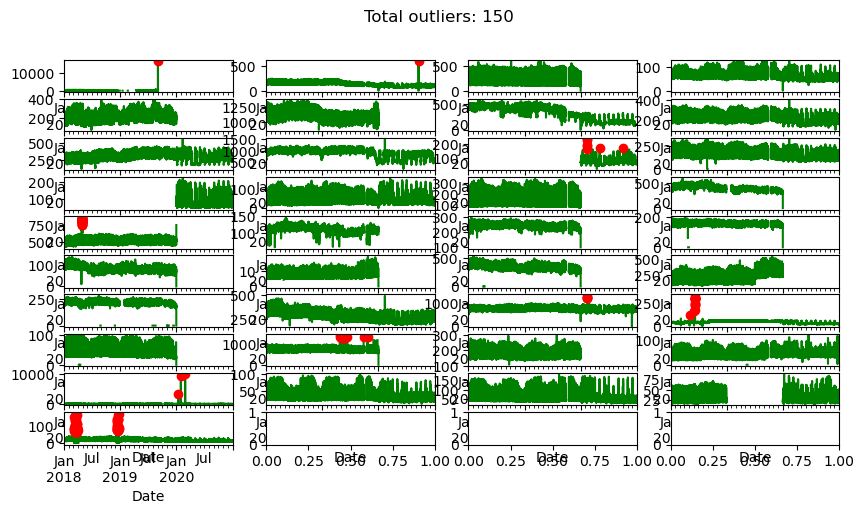

In [6]:
n_cols = 4
n_rows = len(common_buildings) // n_cols + 1
fig, ax = plt.subplots(n_rows, n_cols, figsize=(2.5 * n_cols, 0.5 * n_rows))
total_outliers = 0
for n, building in enumerate(electricity_data.columns):
    i = n // n_cols
    j = n % n_cols
    electricity_data[building].plot(ax=ax[i][j], legend=False, color='g')
    if len(electricity_data.loc[Z_scores[building] > max_Z_score, building]) > 0:
        electricity_data.loc[Z_scores[building] > max_Z_score, building].plot(
            ax=ax[i][j], marker='o', color='r', linewidth=0)
    total_outliers += len(Z_scores.loc[Z_scores[building] > max_Z_score])
fig.suptitle('Total outliers: {}'.format(total_outliers))

In [7]:
while (Z_scores > max_Z_score).sum().sum() > 0:
    for building in electricity_data.columns:
        electricity_data.loc[Z_scores[building] > max_Z_score, building] = np.nan
    Z_scores = np.abs(electricity_data - electricity_data.mean()) / electricity_data.std()

Text(0.5, 0.98, 'Total outliers: 0')

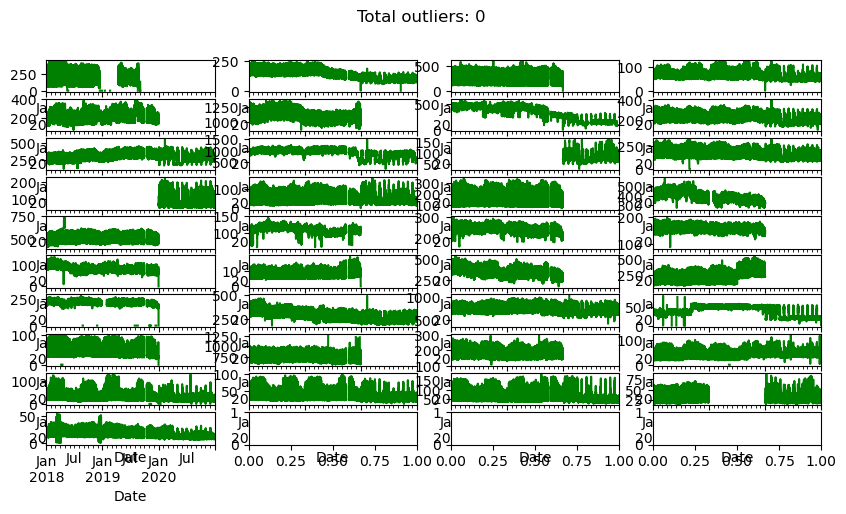

In [8]:
n_cols = 4
n_rows = len(common_buildings) // n_cols + 1
fig, ax = plt.subplots(n_rows, n_cols, figsize=(2.5 * n_cols, 0.5 * n_rows))
total_outliers = 0
for n, building in enumerate(electricity_data.columns):
    i = n // n_cols
    j = n % n_cols
    electricity_data[building].plot(ax=ax[i][j], legend=False, color='g')
    if len(electricity_data.loc[Z_scores[building] > max_Z_score, building]) > 0:
        electricity_data.loc[Z_scores[building] > max_Z_score, building].plot(
            ax=ax[i][j], marker='o', color='r', linewidth=0)
    total_outliers += len(Z_scores.loc[Z_scores[building] > max_Z_score])
fig.suptitle('Total outliers: {}'.format(total_outliers))

### Cooling

In [9]:
max_Z_score = 5
Z_scores = np.abs(cooling_data - cooling_data.mean()) / cooling_data.std()

Text(0.5, 0.98, 'Total outliers: 964')

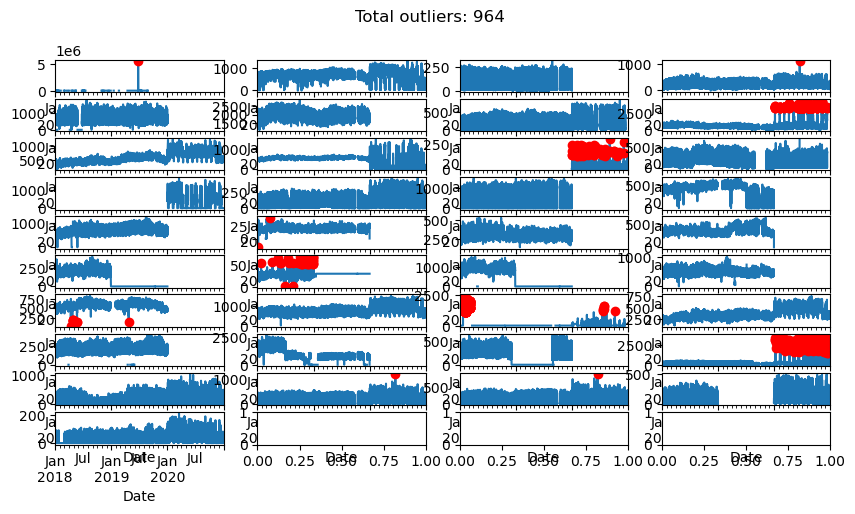

In [10]:
fig, ax = plt.subplots(n_rows, n_cols, figsize=(2.5 * n_cols, 0.5 * n_rows))
total_outliers = 0
for n, building in enumerate(cooling_data.columns):
    i = n // n_cols
    j = n % n_cols
    cooling_data[building].plot(ax=ax[i][j], legend=False)
    if len(cooling_data.loc[Z_scores[building] > max_Z_score, building]) > 0:
        cooling_data.loc[Z_scores[building] > max_Z_score, building].plot(
            ax=ax[i][j], marker='o', color='r', linewidth=0)
    total_outliers += len(Z_scores.loc[Z_scores[building] > max_Z_score])
fig.suptitle('Total outliers: {}'.format(total_outliers))

In [11]:
while (Z_scores > max_Z_score).sum().sum() > 0:
    for building in cooling_data.columns:
        cooling_data.loc[Z_scores[building] > max_Z_score, building] = np.nan
    Z_scores = np.abs(cooling_data - cooling_data.mean()) / cooling_data.std()

Text(0.5, 0.98, 'Total outliers: 0')

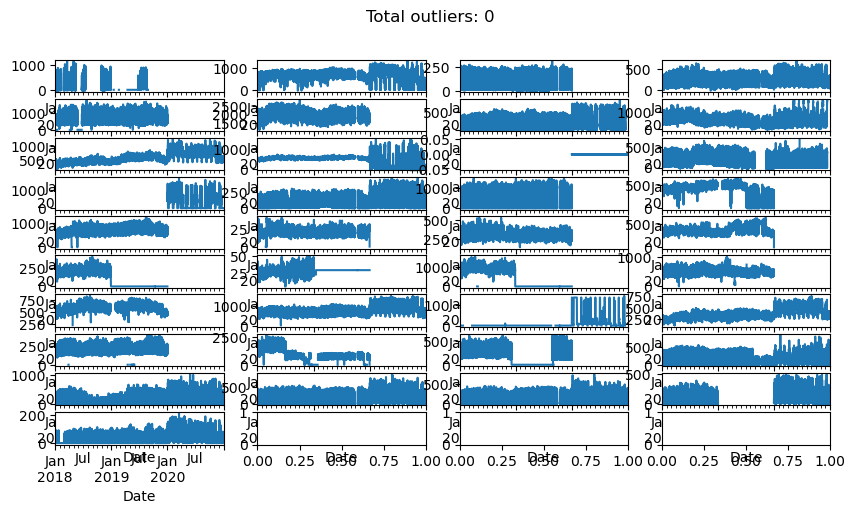

In [12]:
fig, ax = plt.subplots(n_rows, n_cols, figsize=(2.5 * n_cols, 0.5 * n_rows))
total_outliers = 0
for n, building in enumerate(cooling_data.columns):
    i = n // n_cols
    j = n % n_cols
    cooling_data[building].plot(ax=ax[i][j], legend=False)
    if len(cooling_data.loc[Z_scores[building] > max_Z_score, building]) > 0:
        cooling_data.loc[Z_scores[building] > max_Z_score, building].plot(
            ax=ax[i][j], marker='o', color='r', linewidth=0)
#     ax[i].set_ylabel(building + ': ' + str(len(Z_scores.loc[Z_scores[building] > max_Z_score])) + 
#                      ' outliers')
    total_outliers += len(Z_scores.loc[Z_scores[building] > max_Z_score])
fig.suptitle('Total outliers: {}'.format(total_outliers))

# 0. Prepare data for calibration and regression
Create a dict containing each building's data set individually as a DataFrame

In [13]:
building_data_dict = {}
for building in electricity_data.columns:
    building_index = list(set(electricity_data[building].dropna().index).intersection(
        set(cooling_data[building].dropna().index), set(wifi_data[building].dropna().index)))
    building_index.sort()
    building_data_dict[building] = pd.DataFrame(
        data=0.0, index=building_index,
        columns=['electricity_kWh', 'cooling_kWh', 'people', 'hour', 'temperature_C', 'humidity_pc'])
    building_data_dict[building][
        'electricity_kWh'] = electricity_data.loc[building_data_dict[building].index, building]
    building_data_dict[building]['cooling_kWh'] = cooling_data.loc[building_data_dict[building].index, building]
    building_data_dict[building]['people'] = wifi_data.loc[building_data_dict[building].index, building]
    building_data_dict[building]['hour'] = building_data_dict[building].index.hour
    building_data_dict[building]['temperature_C'] = weather_data.loc[building_data_dict[building].index, 
                                                                     'drybulb_C']
    building_data_dict[building]['humidity_pc'] = weather_data.loc[building_data_dict[building].index, 
                                                                   'relhum_percent']

# 1. Calibration

## Import baseline model from CEA

In [15]:
zone_gdf = gpd.read_file(
    os.path.join(project_folder, 'baseline', '2018', 'inputs', 'building-geometry', 'zone.shp'))
list_buildings = list(electricity_data.columns)
list_buildings.sort()

In [18]:
# Drop two buildings with measurement issues
drop_buildings = ['B1058', 'B1134']
list_buildings = [b for b in list_buildings if b not in drop_buildings]

## Create baseline schedules

In [73]:
import cea.config
config = cea.config.Configuration()
config.multiprocessing = True
for year in ['2018', '2020']:
    config.project = os.path.join(project_folder, 'baseline')
    config.scenario_name = year
    config.archetypes_mapper.buildings = list_buildings
    config.schedule_maker.buildings = list_buildings
    archetypes_mapper(locator=cea.inputlocator.InputLocator(config.scenario), 
                      update_architecture_dbf=False, update_air_conditioning_systems_dbf=False, 
                      update_indoor_comfort_dbf=False, update_internal_loads_dbf=False, 
                      update_supply_systems_dbf=False, update_schedule_operation_cea=True, 
                      buildings=list_buildings)
    schedule_maker(config)

Running occupancy model for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/baseline/2018
Running occupancy model  with schedule model=deterministic
Using 7 CPU's
Schedule for building No. 1 completed out of 37: B1053
Schedule for building No. 2 completed out of 37: B1008
Schedule for building No. 3 completed out of 37: B1050
Schedule for building No. 4 completed out of 37: B1026
Schedule for building No. 5 completed out of 37: B1003
Schedule for building No. 6 completed out of 37: B1064
Schedule for building No. 7 completed out of 37: B1058
Schedule for building No. 8 completed out of 37: B1016
Schedule for building No. 9 completed out of 37: B1047
Schedule for building No. 10 completed out of 37: B1052
Schedule for building No. 11 completed out of 37: B1081
Schedule for building No. 12 completed out of 37: B1055
Schedule for building No. 13 completed out of 37: B1005
Schedule for building No. 14 completed out of 37: B1063
Schedule for building No. 15 completed out of 37: B1

In [362]:
import cea.config
config = cea.config.Configuration()
config.multiprocessing = True
for year in ['2018', '2020']:
    config.project = os.path.join(project_folder, 'baseline')
    config.scenario_name = year
    config.demand.buildings = list_buildings
    demand_main(config)

Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/baseline/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1058', 'B1063', 'B1064', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1134', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 37

# Run building energy model calibration

## Create calibration scenarios

In [ ]:
if not os.path.isdir(os.path.join(project_folder, 'calibration')):
    os.mkdir(os.path.join(project_folder, 'calibration'))
for year in ['2018', '2020']:
    shutil.copytree(os.path.join(project_folder, 'baseline', year),
                    os.path.join(project_folder, 'calibration', year))

In [17]:
calibration_2018_path = os.path.join(project_folder, 'calibration', '2018', 'inputs', 'building-geometry')
for scenario in ['baseline', 'calibration']:
    for year in ['2018', '2020']:
        scenario_path = os.path.join(project_folder, scenario, year, 'inputs', 'building-geometry')
        if scenario_path != calibration_2018_path:
            for path_name in [f for f in os.listdir(calibration_2018_path) if 'surroundings' in f]:
                if os.path.isfile(os.path.join(calibration_2018_path, path_name)):
                    shutil.copy(os.path.join(calibration_2018_path, path_name),
                                os.path.join(scenario_path, path_name))
                elif os.path.isdir(os.path.join(calibration_2018_path, path_name)):
                    shutil.copytree(os.path.join(calibration_2018_path, path_name),
                                    os.path.join(scenario_path, path_name))

## Adjust input schedules

In [42]:
# import building properties
indoor_comfort = dbf_to_dataframe(os.path.join(project_folder, 'baseline', '2018', 'inputs',
                                               'building-properties', 'indoor_comfort.dbf')).set_index('Name')
internal_loads = dbf_to_dataframe(os.path.join(project_folder, 'baseline', '2018', 'inputs',
                                               'building-properties', 'internal_loads.dbf')).set_index('Name')

# create building schedules and store them in a dict
building_schedule_dict = {}
for building in building_data_dict.keys():
    building_schedule_dict[building] = {}
    
    # get current building data
    building_data_nona = {'electricity_kWh': electricity_data[building].dropna(),
                          'cooling_kWh': cooling_data[building].dropna(),
                          'people': wifi_data[building].dropna()}
    
    # define 2020 focus periods
    pre_circuit_breaker = list(pd.date_range('2020-01-01 00:00', '2020-02-28 23:59', freq='H')) + list(
        pd.date_range('2020-03-01 00:00', '2020-04-06 23:59', freq='H'))
    pre_circuit_breaker_days = list(set([i.date() for i in pre_circuit_breaker]))
    pre_circuit_breaker_days.sort()
    circuit_breaker = pd.date_range('2020-04-07 00:00', '2020-05-31 23:59', freq='H')

    for year in set([y for y in building_data_dict[building].index.year.unique()]) & set([2018, 2020]):
        # import archetypal schedule
        base_schedule = pd.read_csv(os.path.join(
            project_folder, 'baseline', str(year), 'outputs', 'data', 'occupancy', building + '.csv'),
                                    index_col=0, parse_dates=True)

        building_data = dict(zip(building_data_nona.keys(), [
            building_data_nona[key].loc[(building_data_nona[key].index.year == year) &
                                        (building_data_nona[key].index.date != datetime.date(2020, 2, 29))]
            for key in building_data_nona.keys()]))

        # Get rid of incorrect constant measurements
        for d in building_data.keys():
            if np.isclose(building_data[d].mean(), building_data[d].max()):
                building_data[d] = pd.Series()

        # Define weekday and weekend schedules
        weekday_schedule = pd.DataFrame(dict(zip(
            [column for column in building_data.keys() if len(building_data[column]) > 0], 
            [building_data[column].loc[(building_data[column].index.year==year) &
                                       (building_data[column].index.weekday < 5)].to_frame().pivot_table(
                index=building_data[column].loc[(building_data[column].index.year==year) &
                                                (building_data[column].index.weekday < 5)].index.time,
                columns=building_data[column].loc[(building_data[column].index.year==year) &
                                                  (building_data[column].index.weekday < 5)].index.date,
                values=building).mean(axis=1).values for column in building_data.keys()
             if len(building_data[column]) > 0])))
        weekend_schedule = pd.DataFrame(dict(zip(
            [column for column in building_data.keys() if len(building_data[column]) > 0],
            [building_data[column].loc[(building_data[column].index.year==year) & 
                                       (building_data[column].index.weekday >= 5)].to_frame().pivot_table(
                index=building_data[column].loc[(building_data[column].index.year==year) & 
                                                (building_data[column].index.weekday >= 5)].index.time,
                columns=building_data[column].loc[(building_data[column].index.year==year) & 
                                                  (building_data[column].index.weekday >= 5)].index.date,
                values=building).mean(axis=1).values for column in building_data.keys()
            if len(building_data[column]) > 0])))

        # get occupant schedule
        people_array = base_schedule.people_p.values
        base_schedule.loc[building_data['people'].index, 'people_p'] = building_data['people'].loc[
            building_data['people'].index]

        # Define comfort setpoints
        T_setpoint = indoor_comfort.loc[building, 'Tcs_set_C']
        Ve_lsp = indoor_comfort.loc[building, 'Ve_lsp']

        if 'cooling_kWh' in weekday_schedule.columns:
            # define cooling schedules
            # get base load by regression
            base = building_data['cooling_kWh'].replace(0, np.nan).dropna().loc[
                building_data['cooling_kWh'].replace(0, np.nan).dropna().index.hour.isin([4,5])].mean()
            if np.isnan(base):
                base = 0
            # select hours in which the load is greater than the base load 50% of the time
            selection = (building_data['cooling_kWh'] > base).to_frame().pivot_table(
                index=(building_data['cooling_kWh'] > base).index.hour,
                columns=(building_data['cooling_kWh'] > base).index.date,
                values=building).mean(axis=1)
            selection = (selection - selection.min()) / (selection.max() - selection.min())
            selection = (selection > 0.5)
            # if the cooling systems are on overnight, put stricter conditions to make sure this is correct
            if selection[0] or selection[23]:
                selection = (building_data['cooling_kWh'].to_frame().pivot_table(
                    index=building_data['cooling_kWh'].index.hour,
                    columns=building_data['cooling_kWh'].index.date,
                    values=building)).mean(axis=1)
                selection = (selection - selection.min())/(selection.max() - selection.min())
                selection = selection > 0.2
            # get rid of inexplicable hours where the systems go on for one hour and shut off
            selection = selection * ((selection[list(selection[1:].index) + [0]].values) |
                                     (selection[[23] + list(selection[0:-1].index)].values))
            if selection.sum() > 0:
                # assign schedules
                for h in selection.index:
                    base_schedule.loc[base_schedule.index.hour == h, 'Tcs_set_C'] = selection[h] * T_setpoint
                base_schedule.loc[base_schedule.Tcs_set_C == 0.0, 'Tcs_set_C'] = 'OFF'
                base_schedule.loc[base_schedule.Tcs_set_C == 'OFF', 'Qcpro_W'] = (
                    (base_schedule.Tcs_set_C == 'OFF') * building_data['cooling_kWh']) * 1000
                base_schedule.loc[base_schedule.Tcs_set_C != 'OFF', 'Qcpro_W'] = np.nan
                base_schedule['Qcpro_W'].interpolate(inplace=True)
            else:
                base_schedule['Qcpro_W'] = base

        # fill in missing data
        occupant_indeces_2020 = []
        if year == 2020:
            if 'people' in weekday_schedule.columns:
                ## create circuit breaker period
                base_schedule.loc[circuit_breaker, 'people_p'] = 0
                weekday_max = base_schedule.loc[[i for i in pre_circuit_breaker if i.weekday() < 5]].max()
                weekend_max = base_schedule.loc[[i for i in pre_circuit_breaker if i.weekday() >= 5]].max()
                for d in pre_circuit_breaker_days:
                    if d.weekday() < 5:
                        base_schedule.loc[base_schedule.index.date == d, 'people_p'] = (weekday_schedule[
                            'people'].values / weekday_schedule['people'].max()) * weekday_max['people_p']
                    if d.weekday() >= 5:
                        base_schedule.loc[base_schedule.index.date == d, 'people_p'] = (weekend_schedule[
                            'people'].values / weekend_schedule['people'].max()) * weekend_max['people_p']
                occupant_indeces_2020 = pre_circuit_breaker + list(circuit_breaker)
        if 'cooling_kWh' in weekday_schedule.columns:
            for i in [j for j in base_schedule.index if j not in building_data['cooling_kWh'].index]:
                base_schedule.loc[i, 'Qcpro_W'] = base * 1000
                base_schedule.loc[i, 'Tcs_set_C'] = (
                    (weekday_schedule['cooling_kWh'] > base) * T_setpoint)[i.hour]
        base_schedule.loc[base_schedule['Qcpro_W'].isna(), 'Qcpro_W'] = base * 1000

        if 'people' in weekday_schedule.columns:
            for i in [j for j in base_schedule.index if j not in occupant_indeces_2020]:
                if i in building_data['people'].index:
                    if i.weekday() < 5:
                        base_schedule.loc[i, 'people_p'] = (
                            weekday_schedule.loc[i.hour, 'people'] / weekday_schedule[
                                'people'].max()) * building_data['people'].loc[
                            building_data['people'].index.date == i.date()].max() # , 'people'].max()
                    if i.weekday() >= 5:
                        base_schedule.loc[i, 'people_p'] = (
                            weekend_schedule.loc[i.hour, 'people'] / weekend_schedule[
                                'people'].max()) * building_data['people'].loc[
                            building_data['people'].index.date == i.date()].max() # , 'people'].max()
                else:
                    if i.weekday() < 5:
                        if i not in occupant_indeces_2020:
                            base_schedule.loc[i, 'people_p'] = weekday_schedule.loc[i.hour, 'people']
                    if i.weekday() >= 5:
                        if i not in occupant_indeces_2020:
                            base_schedule.loc[i, 'people_p'] = weekend_schedule.loc[i.hour, 'people']

        # adjust building operation schedules based on number of people
        base_schedule['people_p'] = base_schedule['people_p'].astype(int)
        base_schedule['Ve_lps'] = base_schedule['people_p'] * Ve_lsp
        base_schedule['Qs_W'] = base_schedule['people_p'] * internal_loads.loc[building, 'Qs_Wp']
        base_schedule['X_gh'] = base_schedule['people_p'] * internal_loads.loc[building, 'X_ghp']
        base_schedule['Vw_lph'] *= np.nan_to_num(base_schedule.people_p.values / people_array, 0)
        base_schedule['Vww_lph'] *= np.nan_to_num(base_schedule.people_p.values / people_array, 0)
        
        # create electricity and process cooling schedules from measured data
        base = building_data['electricity_kWh'].loc[
            building_data['electricity_kWh'].index.hour.isin([4, 5])].mean()
        base_schedule.Ea_W = 0.0
        base_schedule.El_W = building_data['electricity_kWh'] * 1000
        for i in base_schedule.loc[base_schedule['El_W'].isna()].index:
            if i.weekday() < 5:
                base_schedule.loc[i, 'El_W'] = weekday_schedule.loc[i.hour, 'electricity_kWh'] * 1000
            else:
                base_schedule.loc[i, 'El_W'] = weekend_schedule.loc[i.hour, 'electricity_kWh'] * 1000
        base_schedule.Ev_W = base * 1000
        base_schedule.loc[base_schedule['El_W'] <= base * 1000, 'Ev_W'] = base_schedule.loc[
            base_schedule['El_W'] <= base * 1000, 'El_W']
        base_schedule.El_W -= base_schedule.Ev_W
        base_schedule.loc[base_schedule.El_W < 0, 'El_W'] = 0
        
        # export building schedule for current year
        building_schedule_dict[building][year] = base_schedule

In [1311]:
for year in ['2018', '2020']:
    if not os.path.isdir(
        os.path.join(project_folder, 'calibration', year, 'outputs', 'data', 'occupancy-archetype')):
        os.rename(os.path.join(project_folder, 'calibration', year, 'outputs', 'data', 'occupancy'),
                  os.path.join(project_folder, 'calibration', year, 'outputs', 'data', 'occupancy-archetype'))
    if not os.path.isdir(
        os.path.join(project_folder, 'calibration', year, 'outputs', 'data', 'occupancy')):
        os.mkdir(os.path.join(project_folder, 'calibration', year, 'outputs', 'data', 'occupancy'))
    for building in building_schedule_dict.keys():
        if int(year) in building_schedule_dict[building].keys():
            building_schedule_dict[building][int(year)].to_csv(os.path.join(
                project_folder, 'calibration', year, 'outputs', 'data', 'occupancy', building + '.csv'))

In [1312]:
for year in ['2018', '2020']:
    if not os.path.isdir(
        os.path.join(project_folder, 'calibration', year, 'outputs', 'data', 'occupancy_orig')):
        os.rename(os.path.join(project_folder, 'calibration', year, 'outputs', 'data', 'occupancy'),
                  os.path.join(project_folder, 'calibration', year, 'outputs', 'data', 'occupancy_orig'))

In [1313]:
print('schedules done!')

schedules done!


In [25]:
building_schedule_dict = dict(zip(list_buildings, [{} for b in list_buildings]))
for building in building_schedule_dict.keys():
    for year in ['2018', '2020']:
        if os.path.isfile(os.path.join(
            project_folder, 'calibration', year, 'outputs', 'data', 'occupancy_orig', building + '.csv')):
            building_schedule_dict[building][int(year)] = pd.read_csv(os.path.join(
                project_folder, 'calibration', year, 'outputs', 'data', 'occupancy_orig', building + '.csv'),
                                                                      index_col=0, parse_dates=True)

## Define calibration parameters

In [26]:
heating_shares = [1.0]
wwrs = [np.round(i, 2) for i in np.arange(0.29, 0.9, 0.1)]
temperatures = list(range(18, 29, 2))
setp_setb = [(i, j) for i in temperatures for j in temperatures + ['OFF'] if (isinstance(j, str)) or (j >= i)]
tightnesses = ['TIGHTNESS_AS' + str(i) for i in range(2, 5)]
windows = ['WINDOW_AS8', 'WINDOW_AS9', 'WINDOW_AS10']
setback = 'OFF'
n_combinations = len(windows) * len(setp_setb) * len(heating_shares) * len(wwrs) * len(tightnesses)
print(str(n_combinations) + ' total combinations')
print('heating shares:', len(heating_shares), '; wwrs:', len(wwrs), '; setpoints:', len(setp_setb), 
      '; tightnesses:', len(tightnesses), '; windows:', len(windows))

1701 total combinations
heating shares: 1 ; wwrs: 7 ; setpoints: 27 ; tightnesses: 3 ; windows: 3


In [27]:
schedule_combinations = ['-'.join([str(i) for i in sp_sb]) for sp_sb in setp_setb]
architecture_combinations = ['-'.join([window, tightness, str(wwr), str(heating_share)])
                             for window in windows for tightness in tightnesses for wwr in wwrs 
                             for heating_share in heating_shares]
all_combinations = ['-'.join([architecture_combination, schedule_combination])
                    for architecture_combination in architecture_combinations
                    for schedule_combination in schedule_combinations]
print(len(all_combinations), len(architecture_combinations), len(schedule_combinations))

1701 63 27


### Prepare CEA config file

In [29]:
import cea.config
config = cea.config.Configuration()
config.project = os.path.join(project_folder, 'calibration')
config.multiprocessing = True

# Define years for calibration scenarios
calibration_years = ['2018', '2020']

In [39]:
# define year to consider for each building
# select 2018 if available as 2020 is an exceptional year
years_by_building = dict(zip(list_buildings, [str(min(building_schedule_dict[b].keys())) for b in list_buildings]))
buildings_by_year = dict(zip(calibration_years,
                             [[b for b in years_by_building.keys() if years_by_building[b] == y]
                              for y in calibration_years]))
[len(buildings_by_year[y]) for y in buildings_by_year.keys()]

[34, 1]

### Create schedules for each schedule combination

In [41]:
for year in calibration_years:
    if not os.path.isdir(os.path.join(config.project, year, 'outputs', 'data', 'occupancy_calib')):
        os.mkdir(os.path.join(config.project, year, 'outputs', 'data', 'occupancy_calib'))                
    if not os.path.isdir(os.path.join(config.project, year, 'outputs', 'data', 'occupancy_orig')):
        os.rename(os.path.join(config.project, year, 'outputs', 'data', 'occupancy'),
                  os.path.join(config.project, year, 'outputs', 'data', 'occupancy_orig'))
    for schedule_combination in schedule_combinations:
        setpoint = int(schedule_combination.split('-')[0])
        try:
            setback = int(schedule_combination.split('-')[1])
        except ValueError:
            setback = schedule_combination.split('-')[1]
        if not os.path.isdir(os.path.join(
            config.project, year, 'outputs', 'data', 'occupancy_calib', schedule_combination)):
            os.mkdir(os.path.join(
                config.project, year, 'outputs', 'data', 'occupancy_calib', schedule_combination))

        for building in buildings_by_year[year]:
            # create occupancy schedules
            if not os.path.isfile(os.path.join(config.project, year, 'outputs', 'data', 'occupancy_calib', 
                                               schedule_combination, building + '.csv')):
                # import occupancy schedule
                occupancy_schedule = pd.read_csv(os.path.join(
                    config.project, year, 'outputs', 'data', 'occupancy_orig', building + '.csv'), 
                    index_col=0, parse_dates=True)

                ## Set point and setback temperatures
                occupancy_schedule.loc[occupancy_schedule.Tcs_set_C != 'OFF', 'Tcs_set_C'] = setpoint
                occupancy_schedule.loc[occupancy_schedule.Tcs_set_C == 'OFF', 'Tcs_set_C'] = setback

                # save occupancy schedule and make a copy
                occupancy_schedule.to_csv(os.path.join(
                    config.project, year, 'outputs', 'data', 'occupancy_calib', schedule_combination,
                                                       building + '.csv'))

### Create architecture file for each combination

In [42]:
t0 = time.time()

# back up original files if necessary
for year in calibration_years:
    if not os.path.isdir(os.path.join(config.project, year, 'inputs', 'building-properties', 'orig')):
        os.mkdir(os.path.join(config.project, year, 'inputs', 'building-properties', 'orig'))
        for file_name in [f for f in os.listdir(os.path.join(
            config.project, year, 'inputs', 'building-properties')) if 'dbf' in f]:
            shutil.copy(os.path.join(config.project, year, 'inputs', 'building-properties', file_name),
                        os.path.join(config.project, year, 'inputs', 'building-properties', 'orig', file_name))

# create new dbf files
for year in calibration_years:
    buildings = buildings_by_year[year]
    if not os.path.isdir(os.path.join(
        config.project, year, 'inputs', 'building-properties', 'architecture_calib')):
        os.mkdir(os.path.join(config.project, year, 'inputs', 'building-properties', 'architecture_calib'))
    for heating_share in heating_shares:
        for wwr in wwrs:
            for tightness in tightnesses:
                for window in windows:
                    combination = '-'.join([window, tightness, str(wwr), str(heating_share)])

                    # skip combinations that are already done
                    if not os.path.isdir(os.path.join(
                        config.project, year, 'inputs', 'building-properties', 'architecture_calib', 
                        'architecture_' + combination + '.dbf')):
                        # create input architecture
                        architecture = dbf_to_dataframe(
                            os.path.join(config.project, year, 'inputs', 'building-properties', 'orig', 
                                         'architecture.dbf')).set_index('Name')
                        architecture.loc[buildings, 'type_win'] = window
                        architecture.loc[buildings, 'type_leak'] = tightness
                        architecture.loc[buildings, 
                                         ['wwr_north', 'wwr_west', 'wwr_east', 'wwr_south']] = wwr
                        architecture.loc[buildings, 'Hs_ag'] = heating_share * architecture.loc[buildings,
                                                                                                'Ns']
                        architecture.loc[buildings, 'Es'] = architecture.loc[buildings, 'Ns']
                        
                        # export architecture inputs for current combination
                        dataframe_to_dbf(architecture.reset_index(), os.path.join(
                            config.project, year, 'inputs', 'building-properties', 'architecture_calib',
                            'architecture_' + combination + '.dbf'))

print('architecture creation done:', time.time()-t0, 'seconds')

architecture creation done: 7.648176908493042 seconds


### Run solar radiation simulation

In [183]:
for year in ['2018', '2020']:
    import cea.config
    config = cea.config.Configuration()
    config.multiprocessing = True
    config.project = os.path.join(project_folder, 'calibration')
    config.scenario_name = year
    config.radiation.buildings = list_buildings
    shutil.copy(os.path.join(config.scenario, 'inputs', 'building-properties', 'architecture.dbf'),
                os.path.join(config.scenario, 'inputs', 'building-properties', 'orig', 'architecture.dbf'))
    for wwr in [np.round(i, 2) for i in np.arange(0.29, 0.9, 0.1)]:
        if not os.path.isdir(os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation-' + str(wwr))):
            architecture_dbf = dbf_to_dataframe(os.path.join(
                config.scenario, 'inputs', 'building-properties', 'architecture.dbf')).set_index('Name')
            architecture_dbf.loc[list_buildings, [c for c in architecture_dbf.columns if 'wwr' in c]] = wwr
            radiation_main(config)
            os.rename(os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation'),
                      os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation-' + str(wwr)))

Using Daysim binaries from path: /Users/martin/Documents/GitHub/CityEnergyAnalyst/setup/Dependencies/Daysim/mac
Using Daysim data from path: /Users/martin/Documents/GitHub/CityEnergyAnalyst/setup/Dependencies/Daysim/lib
verifying geometry files
zone: /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020/inputs/building-geometry/zone.shp
surroundings: /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020/inputs/building-geometry/surroundings.shp
Getting geometry materials
Creating 3D geometry and surfaces
Saving geometry pickle files in: /var/folders/fj/jhstllfn1n9cmkpr9bnqypkc0000gq/T/2020_radiation_geometry_pickle
Standardizing coordinate systems
Reading terrain geometry
Creating 3D building surfaces
Calculating terrain intersection of building geometries
Using 7 CPU's
Calculation of terrain intersection for building 1 completed out of 362
Calculation of terrain intersection for building 2 completed out of 362
Calculation of terrain intersection for building 3 

Calculation of terrain intersection for building 110 completed out of 362
Calculation of terrain intersection for building 111 completed out of 362
Calculation of terrain intersection for building 112 completed out of 362
Calculation of terrain intersection for building 113 completed out of 362
Calculation of terrain intersection for building 114 completed out of 362
Calculation of terrain intersection for building 115 completed out of 362
Calculation of terrain intersection for building 116 completed out of 362
Calculation of terrain intersection for building 117 completed out of 362
Calculation of terrain intersection for building 118 completed out of 362
Calculation of terrain intersection for building 119 completed out of 362
Calculation of terrain intersection for building 120 completed out of 362
Calculation of terrain intersection for building 121 completed out of 362
Calculation of terrain intersection for building 122 completed out of 362
Calculation of terrain intersection fo

Calculation of terrain intersection for building 224 completed out of 362
Calculation of terrain intersection for building 225 completed out of 362
Calculation of terrain intersection for building 226 completed out of 362
Calculation of terrain intersection for building 227 completed out of 362
Calculation of terrain intersection for building 228 completed out of 362
Calculation of terrain intersection for building 229 completed out of 362
Calculation of terrain intersection for building 230 completed out of 362
Calculation of terrain intersection for building 231 completed out of 362
Calculation of terrain intersection for building 232 completed out of 362
Calculation of terrain intersection for building 233 completed out of 362
Calculation of terrain intersection for building 234 completed out of 362
Calculation of terrain intersection for building 235 completed out of 362
Calculation of terrain intersection for building 236 completed out of 362
Calculation of terrain intersection fo

Calculation of terrain intersection for building 335 completed out of 362
Calculation of terrain intersection for building 336 completed out of 362
Calculation of terrain intersection for building 337 completed out of 362
Calculation of terrain intersection for building 338 completed out of 362
Calculation of terrain intersection for building 339 completed out of 362
Calculation of terrain intersection for building 340 completed out of 362
Calculation of terrain intersection for building 341 completed out of 362
Calculation of terrain intersection for building 342 completed out of 362
Calculation of terrain intersection for building 343 completed out of 362
Calculation of terrain intersection for building 344 completed out of 362
Calculation of terrain intersection for building 345 completed out of 362
Calculation of terrain intersection for building 346 completed out of 362
Calculation of terrain intersection for building 347 completed out of 362
Calculation of terrain intersection fo

Generating geometry for building 8 completed out of 362
Generating geometry for building 9 completed out of 362
Generating geometry for building 10 completed out of 362
Generating geometry for building 11 completed out of 362
Generating geometry for building 12 completed out of 362
Generating geometry for building 13 completed out of 362
Generating geometry for building 14 completed out of 362
Generating geometry for building 15 completed out of 362
Generating geometry for building 16 completed out of 362
Generating geometry for building 17 completed out of 362
Generating geometry for building 18 completed out of 362
Generating geometry for building 19 completed out of 362
Generating geometry for building 20 completed out of 362
Generating geometry for building 21 completed out of 362
Generating geometry for building 22 completed out of 362
Generating geometry for building 23 completed out of 362
Generating geometry for building 24 completed out of 362
Generating geometry for building 

Generating geometry for building 153 completed out of 362
Generating geometry for building 154 completed out of 362
Generating geometry for building 155 completed out of 362
Generating geometry for building 156 completed out of 362
Generating geometry for building 157 completed out of 362
Generating geometry for building 158 completed out of 362
Generating geometry for building 159 completed out of 362
Generating geometry for building 160 completed out of 362
Generating geometry for building 161 completed out of 362
Generating geometry for building 162 completed out of 362
Generating geometry for building 163 completed out of 362
Generating geometry for building 164 completed out of 362
Generating geometry for building 165 completed out of 362
Generating geometry for building 166 completed out of 362
Generating geometry for building 167 completed out of 362
Generating geometry for building 168 completed out of 362
Generating geometry for building 169 completed out of 362
Generating geo

Generating geometry for building 295 completed out of 362
Generating geometry for building 296 completed out of 362
Generating geometry for building 297 completed out of 362
Generating geometry for building 298 completed out of 362
Generating geometry for building 299 completed out of 362
Generating geometry for building 300 completed out of 362
Generating geometry for building 301 completed out of 362
Generating geometry for building 302 completed out of 362
Generating geometry for building 303 completed out of 362
Generating geometry for building 304 completed out of 362
Generating geometry for building 305 completed out of 362
Generating geometry for building 306 completed out of 362
Generating geometry for building 307 completed out of 362
Generating geometry for building 308 completed out of 362
Generating geometry for building 309 completed out of 362
Generating geometry for building 310 completed out of 362
Generating geometry for building 311 completed out of 362
Generating geo

Calculation of terrain intersection for building 26 completed out of 362
Calculation of terrain intersection for building 27 completed out of 362
Calculation of terrain intersection for building 28 completed out of 362
Calculation of terrain intersection for building 29 completed out of 362
Calculation of terrain intersection for building 30 completed out of 362
Calculation of terrain intersection for building 31 completed out of 362
Calculation of terrain intersection for building 32 completed out of 362
Calculation of terrain intersection for building 33 completed out of 362
Calculation of terrain intersection for building 34 completed out of 362
Calculation of terrain intersection for building 35 completed out of 362
Calculation of terrain intersection for building 36 completed out of 362
Calculation of terrain intersection for building 37 completed out of 362
Calculation of terrain intersection for building 38 completed out of 362
Calculation of terrain intersection for building 39

Calculation of terrain intersection for building 138 completed out of 362
Calculation of terrain intersection for building 139 completed out of 362
Calculation of terrain intersection for building 140 completed out of 362
Calculation of terrain intersection for building 141 completed out of 362
Calculation of terrain intersection for building 142 completed out of 362
Calculation of terrain intersection for building 143 completed out of 362
Calculation of terrain intersection for building 144 completed out of 362
Calculation of terrain intersection for building 145 completed out of 362
Calculation of terrain intersection for building 146 completed out of 362
Calculation of terrain intersection for building 147 completed out of 362
Calculation of terrain intersection for building 148 completed out of 362
Calculation of terrain intersection for building 149 completed out of 362
Calculation of terrain intersection for building 150 completed out of 362
Calculation of terrain intersection fo

Calculation of terrain intersection for building 251 completed out of 362
Calculation of terrain intersection for building 252 completed out of 362
Calculation of terrain intersection for building 253 completed out of 362
Calculation of terrain intersection for building 254 completed out of 362
Calculation of terrain intersection for building 255 completed out of 362
Calculation of terrain intersection for building 256 completed out of 362
Calculation of terrain intersection for building 257 completed out of 362
Calculation of terrain intersection for building 258 completed out of 362
Calculation of terrain intersection for building 259 completed out of 362
Calculation of terrain intersection for building 260 completed out of 362
Calculation of terrain intersection for building 261 completed out of 362
Calculation of terrain intersection for building 262 completed out of 362
Calculation of terrain intersection for building 263 completed out of 362
Calculation of terrain intersection fo

Calculation of terrain intersection for building 362 completed out of 362
Using 7 CPU's


Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Calculation of terrain intersection for building 1 completed out of 78
Calculation of terrain intersection for building 2 completed out of 78
Calculation of terrain intersection for building 3 completed out of 78
Calculation of terrain intersection for building 4 completed out of 78
Calculation of terrain intersection for building 5 completed out of 78
Calculation of terrain intersection for building 6 completed out of 78
Calculation of terrain intersection for building 7 completed out of 78
Calculation of terrain intersection for building 8 completed out of 78
Calculation of terrain intersection for building 9 completed out of 78
Calculation of terrain intersection for building 10 completed out of 78
Calculation of terrain intersection for building 11 completed out of 78
Calculation of terrain intersection for building 12 completed out of 78
Calculation of terrain intersection for building 13 completed out of 78
Calculation of terrain intersection for building 14 completed out of 78
C

Generating geometry for building 45 completed out of 362
Generating geometry for building 46 completed out of 362
Generating geometry for building 47 completed out of 362
Generating geometry for building 48 completed out of 362
Generating geometry for building 49 completed out of 362
Generating geometry for building 50 completed out of 362
Generating geometry for building 51 completed out of 362
Generating geometry for building 52 completed out of 362
Generating geometry for building 53 completed out of 362
Generating geometry for building 54 completed out of 362
Generating geometry for building 55 completed out of 362
Generating geometry for building 56 completed out of 362
Generating geometry for building 57 completed out of 362
Generating geometry for building 58 completed out of 362
Generating geometry for building 59 completed out of 362
Generating geometry for building 60 completed out of 362
Generating geometry for building 61 completed out of 362
Generating geometry for buildin

Generating geometry for building 189 completed out of 362
Generating geometry for building 190 completed out of 362
Generating geometry for building 191 completed out of 362
Generating geometry for building 192 completed out of 362
Generating geometry for building 193 completed out of 362
Generating geometry for building 194 completed out of 362
Generating geometry for building 195 completed out of 362
Generating geometry for building 196 completed out of 362
Generating geometry for building 197 completed out of 362
Generating geometry for building 198 completed out of 362
Generating geometry for building 199 completed out of 362
Generating geometry for building 200 completed out of 362
Generating geometry for building 201 completed out of 362
Generating geometry for building 202 completed out of 362
Generating geometry for building 203 completed out of 362
Generating geometry for building 204 completed out of 362
Generating geometry for building 205 completed out of 362
Generating geo

Generating geometry for building 331 completed out of 362
Generating geometry for building 332 completed out of 362
Generating geometry for building 333 completed out of 362
Generating geometry for building 334 completed out of 362
Generating geometry for building 335 completed out of 362
Generating geometry for building 336 completed out of 362
Generating geometry for building 337 completed out of 362
Generating geometry for building 338 completed out of 362
Generating geometry for building 339 completed out of 362
Generating geometry for building 340 completed out of 362
Generating geometry for building 341 completed out of 362
Generating geometry for building 342 completed out of 362
Generating geometry for building 343 completed out of 362
Generating geometry for building 344 completed out of 362
Generating geometry for building 345 completed out of 362
Generating geometry for building 346 completed out of 362
Generating geometry for building 347 completed out of 362
Generating geo

Calculation of terrain intersection for building 54 completed out of 362
Calculation of terrain intersection for building 55 completed out of 362
Calculation of terrain intersection for building 56 completed out of 362
Calculation of terrain intersection for building 57 completed out of 362
Calculation of terrain intersection for building 58 completed out of 362
Calculation of terrain intersection for building 59 completed out of 362
Calculation of terrain intersection for building 60 completed out of 362
Calculation of terrain intersection for building 61 completed out of 362
Calculation of terrain intersection for building 62 completed out of 362
Calculation of terrain intersection for building 63 completed out of 362
Calculation of terrain intersection for building 64 completed out of 362
Calculation of terrain intersection for building 65 completed out of 362
Calculation of terrain intersection for building 66 completed out of 362
Calculation of terrain intersection for building 67

Calculation of terrain intersection for building 167 completed out of 362
Calculation of terrain intersection for building 168 completed out of 362
Calculation of terrain intersection for building 169 completed out of 362
Calculation of terrain intersection for building 170 completed out of 362
Calculation of terrain intersection for building 171 completed out of 362
Calculation of terrain intersection for building 172 completed out of 362
Calculation of terrain intersection for building 173 completed out of 362
Calculation of terrain intersection for building 174 completed out of 362
Calculation of terrain intersection for building 175 completed out of 362
Calculation of terrain intersection for building 176 completed out of 362
Calculation of terrain intersection for building 177 completed out of 362
Calculation of terrain intersection for building 178 completed out of 362
Calculation of terrain intersection for building 179 completed out of 362
Calculation of terrain intersection fo

Calculation of terrain intersection for building 281 completed out of 362
Calculation of terrain intersection for building 282 completed out of 362
Calculation of terrain intersection for building 283 completed out of 362
Calculation of terrain intersection for building 284 completed out of 362
Calculation of terrain intersection for building 285 completed out of 362
Calculation of terrain intersection for building 286 completed out of 362
Calculation of terrain intersection for building 287 completed out of 362
Calculation of terrain intersection for building 288 completed out of 362
Calculation of terrain intersection for building 289 completed out of 362
Calculation of terrain intersection for building 290 completed out of 362
Calculation of terrain intersection for building 291 completed out of 362
Calculation of terrain intersection for building 292 completed out of 362
Calculation of terrain intersection for building 293 completed out of 362
Calculation of terrain intersection fo

Calculation of terrain intersection for building 32 completed out of 78
Calculation of terrain intersection for building 33 completed out of 78
Calculation of terrain intersection for building 34 completed out of 78
Calculation of terrain intersection for building 35 completed out of 78
Calculation of terrain intersection for building 36 completed out of 78
Calculation of terrain intersection for building 37 completed out of 78
Calculation of terrain intersection for building 38 completed out of 78
Calculation of terrain intersection for building 39 completed out of 78
Calculation of terrain intersection for building 40 completed out of 78
Calculation of terrain intersection for building 41 completed out of 78
Calculation of terrain intersection for building 42 completed out of 78
Calculation of terrain intersection for building 43 completed out of 78
Calculation of terrain intersection for building 44 completed out of 78
Calculation of terrain intersection for building 45 completed ou

Generating geometry for building 84 completed out of 362
Generating geometry for building 85 completed out of 362
Generating geometry for building 86 completed out of 362
Generating geometry for building 87 completed out of 362
Generating geometry for building 88 completed out of 362
Generating geometry for building 89 completed out of 362
Generating geometry for building 90 completed out of 362
Generating geometry for building 91 completed out of 362
Generating geometry for building 92 completed out of 362
Generating geometry for building 93 completed out of 362
Generating geometry for building 94 completed out of 362
Generating geometry for building 95 completed out of 362
Generating geometry for building 96 completed out of 362
Generating geometry for building 97 completed out of 362
Generating geometry for building 98 completed out of 362
Generating geometry for building 99 completed out of 362
Generating geometry for building 100 completed out of 362
Generating geometry for buildi

Generating geometry for building 226 completed out of 362
Generating geometry for building 227 completed out of 362
Generating geometry for building 228 completed out of 362
Generating geometry for building 229 completed out of 362
Generating geometry for building 230 completed out of 362
Generating geometry for building 231 completed out of 362
Generating geometry for building 232 completed out of 362
Generating geometry for building 233 completed out of 362
Generating geometry for building 234 completed out of 362
Generating geometry for building 235 completed out of 362
Generating geometry for building 236 completed out of 362
Generating geometry for building 237 completed out of 362
Generating geometry for building 238 completed out of 362
Generating geometry for building 239 completed out of 362
Generating geometry for building 240 completed out of 362
Generating geometry for building 241 completed out of 362
Generating geometry for building 242 completed out of 362
Generating geo

Creating daysim project in: /var/folders/fj/jhstllfn1n9cmkpr9bnqypkc0000gq/T/cea_radiation/projects/chunk_0/
Calculating and sending sensor points
Starting Daysim simulation for buildings: ['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1058', 'B1063', 'B1064', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1134', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
Total number of sensors:  28214
Writing radiance parameters
Executing hourly solar isolation calculation
Running command `gen_dc "/var/folders/fj/jhstllfn1n9cmkpr9bnqypkc0000gq/T/cea_radiation/projects/chunk_0/chunk_0.hea" -dir`
Running command `gen_dc "/var/folders/fj/jhstllfn1n9cmkpr9bnqypkc0000gq/T/cea_radiation/projects/chunk_0/chunk_0.hea" -dif`
Running command `gen_dc "/var/folders/fj/jhstllfn1n9cmkpr9bnqypkc0000gq/T/cea_radiation/projects/chunk_0/chunk_0.hea" -paste

Calculation of terrain intersection for building 86 completed out of 362
Calculation of terrain intersection for building 87 completed out of 362
Calculation of terrain intersection for building 88 completed out of 362
Calculation of terrain intersection for building 89 completed out of 362
Calculation of terrain intersection for building 90 completed out of 362
Calculation of terrain intersection for building 91 completed out of 362
Calculation of terrain intersection for building 92 completed out of 362
Calculation of terrain intersection for building 93 completed out of 362
Calculation of terrain intersection for building 94 completed out of 362
Calculation of terrain intersection for building 95 completed out of 362
Calculation of terrain intersection for building 96 completed out of 362
Calculation of terrain intersection for building 97 completed out of 362
Calculation of terrain intersection for building 98 completed out of 362
Calculation of terrain intersection for building 99

Calculation of terrain intersection for building 202 completed out of 362
Calculation of terrain intersection for building 203 completed out of 362
Calculation of terrain intersection for building 204 completed out of 362
Calculation of terrain intersection for building 205 completed out of 362
Calculation of terrain intersection for building 206 completed out of 362
Calculation of terrain intersection for building 207 completed out of 362
Calculation of terrain intersection for building 208 completed out of 362
Calculation of terrain intersection for building 209 completed out of 362
Calculation of terrain intersection for building 210 completed out of 362
Calculation of terrain intersection for building 211 completed out of 362
Calculation of terrain intersection for building 212 completed out of 362
Calculation of terrain intersection for building 213 completed out of 362
Calculation of terrain intersection for building 214 completed out of 362
Calculation of terrain intersection fo

Calculation of terrain intersection for building 313 completed out of 362
Calculation of terrain intersection for building 314 completed out of 362
Calculation of terrain intersection for building 315 completed out of 362
Calculation of terrain intersection for building 316 completed out of 362
Calculation of terrain intersection for building 317 completed out of 362
Calculation of terrain intersection for building 318 completed out of 362
Calculation of terrain intersection for building 319 completed out of 362
Calculation of terrain intersection for building 320 completed out of 362
Calculation of terrain intersection for building 321 completed out of 362
Calculation of terrain intersection for building 322 completed out of 362
Calculation of terrain intersection for building 323 completed out of 362
Calculation of terrain intersection for building 324 completed out of 362
Calculation of terrain intersection for building 325 completed out of 362
Calculation of terrain intersection fo

Calculation of terrain intersection for building 68 completed out of 78
Calculation of terrain intersection for building 69 completed out of 78
Calculation of terrain intersection for building 70 completed out of 78
Calculation of terrain intersection for building 71 completed out of 78
Calculation of terrain intersection for building 72 completed out of 78
Calculation of terrain intersection for building 73 completed out of 78
Calculation of terrain intersection for building 74 completed out of 78
Calculation of terrain intersection for building 75 completed out of 78
Calculation of terrain intersection for building 76 completed out of 78
Calculation of terrain intersection for building 77 completed out of 78
Calculation of terrain intersection for building 78 completed out of 78
Generating geometry for surrounding buildings
Generating geometry for buildings in the zone of analysis
Using 7 CPU's
Generating geometry for building 1 completed out of 362
Generating geometry for building 2

Generating geometry for building 130 completed out of 362
Generating geometry for building 131 completed out of 362
Generating geometry for building 132 completed out of 362
Generating geometry for building 133 completed out of 362
Generating geometry for building 134 completed out of 362
Generating geometry for building 135 completed out of 362
Generating geometry for building 136 completed out of 362
Generating geometry for building 137 completed out of 362
Generating geometry for building 138 completed out of 362
Generating geometry for building 139 completed out of 362
Generating geometry for building 140 completed out of 362
Generating geometry for building 141 completed out of 362
Generating geometry for building 142 completed out of 362
Generating geometry for building 143 completed out of 362
Generating geometry for building 144 completed out of 362
Generating geometry for building 145 completed out of 362
Generating geometry for building 146 completed out of 362
Generating geo

Generating geometry for building 273 completed out of 362
Generating geometry for building 274 completed out of 362
Generating geometry for building 275 completed out of 362
Generating geometry for building 276 completed out of 362
Generating geometry for building 277 completed out of 362
Generating geometry for building 278 completed out of 362
Generating geometry for building 279 completed out of 362
Generating geometry for building 280 completed out of 362
Generating geometry for building 281 completed out of 362
Generating geometry for building 282 completed out of 362
Generating geometry for building 283 completed out of 362
Generating geometry for building 284 completed out of 362
Generating geometry for building 285 completed out of 362
Generating geometry for building 286 completed out of 362
Generating geometry for building 287 completed out of 362
Generating geometry for building 288 completed out of 362
Generating geometry for building 289 completed out of 362
Generating geo

Calculation of terrain intersection for building 8 completed out of 362
Calculation of terrain intersection for building 9 completed out of 362
Calculation of terrain intersection for building 10 completed out of 362
Calculation of terrain intersection for building 11 completed out of 362
Calculation of terrain intersection for building 12 completed out of 362
Calculation of terrain intersection for building 13 completed out of 362
Calculation of terrain intersection for building 14 completed out of 362
Calculation of terrain intersection for building 15 completed out of 362
Calculation of terrain intersection for building 16 completed out of 362
Calculation of terrain intersection for building 17 completed out of 362
Calculation of terrain intersection for building 18 completed out of 362
Calculation of terrain intersection for building 19 completed out of 362
Calculation of terrain intersection for building 20 completed out of 362
Calculation of terrain intersection for building 21 c

Calculation of terrain intersection for building 124 completed out of 362
Calculation of terrain intersection for building 125 completed out of 362
Calculation of terrain intersection for building 126 completed out of 362
Calculation of terrain intersection for building 127 completed out of 362
Calculation of terrain intersection for building 128 completed out of 362
Calculation of terrain intersection for building 129 completed out of 362
Calculation of terrain intersection for building 130 completed out of 362
Calculation of terrain intersection for building 131 completed out of 362
Calculation of terrain intersection for building 132 completed out of 362
Calculation of terrain intersection for building 133 completed out of 362
Calculation of terrain intersection for building 134 completed out of 362
Calculation of terrain intersection for building 135 completed out of 362
Calculation of terrain intersection for building 136 completed out of 362
Calculation of terrain intersection fo

Calculation of terrain intersection for building 235 completed out of 362
Calculation of terrain intersection for building 236 completed out of 362
Calculation of terrain intersection for building 237 completed out of 362
Calculation of terrain intersection for building 238 completed out of 362
Calculation of terrain intersection for building 239 completed out of 362
Calculation of terrain intersection for building 240 completed out of 362
Calculation of terrain intersection for building 241 completed out of 362
Calculation of terrain intersection for building 242 completed out of 362
Calculation of terrain intersection for building 243 completed out of 362
Calculation of terrain intersection for building 244 completed out of 362
Calculation of terrain intersection for building 245 completed out of 362
Calculation of terrain intersection for building 246 completed out of 362
Calculation of terrain intersection for building 247 completed out of 362
Calculation of terrain intersection fo

Calculation of terrain intersection for building 347 completed out of 362
Calculation of terrain intersection for building 348 completed out of 362
Calculation of terrain intersection for building 349 completed out of 362
Calculation of terrain intersection for building 350 completed out of 362
Calculation of terrain intersection for building 351 completed out of 362
Calculation of terrain intersection for building 352 completed out of 362
Calculation of terrain intersection for building 353 completed out of 362
Calculation of terrain intersection for building 354 completed out of 362
Calculation of terrain intersection for building 355 completed out of 362
Calculation of terrain intersection for building 356 completed out of 362
Calculation of terrain intersection for building 357 completed out of 362
Calculation of terrain intersection for building 358 completed out of 362
Calculation of terrain intersection for building 359 completed out of 362
Calculation of terrain intersection fo

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Calculation of terrain intersection for building 1 completed out of 78
Calculation of terrain intersection for building 2 completed out of 78
Calculation of terrain intersection for building 3 completed out of 78
Calculation of terrain intersection for building 4 completed out of 78
Calculation of terrain intersection for building 5 completed out of 78
Calculation of terrain intersection for building 6 completed out of 78
Calculation of terrain intersection for building 7 completed out of 78
Calculation of terrain intersection for building 8 completed out of 78
Calculation of terrain intersection for building 9 completed out of 78
Calculation of terrain intersection for building 10 completed out of 78
Calculation of terrain intersection for building 11 completed out of 78
Calculation of terrain intersection for building 12 completed out of 78
Calculation of terrain intersection for building 13 completed out of 78
Calculation of terrain intersection for building 14 completed out of 78
C

Generating geometry for building 45 completed out of 362
Generating geometry for building 46 completed out of 362
Generating geometry for building 47 completed out of 362
Generating geometry for building 48 completed out of 362
Generating geometry for building 49 completed out of 362
Generating geometry for building 50 completed out of 362
Generating geometry for building 51 completed out of 362
Generating geometry for building 52 completed out of 362
Generating geometry for building 53 completed out of 362
Generating geometry for building 54 completed out of 362
Generating geometry for building 55 completed out of 362
Generating geometry for building 56 completed out of 362
Generating geometry for building 57 completed out of 362
Generating geometry for building 58 completed out of 362
Generating geometry for building 59 completed out of 362
Generating geometry for building 60 completed out of 362
Generating geometry for building 61 completed out of 362
Generating geometry for buildin

Generating geometry for building 191 completed out of 362
Generating geometry for building 192 completed out of 362
Generating geometry for building 193 completed out of 362
Generating geometry for building 194 completed out of 362
Generating geometry for building 195 completed out of 362
Generating geometry for building 196 completed out of 362
Generating geometry for building 197 completed out of 362
Generating geometry for building 198 completed out of 362
Generating geometry for building 199 completed out of 362
Generating geometry for building 200 completed out of 362
Generating geometry for building 201 completed out of 362
Generating geometry for building 202 completed out of 362
Generating geometry for building 203 completed out of 362
Generating geometry for building 204 completed out of 362
Generating geometry for building 205 completed out of 362
Generating geometry for building 206 completed out of 362
Generating geometry for building 207 completed out of 362
Generating geo

Generating geometry for building 333 completed out of 362
Generating geometry for building 334 completed out of 362
Generating geometry for building 335 completed out of 362
Generating geometry for building 336 completed out of 362
Generating geometry for building 337 completed out of 362
Generating geometry for building 338 completed out of 362
Generating geometry for building 339 completed out of 362
Generating geometry for building 340 completed out of 362
Generating geometry for building 341 completed out of 362
Generating geometry for building 342 completed out of 362
Generating geometry for building 343 completed out of 362
Generating geometry for building 344 completed out of 362
Generating geometry for building 345 completed out of 362
Generating geometry for building 346 completed out of 362
Generating geometry for building 347 completed out of 362
Generating geometry for building 348 completed out of 362
Generating geometry for building 349 completed out of 362
Generating geo

Calculation of terrain intersection for building 54 completed out of 362
Calculation of terrain intersection for building 55 completed out of 362
Calculation of terrain intersection for building 56 completed out of 362
Calculation of terrain intersection for building 57 completed out of 362
Calculation of terrain intersection for building 58 completed out of 362
Calculation of terrain intersection for building 59 completed out of 362
Calculation of terrain intersection for building 60 completed out of 362
Calculation of terrain intersection for building 61 completed out of 362
Calculation of terrain intersection for building 62 completed out of 362
Calculation of terrain intersection for building 63 completed out of 362
Calculation of terrain intersection for building 64 completed out of 362
Calculation of terrain intersection for building 65 completed out of 362
Calculation of terrain intersection for building 66 completed out of 362
Calculation of terrain intersection for building 67

Calculation of terrain intersection for building 168 completed out of 362
Calculation of terrain intersection for building 169 completed out of 362
Calculation of terrain intersection for building 170 completed out of 362
Calculation of terrain intersection for building 171 completed out of 362
Calculation of terrain intersection for building 172 completed out of 362
Calculation of terrain intersection for building 173 completed out of 362
Calculation of terrain intersection for building 174 completed out of 362
Calculation of terrain intersection for building 175 completed out of 362
Calculation of terrain intersection for building 176 completed out of 362
Calculation of terrain intersection for building 177 completed out of 362
Calculation of terrain intersection for building 178 completed out of 362
Calculation of terrain intersection for building 179 completed out of 362
Calculation of terrain intersection for building 180 completed out of 362
Calculation of terrain intersection fo

Calculation of terrain intersection for building 286 completed out of 362
Calculation of terrain intersection for building 287 completed out of 362
Calculation of terrain intersection for building 288 completed out of 362
Calculation of terrain intersection for building 289 completed out of 362
Calculation of terrain intersection for building 290 completed out of 362
Calculation of terrain intersection for building 291 completed out of 362
Calculation of terrain intersection for building 292 completed out of 362
Calculation of terrain intersection for building 293 completed out of 362
Calculation of terrain intersection for building 294 completed out of 362
Calculation of terrain intersection for building 295 completed out of 362
Calculation of terrain intersection for building 296 completed out of 362
Calculation of terrain intersection for building 297 completed out of 362
Calculation of terrain intersection for building 298 completed out of 362
Calculation of terrain intersection fo

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/envs/cea/lib/python3.8/site-packages/shapely/geometry/base.py", line 227, in empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
AttributeError: 'LGEOS360' object has no attribute 'GEOSGeom_destroy'
Failed to delete GEOS geom
Traceback (most recent call last):
  File "/Users/martin/opt/miniconda3/e

Calculation of terrain intersection for building 1 completed out of 78
Calculation of terrain intersection for building 2 completed out of 78
Calculation of terrain intersection for building 3 completed out of 78
Calculation of terrain intersection for building 4 completed out of 78
Calculation of terrain intersection for building 5 completed out of 78
Calculation of terrain intersection for building 6 completed out of 78
Calculation of terrain intersection for building 7 completed out of 78
Calculation of terrain intersection for building 8 completed out of 78
Calculation of terrain intersection for building 9 completed out of 78
Calculation of terrain intersection for building 10 completed out of 78
Calculation of terrain intersection for building 11 completed out of 78
Calculation of terrain intersection for building 12 completed out of 78
Calculation of terrain intersection for building 13 completed out of 78
Calculation of terrain intersection for building 14 completed out of 78
C

Generating geometry for building 45 completed out of 362
Generating geometry for building 46 completed out of 362
Generating geometry for building 47 completed out of 362
Generating geometry for building 48 completed out of 362
Generating geometry for building 49 completed out of 362
Generating geometry for building 50 completed out of 362
Generating geometry for building 51 completed out of 362
Generating geometry for building 52 completed out of 362
Generating geometry for building 53 completed out of 362
Generating geometry for building 54 completed out of 362
Generating geometry for building 55 completed out of 362
Generating geometry for building 56 completed out of 362
Generating geometry for building 57 completed out of 362
Generating geometry for building 58 completed out of 362
Generating geometry for building 59 completed out of 362
Generating geometry for building 60 completed out of 362
Generating geometry for building 61 completed out of 362
Generating geometry for buildin

Generating geometry for building 191 completed out of 362
Generating geometry for building 192 completed out of 362
Generating geometry for building 193 completed out of 362
Generating geometry for building 194 completed out of 362
Generating geometry for building 195 completed out of 362
Generating geometry for building 196 completed out of 362
Generating geometry for building 197 completed out of 362
Generating geometry for building 198 completed out of 362
Generating geometry for building 199 completed out of 362
Generating geometry for building 200 completed out of 362
Generating geometry for building 201 completed out of 362
Generating geometry for building 202 completed out of 362
Generating geometry for building 203 completed out of 362
Generating geometry for building 204 completed out of 362
Generating geometry for building 205 completed out of 362
Generating geometry for building 206 completed out of 362
Generating geometry for building 207 completed out of 362
Generating geo

Generating geometry for building 333 completed out of 362
Generating geometry for building 334 completed out of 362
Generating geometry for building 335 completed out of 362
Generating geometry for building 336 completed out of 362
Generating geometry for building 337 completed out of 362
Generating geometry for building 338 completed out of 362
Generating geometry for building 339 completed out of 362
Generating geometry for building 340 completed out of 362
Generating geometry for building 341 completed out of 362
Generating geometry for building 342 completed out of 362
Generating geometry for building 343 completed out of 362
Generating geometry for building 344 completed out of 362
Generating geometry for building 345 completed out of 362
Generating geometry for building 346 completed out of 362
Generating geometry for building 347 completed out of 362
Generating geometry for building 348 completed out of 362
Generating geometry for building 349 completed out of 362
Generating geo

### Measured data dicts for calibration evaluation

In [46]:
# measured_elec_dict = dict(zip(
#     list_buildings, [building_data_dict[building].loc[building_data_dict[building].index.year.isin([2018, 2020]),
#                                                       'electricity_kWh'].dropna() for building in list_buildings]))
# measured_cooling_dict = dict(zip(
#     list_buildings, [building_data_dict[building].loc[building_data_dict[building].index.year.isin([2018, 2020]),
#                                                       'cooling_kWh'].dropna() for building in list_buildings]))

In [65]:
measured_elec_dict = dict(zip(
    list_buildings, [building_data_dict[building].loc[
        building_data_dict[building].index.year == int(years_by_building[building]),
        'electricity_kWh'].dropna() for building in list_buildings]))
measured_cooling_dict = dict(zip(
    list_buildings, [building_data_dict[building].loc[
        building_data_dict[building].index.year == int(years_by_building[building]),
        'cooling_kWh'].dropna() for building in list_buildings]))

In [67]:
for building in measured_cooling_dict.keys():
    measured_cooling_dict[building] = measured_cooling_dict[building][measured_cooling_dict[building] >= 0]

### Calibration output dicts

In [48]:
nmbe_min = pd.DataFrame(data = 1e3, index = list_buildings, 
                        columns = ['QC_sys_kWh', 'E_sys_kWh', 'QC_winning', 'E_winning'])
cvrmse_min = nmbe_min.copy()
nmbe_all = dict(zip(list_buildings,
                    [pd.DataFrame(data = 1e3, index = all_combinations, columns = ['QC_sys_kWh', 'E_sys_kWh'])
                     for building in list_buildings]))
cvrmse_all = nmbe_all.copy()

## Run calibration

In [81]:
n = 0
t0 = time.time()
t1 = time.time()
output_columns = ['people', 'QC_sys_kWh', 'Qcpro_sys_kWh', 'Qcs_sys_kWh', 'E_sys_kWh', 'Eal_kWh', 'Eve_kWh',
                  'Ev_kWh']

# run simulation for each combination
for wwr in wwrs:
    for year in calibration_years:
        # get radiation
        os.rename(os.path.join(config.project, year, 'outputs', 'data', 'solar-radiation-' + str(wwr)),
                  os.path.join(config.project, year, 'outputs', 'data', 'solar-radiation'))
    for schedule_combination in schedule_combinations:
        for year in calibration_years:
            # get occupancy files
            shutil.copytree(os.path.join(config.project, year, 'outputs', 'data', 'occupancy_calib', 
                                         schedule_combination), 
                            os.path.join(config.project, year, 'outputs', 'data', 'occupancy'))

        for heating_share in heating_shares:
            for tightness in tightnesses:
                for window in windows:
                    architecture_combination = '-'.join([window, tightness, str(wwr), str(heating_share)])
                    combination = '-'.join([architecture_combination, schedule_combination])
                    n += 1

                    print('{} mins - Combination {} of {}: {}'.format(
                        np.round((time.time() - t0) / 60, 1), n, n_combinations, combination))

                    for year in calibration_years:
                        # skip combinations that are already done
                        if not os.path.isdir(os.path.join(
                            config.project, year, 'outputs', 'data', 'demand_calib', combination)):
                            # update config file
                            config.scenario_name = year
                            buildings = buildings_by_year[year]
                            config.demand.buildings = buildings

                            # get architecture file for current combination
                            shutil.copy(
                                os.path.join(config.scenario, 'inputs', 'building-properties',
                                             'architecture_calib', 
                                             'architecture_' + architecture_combination + '.dbf'),
                                os.path.join(config.scenario, 'inputs', 'building-properties', 
                                             'architecture.dbf'))

                            # run demand
                            demand_main(config)

                            # back up results
                            shutil.move(
                                os.path.join(config.scenario, 'outputs', 'data', 'demand'),
                                os.path.join(
                                    config.scenario, 'outputs', 'data', 'demand_calib', combination))

                        else:
                            print('previous simulation results found, skipping demand simulation')

                        print('demand simulation done:', time.time()-t1, 'seconds')
                        t1 = time.time()

                    if np.array([nmbe_all[building].loc[combination, 'E_sys_kWh'] == 1e3
                                 for building in [i for year in buildings_by_year.keys()
                                                  for i in buildings_by_year[year]]]).all():
                        for building in [i for year in buildings_by_year.keys()
                                         for i in buildings_by_year[year]]:

                            # calculate metrics
                            t1 = time.time()

                            ## get demand results
                            if (building in buildings_by_year['2018']) & (
                                building in buildings_by_year['2020']):
                                demand_results_2018 = pd.read_csv(os.path.join(
                                    config.project, '2018', 'outputs', 'data', 'demand_calib', combination, 
                                    building + '.csv'), index_col=0, parse_dates=True)[output_columns]
                                demand_results_2020 = pd.read_csv(os.path.join(
                                    config.project, '2020', 'outputs', 'data', 'demand_calib', combination,
                                    building + '.csv'), index_col=0, parse_dates=True)[output_columns]
                                demand_results = demand_results_2018.append(demand_results_2020)
                                # back up relevant columns
                                demand_results_2018.to_csv(os.path.join(
                                    config.project, '2018', 'outputs', 'data', 'demand_calib', combination, 
                                    building + '.csv'))
                                demand_results_2020.to_csv(os.path.join(
                                    config.project, '2020', 'outputs', 'data', 'demand_calib', combination,
                                    building + '.csv'))

                            elif building in buildings_by_year['2018']:
                                demand_results = pd.read_csv(os.path.join(
                                    config.project, '2018', 'outputs', 'data', 'demand_calib', combination,
                                    building + '.csv'), index_col=0, parse_dates=True)[output_columns]
                                # back up relevant columns
                                demand_results.to_csv(os.path.join(
                                    config.project, '2018', 'outputs', 'data', 'demand_calib', combination,
                                    building + '.csv'))

                            else:
                                demand_results = pd.read_csv(os.path.join(
                                    config.project, '2020', 'outputs', 'data', 'demand_calib', combination,
                                    building + '.csv'), index_col=0, parse_dates=True)[output_columns]
                                # back up relevant columns
                                demand_results.to_csv(os.path.join(
                                    config.project, '2020', 'outputs', 'data', 'demand_calib', combination,
                                    building + '.csv'))

                            ## calculate metrics for electricity
                            nmbe_all[building].loc[combination, 'E_sys_kWh'] = abs(nmbe(
                                demand_results.loc[measured_elec_dict[building].index, 'E_sys_kWh'].values,
                                measured_elec_dict[building].values))
                            cvrmse_all[building].loc[combination, 'E_sys_kWh'] = abs(cv_rmse(
                                demand_results.loc[measured_elec_dict[building].index, 'E_sys_kWh'].values,
                                measured_elec_dict[building].values))

                            ## calculate metrics for cooling
                            nmbe_all[building].loc[combination, 'QC_sys_kWh'] = abs(nmbe(
                                demand_results.loc[measured_cooling_dict[building].index, 
                                                   'QC_sys_kWh'].values,
                                measured_cooling_dict[building].values))
                            cvrmse_all[building].loc[combination, 'QC_sys_kWh'] = abs(cv_rmse(
                                demand_results.loc[measured_cooling_dict[building].index,
                                                   'QC_sys_kWh'].values,
                                measured_cooling_dict[building].values))

                            ## find minimum of each metric
                            for demand in ['E_sys_kWh', 'QC_sys_kWh']:
                                if nmbe_all[building].loc[combination, demand] < nmbe_min.loc[
                                    building, demand]:
                                    nmbe_min.loc[building, demand] = nmbe_all[building].loc[
                                        combination, demand]
                                    nmbe_min.loc[building,
                                                 demand.split('_')[0] + '_winning'] = combination
                                if cvrmse_all[building].loc[combination, demand] < cvrmse_min.loc[
                                    building, demand]:
                                    cvrmse_min.loc[building, demand] = cvrmse_all[building].loc[
                                        combination, demand]
                                    cvrmse_min.loc[building, 
                                                   demand.split('_')[0] + '_winning'] = combination
                        print('calculating calibration metrics done:', str(time.time() - t1), 's')
                    else:
                        print('calibration metrics found, skipping current combination')

        for year in calibration_years:
            shutil.rmtree(os.path.join(config.project, year, 'outputs', 'data', 'occupancy'))
    
    for year in calibration_years:
        # return radiation
        os.rename(os.path.join(config.project, year, 'outputs', 'data', 'solar-radiation'), 
                  os.path.join(config.project, year, 'outputs', 'data', 'solar-radiation-' + str(wwr)))

0.0 mins - Combination 1 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.29-1.0-18-18
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351'

Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1103
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1142
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 70.2 seconds
demand simulation done: 73.4089207649231 seconds
Running demand calculation for scenario /Users/martin/Doc

Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.600409030914307 seconds
calculating calibration metrics done: 0.2874729633331299 s
8.2 mins - Combination 6 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.29-1.0-18-18
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', '

Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1005
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1047
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1138
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 10.2 seconds
demand simulation done: 10.909480094909668 seconds
calculating calibration metrics done: 0.29351210594177246 s
17.5 mins - Combination 11 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.29-1.0-18-20
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', '

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1003
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1053
Building No. 7 completed out of 34: B1050
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1099
Building No. 10 completed out of 34: B1005
Building No. 11 completed out of 34: B1016
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1055
Building No. 14 completed out of 34: B1052
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 comp

done - time elapsed: 71.2 seconds
demand simulation done: 74.94435977935791 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.849103689193726 seconds
calculating calibration metrics done: 0.290496826171875 s
25.6 mins - Combination 16 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.29-1.0-18-20
Running deman

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1087
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1003
Building No. 6 completed out of 34: B1053
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1099
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1005
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1055
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 68.2 seconds
demand simulation done: 71.90161204338074 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1008
Building No. 7 completed

Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1105
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 67.2 seconds
demand simulation done: 70.1803572177887 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running dem

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.465473175048828 seconds
calculating calibration metrics done: 0.3230741024017334 s
53.5 mins - Combination 33 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.29-1.0-18-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', '

Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1102
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 68.2 seconds
demand simulation done: 71.33413505554199 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1053
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 67.2 seconds
demand simulation done: 70.4849419593811 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running dem

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1139
Building No. 19 completed out of 34: B1102
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 13.06294298171997 seconds
calculating calibration metrics done: 0.28595805168151855 s
90.0 mins - Combination 55 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.29-1.0-18-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', '

Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 comp

done - time elapsed: 205.2 seconds
demand simulation done: 208.56668901443481 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 18.2 seconds
demand simulation done: 18.55174684524536 seconds
calculating calibration metrics done: 0.3295731544494629 s
101.0 mins - Combination 60 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.29-1.0-18-OFF
Runnin

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 com

Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1168
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1150
done - time elapsed: 108.2 seconds
demand simulation done: 112.30995106697083 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1003
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1063
Building No. 7 completed

Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1168
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1296
done - time elapsed: 72.2 seconds
demand simulation done: 76.16715431213379 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! 

calculating calibration metrics done: 0.3076920509338379 s
126.5 mins - Combination 72 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.29-1.0-20-20
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326'

Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1135
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.945984125137329 seconds
calculating calibration metrics done: 0.3079700469970703 s
137.3 mins - Combination 77 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.29-1.0-20-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1003
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1087
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1016
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1005
Building No. 13 completed out of 34: B1099
Building No. 14 completed out of 34: B1055
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1135
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 comp

done - time elapsed: 110.2 seconds
demand simulation done: 114.3897008895874 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 14.2 seconds
demand simulation done: 14.371251106262207 seconds
calculating calibration metrics done: 0.3418691158294678 s
148.7 mins - Combination 82 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.29-1.0-20-24
Running 

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1008
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1053
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 com

Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1146
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1150
done - time elapsed: 64.2 seconds
demand simulation done: 68.02127003669739 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1126
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1103
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1146
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1150
done - time elapsed: 74.2 seconds
demand simulation done: 78.58038187026978 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.515821933746338 seconds
calculating calibration metrics done: 0.3016080856323242 s
175.0 mins - Combination 99 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.29-1.0-20-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B

Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1008
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 58.2 seconds
demand simulation done: 61.30174994468689 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 56.2 seconds
demand simulation done: 59.24064803123474 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following building

calculating calibration metrics done: 0.28759002685546875 s
197.9 mins - Combination 116 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.29-1.0-20-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B132

Building No. 11 completed out of 34: B1005
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1081
Building No. 14 completed out of 34: B1055
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1105
Building No. 23 completed out of 34: B1103
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1146
Building No. 32 completed out of 34: B1168
Building No. 33 completed out of 34: B1296
Building No

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.539432764053345 seconds
calculating calibration metrics done: 0.28341126441955566 s
204.9 mins - Combination 121 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.29-1.0-22-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069',

Building No. 8 completed out of 34: B1099
Building No. 9 completed out of 34: B1016
Building No. 10 completed out of 34: B1005
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1052
Building No. 14 completed out of 34: B1055
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1135Building No. 18 completed out of 34: B1107

Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1138
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1126
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 10.130656003952026 seconds
calculating calibration metrics done: 0.289395809173584 s
212.0 mins - Combination 126 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.29-1.0-22-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', '

Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1105
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1055
Building No. 12 completed out of 34: B1005
Building No. 13 completed out of 34: B1052
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 58.2 seconds
demand simulation done: 62.091593980789185 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', '

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 57.2 seconds
demand simulation done: 60.48083782196045 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calcu

Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.345164775848389 seconds
calculating calibration metrics done: 0.2861208915710449 s
236.1 mins - Combination 143 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.29-1.0-22-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069'

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.694171905517578 seconds
calculating calibration metrics done: 0.2936210632324219 s
243.0 mins - Combination 148 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.29-1.0-22-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done - time elapsed: 57.2 seconds
demand simulation done: 60.49093699455261 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.674968004226685 seconds
calculating calibration metrics done: 0.2998189926147461 s
250.0 mins - Combination 153 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.29-1.0-22-28
Running

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 com

Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 51.2 seconds
demand simulation done: 54.797796964645386 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', '

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 66.2 seconds
demand simulation done: 69.91934990882874 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following building

calculating calibration metrics done: 0.31650400161743164 s
267.2 mins - Combination 165 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.29-1.0-24-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B132

Building No. 9 completed out of 34: B1005
Building No. 10 completed out of 34: B1016
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1055
Building No. 13 completed out of 34: B1099
Building No. 14 completed out of 34: B1081
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No.

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 13.2 seconds
demand simulation done: 13.314155101776123 seconds
calculating calibration metrics done: 0.33020710945129395 s
275.5 mins - Combination 170 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.29-1.0-24-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1135
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1103
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1055
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1115
Building No. 16 com

Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 56.2 seconds
demand simulation done: 59.17944812774658 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1008
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1105
Building No. 23 completed out of 34: B1103
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 64.2 seconds
demand simulation done: 67.61565804481506 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following building

calculating calibration metrics done: 0.28919005393981934 s
301.4 mins - Combination 187 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.29-1.0-24-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326

Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1102
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1150
done - time

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.379111051559448 seconds
calculating calibration metrics done: 0.2738497257232666 s
308.0 mins - Combination 192 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.29-1.0-24-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069'

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.567579984664917 seconds
calculating calibration metrics done: 0.27438998222351074 s
314.1 mins - Combination 197 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.29-1.0-24-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 

Building No. 1 completed out of 34: B1087
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1003
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1050
Building No. 7 completed out of 34: B1063
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1099
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1005
Building No. 13 completed out of 34: B1052
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1003
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1087
Building No. 8 completed out of 34: B1016
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1005
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1055
Building No. 13 completed out of 34: B1052
Building No. 14 completed out of 34: B1099
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1126
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 53.2 seconds
demand simulation done: 56.1224570274353 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B132

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1008
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1126
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1296Building No. 33 completed out of 34: B1150

Building No. 34 completed out of 34: B1168
done - time elapsed: 49.2 seconds
demand simulation done: 52.99032688140869 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1102
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.549699068069458 seconds
calculating calibration metrics done: 0.28846216201782227 s
341.4 mins - Combination 219 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.29-1.0-26-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1087
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1003
Building No. 6 completed out of 34: B1026
Building No. 7 completed out of 34: B1053
Building No. 8 completed out of 34: B1099
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1005
Building No. 13 completed out of 34: B1055
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1135
Building No. 16 com

Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1168
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1150
done - time elapsed: 68.2 seconds
demand simulation done: 123.62181973457336 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', '

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1087
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1003
Building No. 7 completed

Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1138
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1103
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 58.2 seconds
demand simulation done: 62.37180280685425 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! 

calculating calibration metrics done: 0.3053309917449951 s
364.8 mins - Combination 236 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.29-1.0-28-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326

Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.142624855041504 seconds
calculating calibration metrics done: 0.3706979751586914 s
372.0 mins - Combination 241 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.29-1.0-28-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done - time elapsed: 53.2 seconds
demand simulation done: 56.83390021324158 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 13.2 seconds
demand simulation done: 13.16916298866272 seconds
calculating calibration metrics done: 0.39590907096862793 s
388.9 mins - Combination 246 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.39-1.0-18-18
Running

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1003
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1053
Building No. 8 completed out of 34: B1005
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1055
Building No. 15 completed out of 34: B1102
Building No. 16 com

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1003
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1008
Building No. 7 completed

Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1109
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1138
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1103
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 53.2 seconds
demand simulation done: 57.010255098342896 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running d

Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1099
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1005
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1055
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1135
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1138
Building No. 23 completed out of 34: B1103
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1146
Building No. 

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.82698392868042 seconds
calculating calibration metrics done: 0.2936880588531494 s
412.4 mins - Combination 263 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.39-1.0-18-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', '

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1050
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1115
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1104
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1126
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done - time elapsed: 54.2 seconds
demand simulation done: 58.253690242767334 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.56738805770874 seconds
calculating calibration metrics done: 0.2802298069000244 s
419.2 mins - Combination 268 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.39-1.0-18-22
Running 

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1016
Building No. 13 completed out of 34: B1099
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 52.2 seconds
demand simulation done: 56.00517797470093 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1053
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1114
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 54.2 seconds
demand simulation done: 57.953468799591064 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running d

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 10.2 seconds
demand simulation done: 10.115131139755249 seconds
calculating calibration metrics done: 0.2912483215332031 s
441.4 mins - Combination 285 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.39-1.0-18-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done - time elapsed: 60.2 seconds
demand simulation done: 64.35113215446472 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.238143920898438 seconds
calculating calibration metrics done: 0.28545498847961426 s
448.9 mins - Combination 290 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.39-1.0-18-28
Running

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1026
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1047
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 com

Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 70.2 seconds
demand simulation done: 73.68606686592102 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 75.2 seconds
demand simulation done: 85.8178539276123 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings

calculating calibration metrics done: 0.31470680236816406 s
468.6 mins - Combination 302 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.39-1.0-18-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B132

Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No.

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 10.103877782821655 seconds
calculating calibration metrics done: 0.2938239574432373 s
476.3 mins - Combination 307 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.39-1.0-20-20
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', '

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1003
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1005
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1016
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1099
Building No. 14 completed out of 34: B1055
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1135
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1109
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1103
Building No. 24 comp

done - time elapsed: 73.2 seconds
demand simulation done: 76.96952486038208 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.985642194747925 seconds
calculating calibration metrics done: 0.2923719882965088 s
484.8 mins - Combination 312 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.39-1.0-20-20
Running d

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1008
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1003
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1026
Building No. 7 completed out of 34: B1063
Building No. 8 completed out of 34: B1016
Building No. 9 completed out of 34: B1005
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1055
Building No. 14 completed out of 34: B1052
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 65.2 seconds
demand simulation done: 69.78169703483582 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1003
Building No. 6 completed out of 34: B1008
Building No. 7 completed

Building No. 18 completed out of 34: B1135
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1103
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1138
Building No. 27 completed out of 34: B1126
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1168
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1296
done - time elapsed: 61.2 seconds
demand simulation done: 64.42215704917908 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calcu

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.473287105560303 seconds
calculating calibration metrics done: 0.279160737991333 s
502.9 mins - Combination 324 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.39-1.0-20-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1104Building No. 17 completed out of 34: B1102

Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1114
Building No. 23 completed out of 34: B1103
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.26637315750122 seconds
calculating calibration metrics done: 0.3035409450531006 s
510.5 mins - Combination 329 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.39-1.0-20-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', '

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done - time elapsed: 64.2 seconds
demand simulation done: 67.60859608650208 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.848607063293457 seconds
calculating calibration metrics done: 0.28120994567871094 s
517.8 mins - Combination 334 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.39-1.0-20-26
Running

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1050
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1016
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1052
Building No. 15 completed out of 34: B1104
Building No. 16 com

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 58.2 seconds
demand simulation done: 62.38451814651489 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 13.009928941726685 seconds
calculating calibration metrics done: 0.3076479434967041 s
543.3 mins - Combination 351 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.39-1.0-20-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1115
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1102
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done - time elapsed: 54.2 seconds
demand simulation done: 57.67263698577881 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 10.2 seconds
demand simulation done: 10.39547085762024 seconds
calculating calibration metrics done: 0.31359171867370605 s
550.9 mins - Combination 356 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.39-1.0-20-OFF
Running

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 66.2 seconds
demand simulation done: 69.65395617485046 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1026
Building No. 7 completed

Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 75.2 seconds
demand simulation done: 79.27039813995361 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calcu

Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.246283054351807 seconds
calculating calibration metrics done: 0.30718994140625 s
570.4 mins - Combination 368 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.39-1.0-22-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 

Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1005
Building No. 13 completed out of 34: B1055
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1135
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1138
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1105
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.407458066940308 seconds
calculating calibration metrics done: 0.2980308532714844 s
578.5 mins - Combination 373 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.39-1.0-22-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1105
Building No. 24 comp

done - time elapsed: 53.2 seconds
demand simulation done: 57.03638505935669 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.509094953536987 seconds
calculating calibration metrics done: 0.30491089820861816 s
586.0 mins - Combination 378 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.39-1.0-22-24
Runnin

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1115
Building No. 16 com

Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 63.2 seconds
demand simulation done: 66.90157508850098 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1008
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 57.2 seconds
demand simulation done: 61.25884199142456 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following building

calculating calibration metrics done: 0.3204338550567627 s
603.4 mins - Combination 390 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.39-1.0-22-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326

Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 10.2 seconds
demand simulation done: 10.52236008644104 seconds
calculating calibration metrics done: 0.2774322032928467 s
611.0 mins - Combination 395 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.39-1.0-22-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B

Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1102
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1109
Building No. 16 com

Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 43.2 seconds
demand simulation done: 46.67851400375366 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1003
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1026
Building No. 7 completed

Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 48.2 seconds
demand simulation done: 51.399646043777466 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning!

calculating calibration metrics done: 0.27472996711730957 s
630.9 mins - Combination 412 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.39-1.0-24-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326

Building No. 14 completed out of 34: B1099
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1135
Building No. 20 completed out of 34: B1109
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1138
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1114
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 47.2 seconds
demand simulation done: 50.21495294570923 seconds
Running deman

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 10.054407835006714 seconds
calculating calibration metrics done: 0.28423500061035156 s
636.7 mins - Combination 417 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.39-1.0-24-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1105
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1286
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 10.095921277999878 seconds
calculating calibration metrics done: 0.28676795959472656 s
642.4 mins - Combination 422 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.39-1.0-24-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1026
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1139
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 comp

done - time elapsed: 44.2 seconds
demand simulation done: 47.83571410179138 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.834298133850098 seconds
calculating calibration metrics done: 0.28623008728027344 s
648.2 mins - Combination 427 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.39-1.0-24-28
Running d

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1115
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 44.2 seconds
demand simulation done: 48.0177321434021 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B132

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 43.2 seconds
demand simulation done: 46.70624494552612 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.601199865341187 seconds
calculating calibration metrics done: 0.2855496406555176 s
667.7 mins - Combination 444 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.39-1.0-26-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', '

Building No. 1 completed out of 34: B1087
Building No. 2 completed out of 34: B1003
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1050
Building No. 8 completed out of 34: B1005
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1016
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1055
Building No. 14 completed out of 34: B1052
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 comp

done - time elapsed: 48.2 seconds
demand simulation done: 51.369109869003296 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.979675769805908 seconds
calculating calibration metrics done: 0.2850019931793213 s
673.8 mins - Combination 449 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.39-1.0-26-26
Running

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1107
Building No. 16 com

Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 45.2 seconds
demand simulation done: 48.737356662750244 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No.

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1126
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1103
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 45.2 seconds
demand simulation done: 49.13858509063721 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.224322080612183 seconds
calculating calibration metrics done: 0.2836112976074219 s
688.3 mins - Combination 461 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.39-1.0-26-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069',

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.627673149108887 seconds
calculating calibration metrics done: 0.27759695053100586 s
693.9 mins - Combination 466 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.39-1.0-26-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016'

Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1003
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1026Building No. 5 completed out of 34: B1087

Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1005
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1081
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1107
Building No. 16 com

Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 49.2 seconds
demand simulation done: 52.331716775894165 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 44.2 seconds
demand simulation done: 47.974003076553345 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildin

Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.893532991409302 seconds
calculating calibration metrics done: 0.2986409664154053 s
720.4 mins - Combination 488 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.49-1.0-18-18
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 

Building No. 1 completed out of 34: B1050Building No. 2 completed out of 34: B1087

Building No. 3 completed out of 34: B1003
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1053
Building No. 8 completed out of 34: B1081
Building No. 9 completed out of 34: B1099
Building No. 10 completed out of 34: B1016
Building No. 11 completed out of 34: B1005
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1047
Building No. 14 completed out of 34: B1055
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1102
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1103Building No. 24 compl

done - time elapsed: 48.2 seconds
demand simulation done: 51.52284479141235 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.792325258255005 seconds
calculating calibration metrics done: 0.2903940677642822 s
726.6 mins - Combination 493 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.49-1.0-18-18
Running 

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1003
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1053
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1081
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1005
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1055
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1109
Building No. 16 com

Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1168
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1296
done - time elapsed: 46.2 seconds
demand simulation done: 50.14406609535217 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1003
Building No. 7 completed

Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1138
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1126Building No. 26 completed out of 34: B1105

Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 47.2 seconds
demand simulation done: 51.38475584983826 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following building

calculating calibration metrics done: 0.2769758701324463 s
741.3 mins - Combination 505 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.49-1.0-18-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326'

Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1114
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time

Building No. 1 completed out of 1: B1064
done - time elapsed: 8.2 seconds
demand simulation done: 8.961528062820435 seconds
calculating calibration metrics done: 0.3120701313018799 s
747.0 mins - Combination 510 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.49-1.0-18-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069',

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1103
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.155982971191406 seconds
calculating calibration metrics done: 0.28717780113220215 s
752.6 mins - Combination 515 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.49-1.0-18-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', '

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1081
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1114
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 45.2 seconds
demand simulation done: 48.3351469039917 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B132

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1008
Building No. 7 completed

Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 46.2 seconds
demand simulation done: 49.61011981964111 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calcu

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 10.081549882888794 seconds
calculating calibration metrics done: 0.28104710578918457 s
771.9 mins - Combination 532 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.49-1.0-18-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069'

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.623946189880371 seconds
calculating calibration metrics done: 0.2882957458496094 s
777.6 mins - Combination 537 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.49-1.0-18-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', '

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1102
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 43.2 seconds
demand simulation done: 46.43683671951294 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1026Building No. 3 completed out of 34: B1050

Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1105
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1103
Building No. 25 completed out of 34: B1138
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1126
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 48.2 seconds
demand simulation done: 52.26767897605896 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following building

calculating calibration metrics done: 0.2756490707397461 s
797.1 mins - Combination 554 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.49-1.0-20-20
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326'

Building No. 14 completed out of 34: B1052
Building No. 15 completed out of 34: B1107
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1103
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 47.2 seconds
demand simulation done: 50.70374608039856 seconds
Running deman

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.435142040252686 seconds
calculating calibration metrics done: 0.3070681095123291 s
802.9 mins - Combination 559 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.49-1.0-20-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 

Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1055
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1135
Building No. 20 completed out of 34: B1109
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1103
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1138
Building No. 27 completed out of 34: B1105
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.474240064620972 seconds
calculating calibration metrics done: 0.27717089653015137 s
808.9 mins - Combination 564 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.49-1.0-20-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016'

Building No. 1 completed out of 34: B1087
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1005
Building No. 13 completed out of 34: B1055
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1135
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1103
Building No. 24 comp

done - time elapsed: 45.2 seconds
demand simulation done: 48.947001934051514 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.506028175354004 seconds
calculating calibration metrics done: 0.3101789951324463 s
814.6 mins - Combination 569 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.49-1.0-20-24
Running d

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1053
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1150
done - time elapsed: 45.2 seconds
demand simulation done: 48.79159379005432 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1008
Building No. 7 completed

Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 45.2 seconds
demand simulation done: 48.30772089958191 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! 

calculating calibration metrics done: 0.27585887908935547 s
828.0 mins - Combination 581 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.49-1.0-20-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326

Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1115
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.59981107711792 seconds
calculating calibration metrics done: 0.29653096199035645 s
833.6 mins - Combination 586 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.49-1.0-20-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1081
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.940160989761353 seconds
calculating calibration metrics done: 0.2865281105041504 s
839.3 mins - Combination 591 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.49-1.0-20-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', '

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150Building No. 33 completed out of 34: B1296

Building No. 34 completed out of 34: B1168
done - time elapsed: 43.2 seconds
demand simulation done: 46.35100698471069 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1142
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1108
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 47.2 seconds
demand simulation done: 50.72097682952881 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calcu

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.68718695640564 seconds
calculating calibration metrics done: 0.28694772720336914 s
858.5 mins - Combination 608 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.49-1.0-22-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 

Building No. 7 completed out of 34: B1063
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1005
Building No. 12 completed out of 34: B1055
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1081
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1109
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1142
Building No. 27 completed out of 34: B1105
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1153
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 10.032423973083496 seconds
calculating calibration metrics done: 0.30118393898010254 s
864.4 mins - Combination 613 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.49-1.0-22-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 

Building No. 1 completed out of 34: B1087
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1126
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done - time elapsed: 45.2 seconds
demand simulation done: 49.167892932891846 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.594640731811523 seconds
calculating calibration metrics done: 0.28580665588378906 s
870.2 mins - Combination 618 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.49-1.0-22-24
Runni

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 45.2 seconds
demand simulation done: 48.49233913421631 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1138
Building No. 27 completed out of 34: B1105
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 44.2 seconds
demand simulation done: 47.59542393684387 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calcu

Building No. 1 completed out of 1: B1064
done - time elapsed: 8.2 seconds
demand simulation done: 9.089226961135864 seconds
calculating calibration metrics done: 0.2765319347381592 s
883.9 mins - Combination 630 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.49-1.0-22-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069',

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 8.2 seconds
demand simulation done: 9.009247064590454 seconds
calculating calibration metrics done: 0.27320313453674316 s
889.5 mins - Combination 635 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.49-1.0-22-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', '

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1053
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 comp

done - time elapsed: 46.2 seconds
demand simulation done: 49.7089409828186 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.907594680786133 seconds
calculating calibration metrics done: 0.273040771484375 s
895.1 mins - Combination 640 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.49-1.0-22-OFF
Running dem

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1026
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1047
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 42.2 seconds
demand simulation done: 46.14570426940918 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1050
Building No. 7 completed

Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1109
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1138
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1142
Building No. 27 completed out of 34: B1108
Building No. 28 completed out of 34: B1114
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 47.2 seconds
demand simulation done: 51.247925996780396 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running d

done - time elapsed: 9.2 seconds
demand simulation done: 9.834017992019653 seconds
calculating calibration metrics done: 0.2922191619873047 s
908.5 mins - Combination 652 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.49-1.0-24-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B126

Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1005
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1055
Building No. 15 completed out of 34: B1115
Building No. 16 completed out of 34: B1135
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1102
Building No. 20 completed out of 34: B1109
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1126
Building No. 23 completed out of 34: B1138
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1103
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.957973003387451 seconds
calculating calibration metrics done: 0.29932427406311035 s
914.4 mins - Combination 657 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.49-1.0-24-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 

Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1126
Building No. 24 comp

done - time elapsed: 46.2 seconds
demand simulation done: 49.80506896972656 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.265565156936646 seconds
calculating calibration metrics done: 0.28845691680908203 s
920.3 mins - Combination 662 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.49-1.0-24-26
Running

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1087
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1055
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 45.2 seconds
demand simulation done: 48.47331190109253 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 45.2 seconds
demand simulation done: 48.27926707267761 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calcu

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.79702115058899 seconds
calculating calibration metrics done: 0.27744579315185547 s
933.9 mins - Combination 674 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.49-1.0-24-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1115
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.53233790397644 seconds
calculating calibration metrics done: 0.28479790687561035 s
939.5 mins - Combination 679 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.49-1.0-24-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', '

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 comp

done - time elapsed: 45.2 seconds
demand simulation done: 48.42722821235657 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.889379262924194 seconds
calculating calibration metrics done: 0.295565128326416 s
945.3 mins - Combination 684 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.49-1.0-24-OFF
Running

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1003
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1053
Building No. 8 completed out of 34: B1016
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1005
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1055
Building No. 14 completed out of 34: B1052
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 47.2 seconds
demand simulation done: 50.52824401855469 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1003
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1050
Building No. 7 completed

Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1138
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1146
Building No. 32 completed out of 34: B1168
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1150
done - time elapsed: 47.2 seconds
demand simulation done: 50.724536657333374 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning!

calculating calibration metrics done: 0.2912418842315674 s
959.4 mins - Combination 696 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.49-1.0-26-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326

Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 8.2 seconds
demand simulation done: 9.08542799949646 seconds
calculating calibration metrics done: 0.2746109962463379 s
965.0 mins - Combination 701 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.49-1.0-26-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B10

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 comp

done - time elapsed: 43.2 seconds
demand simulation done: 46.18468618392944 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.572054624557495 seconds
calculating calibration metrics done: 0.2965362071990967 s
970.6 mins - Combination 706 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.49-1.0-26-OFF
Running d

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 43.2 seconds
demand simulation done: 46.428025007247925 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1003
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1138
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 48.2 seconds
demand simulation done: 51.48134994506836 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! 

calculating calibration metrics done: 0.2785012722015381 s
984.3 mins - Combination 718 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.49-1.0-28-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326'

Building No. 11 completed out of 34: B1055
Building No. 12 completed out of 34: B1005
Building No. 13 completed out of 34: B1099
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1135
Building No. 20 completed out of 34: B1109
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1103
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1138
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.772958993911743 seconds
calculating calibration metrics done: 0.2893178462982178 s
990.1 mins - Combination 723 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.49-1.0-28-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069'

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.431413888931274 seconds
calculating calibration metrics done: 0.2690272331237793 s
995.7 mins - Combination 728 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.49-1.0-28-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1003
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1053
Building No. 8 completed out of 34: B1005Building No. 9 completed out of 34: B1081

Building No. 10 completed out of 34: B1016
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1052
Building No. 14 completed out of 34: B1055
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1139
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1008
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1003
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1050
Building No. 8 completed out of 34: B1016
Building No. 9 completed out of 34: B1005
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1081
Building No. 14 completed out of 34: B1052
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 47.2 seconds
demand simulation done: 50.54766392707825 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1008
Building No. 7 completed

Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1138
Building No. 27 completed out of 34: B1108
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 47.2 seconds
demand simulation done: 50.37359809875488 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less t

Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 c

Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1135
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1104
Building No. 20 completed out of 34: B1109
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1138
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1105
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 47.2 seconds
demand simulation done: 50.64152979850769 seconds
Running deman

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.480899810791016 seconds
calculating calibration metrics done: 0.2812788486480713 s
1021.2 mins - Combination 750 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.59-1.0-18-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069'

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1286
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.430779933929443 seconds
calculating calibration metrics done: 0.27747201919555664 s
1026.8 mins - Combination 755 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.59-1.0-18-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1026
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1047
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1105
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done - time elapsed: 44.2 seconds
demand simulation done: 47.87576723098755 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.346029996871948 seconds
calculating calibration metrics done: 0.28316473960876465 s
1032.5 mins - Combination 760 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.59-1.0-18-24
Running 

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 45.2 seconds
demand simulation done: 49.09871578216553 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 45.2 seconds
demand simulation done: 48.295632123947144 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildin

calculating calibration metrics done: 0.2810368537902832 s
1046.1 mins - Combination 772 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.59-1.0-18-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326

Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 12.04422402381897 seconds
calculating calibration metrics done: 0.2784891128540039 s
1051.9 mins - Combination 777 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.59-1.0-18-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 

Building No. 1 completed out of 34: B1008
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1016
Building No. 13 completed out of 34: B1081
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1139
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1104
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 comp

done - time elapsed: 44.2 seconds
demand simulation done: 47.54712677001953 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 8.2 seconds
demand simulation done: 8.960509061813354 seconds
calculating calibration metrics done: 0.33190083503723145 s
1057.6 mins - Combination 782 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.59-1.0-18-28
Running 

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 43.2 seconds
demand simulation done: 46.360929012298584 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1053
Building No. 7 completed

Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 43.2 seconds
demand simulation done: 46.24382424354553 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calcu

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.388097047805786 seconds
calculating calibration metrics done: 0.2813448905944824 s
1070.8 mins - Combination 794 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.59-1.0-20-20
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069',

Building No. 8 completed out of 34: B1099
Building No. 9 completed out of 34: B1016
Building No. 10 completed out of 34: B1005
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1055
Building No. 14 completed out of 34: B1047
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1135
Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1109
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1138
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1142
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1126
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.357732057571411 seconds
calculating calibration metrics done: 0.2860090732574463 s
1076.6 mins - Combination 799 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.59-1.0-20-20
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', '

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1003
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1063
Building No. 8 completed out of 34: B1005
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1055
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1081
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done - time elapsed: 46.2 seconds
demand simulation done: 49.332032918930054 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.766344785690308 seconds
calculating calibration metrics done: 0.28189587593078613 s
1082.5 mins - Combination 804 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.59-1.0-20-22
Runnin

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1081
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1055
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 47.2 seconds
demand simulation done: 51.164305210113525 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No.

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1063
Building No. 7 completed

Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1126
Building No. 23 completed out of 34: B1103
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 44.2 seconds
demand simulation done: 47.50687599182129 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following building

calculating calibration metrics done: 0.2921128273010254 s
1096.3 mins - Combination 816 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.59-1.0-20-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B132

Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1146
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1168
Building No

Building No. 1 completed out of 1: B1064
done - time elapsed: 10.2 seconds
demand simulation done: 10.409169912338257 seconds
calculating calibration metrics done: 0.2715451717376709 s
1102.0 mins - Combination 821 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.59-1.0-20-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 3

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.31683611869812 seconds
calculating calibration metrics done: 0.29836416244506836 s
1107.6 mins - Combination 826 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.59-1.0-20-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B

Building No. 1 completed out of 34: B1087
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1099
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1053
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1115
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 44.2 seconds
demand simulation done: 47.70754313468933 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 43.2 seconds
demand simulation done: 46.25970411300659 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.44733476638794 seconds
calculating calibration metrics done: 0.2857329845428467 s
1132.4 mins - Combination 848 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.59-1.0-22-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1003
Building No. 6 completed out of 34: B1053
Building No. 7 completed out of 34: B1087
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1005
Building No. 12 completed out of 34: B1016
Building No. 13 completed out of 34: B1055
Building No. 14 completed out of 34: B1099
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1135
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1003
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1005
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1047
Building No. 13 completed out of 34: B1052
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 com

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1003
Building No. 7 completed

Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1138
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1105
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 46.2 seconds
demand simulation done: 49.98845624923706 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following building

calculating calibration metrics done: 0.29377174377441406 s
1152.5 mins - Combination 865 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.59-1.0-22-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B132

Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time

Building No. 1 completed out of 1: B1064
done - time elapsed: 8.2 seconds
demand simulation done: 8.994908094406128 seconds
calculating calibration metrics done: 0.2819228172302246 s
1158.4 mins - Combination 870 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.59-1.0-22-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069'

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1104
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 10.2 seconds
demand simulation done: 10.512295007705688 seconds
calculating calibration metrics done: 0.27974772453308105 s
1164.0 mins - Combination 875 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.59-1.0-22-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016'

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1026
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 43.2 seconds
demand simulation done: 46.441385984420776 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1053
Building No. 7 completed

Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 43.2 seconds
demand simulation done: 46.499427795410156 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildin

calculating calibration metrics done: 0.2924778461456299 s
1183.2 mins - Combination 892 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.59-1.0-24-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326

Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 48.2 seconds
demand simulation done: 51.60268187522888 seconds
Running demand calculation for scenario /Users/martin/Do

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.949169158935547 seconds
calculating calibration metrics done: 0.2794308662414551 s
1189.2 mins - Combination 897 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.59-1.0-24-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069'

Building No. 8 completed out of 34: B1016
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1055
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1135
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1138
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1126
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.278170108795166 seconds
calculating calibration metrics done: 0.2909889221191406 s
1195.1 mins - Combination 902 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.59-1.0-24-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1087
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1081
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1055
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1135
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done - time elapsed: 44.2 seconds
demand simulation done: 47.5982928276062 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.670461893081665 seconds
calculating calibration metrics done: 0.28835368156433105 s
1200.7 mins - Combination 907 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.59-1.0-24-26
Running d

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 44.2 seconds
demand simulation done: 48.21924185752869 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1008
Building No. 7 completed

Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 44.2 seconds
demand simulation done: 48.20812392234802 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less t

Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 c

Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 43.2 seconds
demand simulation do

Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.98874807357788 seconds
calculating calibration metrics done: 0.27882981300354004 s
1220.1 mins - Combination 924 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.59-1.0-24-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B10

Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.558491945266724 seconds
calculating calibration metrics done: 0.29700779914855957 s
1226.4 mins - Combination 929 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.59-1.0-26-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1135
Building No. 20 completed out of 34: B1109
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1087
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1063
Building No. 8 completed out of 34: B1099
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1016
Building No. 12 completed out of 34: B1005
Building No. 13 completed out of 34: B1081
Building No. 14 completed out of 34: B1052
Building No. 15 completed out of 34: B1107
Building No. 16 com

Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1150
done - time elapsed: 56.2 seconds
demand simulation done: 60.141481161117554 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1050Building No. 3 completed out of 34: B1063

Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1008
Building No. 7 completed

Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1114
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 57.2 seconds
demand simulation done: 61.23861598968506 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following building

done - time elapsed: 12.2 seconds
demand simulation done: 12.601321935653687 seconds
calculating calibration metrics done: 0.2724480628967285 s
1249.8 mins - Combination 946 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.59-1.0-26-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', '

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.386500835418701 seconds
calculating calibration metrics done: 0.3019120693206787 s
1257.0 mins - Combination 951 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.59-1.0-26-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 comp

done - time elapsed: 68.2 seconds
demand simulation done: 72.20164608955383 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 13.2 seconds
demand simulation done: 13.34874439239502 seconds
calculating calibration metrics done: 0.3451519012451172 s
1264.5 mins - Combination 956 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.59-1.0-28-28
Running 

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1003
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1026
Building No. 7 completed out of 34: B1087
Building No. 8 completed out of 34: B1005
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1016
Building No. 12 completed out of 34: B1047
Building No. 13 completed out of 34: B1099
Building No. 14 completed out of 34: B1052
Building No. 15 completed out of 34: B1135
Building No. 16 com

Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 66.2 seconds
demand simulation done: 70.47213292121887 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1003
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1008
Building No. 7 completed

Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 49.2 seconds
demand simulation done: 53.466655254364014 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calc

Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.625622987747192 seconds
calculating calibration metrics done: 0.27495884895324707 s
1281.0 mins - Combination 968 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.59-1.0-28-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B10

Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 13.2 seconds
demand simulation done: 13.23383116722107 seconds
calculating calibration metrics done: 0.28807497024536133 s
1287.1 mins - Combination 973 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.69-1.0-18-18
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1003
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1063
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1016
Building No. 13 completed out of 34: B1099
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1105
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done - time elapsed: 68.2 seconds
demand simulation done: 72.59170889854431 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 15.2 seconds
demand simulation done: 15.385337114334106 seconds
calculating calibration metrics done: 0.3039741516113281 s
1294.4 mins - Combination 978 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.69-1.0-18-18
Runnin

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1063
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1016
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1052
Building No. 15 completed out of 34: B1104
Building No. 16 com

Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 59.2 seconds
demand simulation done: 63.02206897735596 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1003
Building No. 7 completed

Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1138
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1108
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 76.2 seconds
demand simulation done: 79.64423108100891 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calcu

Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.40064287185669 seconds
calculating calibration metrics done: 0.29619503021240234 s
1314.5 mins - Combination 990 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.69-1.0-18-20
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B106

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1102
Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1114
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 10.2 seconds
demand simulation done: 10.884799003601074 seconds
calculating calibration metrics done: 0.2927250862121582 s
1322.7 mins - Combination 995 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.69-1.0-18-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1055
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1126
Building No. 24 comp

done - time elapsed: 65.2 seconds
demand simulation done: 69.24033093452454 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.425525188446045 seconds
calculating calibration metrics done: 0.3033270835876465 s
1331.3 mins - Combination 1000 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.69-1.0-18-24
Runnin

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1050
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1099
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1115
Building No. 16 com

Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1146
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1150
done - time elapsed: 65.2 seconds
demand simulation done: 68.93231391906738 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1003
Building No. 7 completed

Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1142
Building No. 27 completed out of 34: B1108
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 72.2 seconds
demand simulation done: 76.46454882621765 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.755767107009888 seconds
calculating calibration metrics done: 0.2778480052947998 s
1350.4 mins - Combination 1012 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.69-1.0-18-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B106

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107Building No. 18 completed out of 34: B1102

Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.859717845916748 seconds
calculating calibration metrics done: 0.30673718452453613 s
1359.2 mins - Combination 1017 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.69-1.0-18-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B101

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1102
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 58.2 seconds
demand simulation done: 62.0150830745697 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1050Building No. 5 completed out of 34: B1053

Building No. 6 completed out of 34: B1026
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 54.2 seconds
demand simulation done: 57.20065379142761 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 8 completed out of 34: B1005
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1099
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1135
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1138
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1126
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 10.2 seconds
demand simulation done: 10.430624961853027 seconds
calculating calibration metrics done: 0.2896289825439453 s
1390.4 mins - Combination 1039 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.69-1.0-20-20
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016'

Building No. 1 completed out of 34: B1053Building No. 2 completed out of 34: B1063

Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1026
Building No. 8 completed out of 34: B1016
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1055
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1099
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1109
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1081
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 58.2 seconds
demand simulation done: 61.65139389038086 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1003
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1050
Building No. 7 completed

Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1138
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1103
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1168
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1296
done - time elapsed: 70.2 seconds
demand simulation done: 73.70585918426514 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following building

calculating calibration metrics done: 0.28452396392822266 s
1414.6 mins - Combination 1056 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.69-1.0-20-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1

Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No.

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 10.2 seconds
demand simulation done: 11.096037149429321 seconds
calculating calibration metrics done: 0.32906198501586914 s
1423.7 mins - Combination 1061 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.69-1.0-20-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016

Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1026
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1047
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 90.2 seconds
demand simulation done: 93.86475014686584 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1008
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1053
Building No. 7 completed

Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 82.2 seconds
demand simulation done: 86.27265095710754 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calcu

Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.389378070831299 seconds
calculating calibration metrics done: 0.3322598934173584 s
1455.0 mins - Combination 1078 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.69-1.0-20-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B106

Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 10.2 seconds
demand simulation done: 10.785408020019531 seconds
calculating calibration metrics done: 0.3096959590911865 s
1464.2 mins - Combination 1083 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.69-1.0-20-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B101

Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1008
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1003
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1087
Building No. 8 completed out of 34: B1016
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1005
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1099
Building No. 14 completed out of 34: B1052
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 97.2 seconds
demand simulation done: 101.32555794715881 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B128

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1063
Building No. 7 completed

Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1115
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1103
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1142
Building No. 27 completed out of 34: B1126
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1146
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1150
done - time elapsed: 76.2 seconds
demand simulation done: 80.27533221244812 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.485427141189575 seconds
calculating calibration metrics done: 0.29408884048461914 s
1496.5 mins - Combination 1100 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.69-1.0-22-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B10

Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1005
Building No. 12 completed out of 34: B1055
Building No. 13 completed out of 34: B1052
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1135
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1105
Building No. 23 completed out of 34: B1138
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1103
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1153
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.942548990249634 seconds
calculating calibration metrics done: 0.3014051914215088 s
1505.9 mins - Combination 1105 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.69-1.0-22-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1105
Building No. 24 comp

done - time elapsed: 104.2 seconds
demand simulation done: 108.30639433860779 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 15.2 seconds
demand simulation done: 15.882612943649292 seconds
calculating calibration metrics done: 0.32360100746154785 s
1515.9 mins - Combination 1110 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.69-1.0-22-26
Ru

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 65.2 seconds
demand simulation done: 68.68582606315613 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 62.2 seconds
demand simulation done: 65.90884685516357 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following building

calculating calibration metrics done: 0.2902970314025879 s
1534.2 mins - Combination 1122 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.69-1.0-22-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B13

Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 13.2 seconds
demand simulation done: 13.55646800994873 seconds
calculating calibration metrics done: 0.3252270221710205 s
1543.3 mins - Combination 1127 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.69-1.0-22-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087',

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done - time elapsed: 93.2 seconds
demand simulation done: 96.8907699584961 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.563766956329346 seconds
calculating calibration metrics done: 0.3076357841491699 s
1552.7 mins - Combination 1132 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.69-1.0-22-OFF
Runnin

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1008
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 98.2 seconds
demand simulation done: 102.51277184486389 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', '

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1003
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1103
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1138
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1126
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 88.2 seconds
demand simulation done: 92.34704113006592 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calcu

Building No. 1 completed out of 1: B1064
done - time elapsed: 13.2 seconds
demand simulation done: 14.078806161880493 seconds
calculating calibration metrics done: 0.31116294860839844 s
1577.8 mins - Combination 1144 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.69-1.0-24-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B10

Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.881241083145142 seconds
calculating calibration metrics done: 0.2890486717224121 s
1588.0 mins - Combination 1149 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.69-1.0-24-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016

Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1105
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done - time elapsed: 78.2 seconds
demand simulation done: 82.39526724815369 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.459330081939697 seconds
calculating calibration metrics done: 0.3409159183502197 s
1598.1 mins - Combination 1154 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.69-1.0-24-28
Runnin

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 131.2 seconds
demand simulation done: 135.5195813179016 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1087
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1026
Building No. 5 completed out of 34: B1050Building No. 4 completed out of 34: B1063

Building No. 6 completed out of 34: B1053
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 102.2 seconds
demand simulation done: 107.74652791023254 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running 

Building No. 1 completed out of 1: B1064
done - time elapsed: 14.2 seconds
demand simulation done: 14.526578187942505 seconds
calculating calibration metrics done: 0.5017499923706055 s
1625.8 mins - Combination 1166 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.69-1.0-24-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B10

Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 16.2 seconds
demand simulation done: 16.688073873519897 seconds
calculating calibration metrics done: 0.341825008392334 s
1637.1 mins - Combination 1171 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.69-1.0-26-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1003
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1063
Building No. 8 completed out of 34: B1005
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1016
Building No. 13 completed out of 34: B1099
Building No. 14 completed out of 34: B1055
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1135
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1105
Building No. 23 completed out of 34: B1103
Building No. 24 comp

done - time elapsed: 91.2 seconds
demand simulation done: 94.83193707466125 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.929956912994385 seconds
calculating calibration metrics done: 0.3159298896789551 s
1648.0 mins - Combination 1176 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.69-1.0-26-26
Runni

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1008
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1003
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1053
Building No. 7 completed out of 34: B1063
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1005
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1055
Building No. 15 completed out of 34: B1104
Building No. 16 com

Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 104.2 seconds
demand simulation done: 109.19684886932373 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B12

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1008
Building No. 7 completed

Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 115.2 seconds
demand simulation done: 118.85798382759094 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running 

Building No. 1 completed out of 1: B1064
done - time elapsed: 13.2 seconds
demand simulation done: 13.303060054779053 seconds
calculating calibration metrics done: 0.29404401779174805 s
1674.4 mins - Combination 1188 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.69-1.0-26-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 13.2 seconds
demand simulation done: 13.555547952651978 seconds
calculating calibration metrics done: 0.3330690860748291 s
1686.1 mins - Combination 1193 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.69-1.0-26-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 comp

Building No. 34 completed out of 34: B1168
done - time elapsed: 113.2 seconds
demand simulation done: 117.4085533618927 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 14.2 seconds
demand simulation done: 14.448074340820312 seconds
calculating calibration metrics done: 0.3099639415740967 s
1698.0 mins - Combination 1198 of 1701: WI

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1003
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1053
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1016
Building No. 11 completed out of 34: B1005
Building No. 12 completed out of 34: B1047
Building No. 13 completed out of 34: B1099
Building No. 14 completed out of 34: B1055
Building No. 15 completed out of 34: B1135
Building No. 16 com

Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 106.2 seconds
demand simulation done: 110.01317119598389 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1003
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 111.2 seconds
demand simulation done: 115.5472366809845 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running d

Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.965451955795288 seconds
calculating calibration metrics done: 0.306232213973999 s
1725.2 mins - Combination 1210 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.69-1.0-28-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B106

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 13.18856406211853 seconds
calculating calibration metrics done: 0.3850281238555908 s
1736.2 mins - Combination 1215 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.69-1.0-28-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016

Building No. 1 completed out of 34: B1003
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1050
Building No. 7 completed out of 34: B1063
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1005
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1016
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1047
Building No. 14 completed out of 34: B1081
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1135
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 comp

done - time elapsed: 108.2 seconds
demand simulation done: 112.41088199615479 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.250375032424927 seconds
calculating calibration metrics done: 0.3131289482116699 s
1747.5 mins - Combination 1220 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.79-1.0-18-18
Runn

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 106.2 seconds
demand simulation done: 110.05077409744263 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B12

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1003
Building No. 7 completed

Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1138
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1168
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1296
done - time elapsed: 108.2 seconds
demand simulation done: 112.32240223884583 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running 

Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 12.008241891860962 seconds
calculating calibration metrics done: 0.3240010738372803 s
1774.8 mins - Combination 1232 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.79-1.0-18-20
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B106

Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1099
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1104
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 10.2 seconds
demand simulation done: 10.369367122650146 seconds
calculating calibration metrics done: 0.28966403007507324 s
1782.1 mins - Combination 1237 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.79-1.0-18-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016

Building No. 1 completed out of 34: B1050Building No. 2 completed out of 34: B1026

Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1115
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1126
Building No. 23 completed out of 34: B1105
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 com

Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1126
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 57.2 seconds
demand simulation done: 61.01907515525818 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 58.2 seconds
demand simulation done: 61.81760501861572 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! 

calculating calibration metrics done: 0.3015110492706299 s
1805.7 mins - Combination 1254 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.79-1.0-18-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B13

Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time

Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 12.099218130111694 seconds
calculating calibration metrics done: 0.28615379333496094 s
1812.5 mins - Combination 1259 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.79-1.0-18-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B10

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.244734764099121 seconds
calculating calibration metrics done: 0.29248476028442383 s
1819.3 mins - Combination 1264 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.79-1.0-18-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1026
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1016
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1047
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done - time elapsed: 55.2 seconds
demand simulation done: 58.36825704574585 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.926663160324097 seconds
calculating calibration metrics done: 0.2949390411376953 s
1826.0 mins - Combination 1269 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.79-1.0-18-28
Runni

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 53.2 seconds
demand simulation done: 56.54097104072571 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1026
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 53.2 seconds
demand simulation done: 57.22187304496765 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 12.083749055862427 seconds
calculating calibration metrics done: 0.2969489097595215 s
1841.9 mins - Combination 1281 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.79-1.0-20-20
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B10

Building No. 8 completed out of 34: B1005
Building No. 9 completed out of 34: B1016
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1055
Building No. 13 completed out of 34: B1047
Building No. 14 completed out of 34: B1099
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.6003999710083 seconds
calculating calibration metrics done: 0.30663609504699707 s
1848.9 mins - Combination 1286 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.79-1.0-20-20
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', '

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1003
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1050
Building No. 7 completed out of 34: B1053
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1005
Building No. 12 completed out of 34: B1016
Building No. 13 completed out of 34: B1052
Building No. 14 completed out of 34: B1055
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1135
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1055
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 58.2 seconds
demand simulation done: 61.404237031936646 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', '

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1126
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 56.2 seconds
demand simulation done: 59.60195994377136 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1115
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1126
Building No. 23 completed out of 34: B1103
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.766901969909668 seconds
calculating calibration metrics done: 0.28941798210144043 s
1878.5 mins - Combination 1308 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.79-1.0-20-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016'

Building No. 1 completed out of 34: B1008
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1139
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1102
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1142
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1026
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1047
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 58.2 seconds
demand simulation done: 62.09297204017639 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1063
Building No. 7 completed

Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 59.2 seconds
demand simulation done: 62.834226846694946 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calc

Building No. 1 completed out of 1: B1064
done - time elapsed: 10.2 seconds
demand simulation done: 10.337010860443115 seconds
calculating calibration metrics done: 0.3042891025543213 s
1901.7 mins - Combination 1325 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.79-1.0-20-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B10

Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1102
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.867652177810669 seconds
calculating calibration metrics done: 0.29416608810424805 s
1908.5 mins - Combination 1330 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.79-1.0-20-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016'

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done - time elapsed: 63.2 seconds
demand simulation done: 67.01867485046387 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 10.2 seconds
demand simulation done: 10.548198938369751 seconds
calculating calibration metrics done: 0.3016219139099121 s
1915.6 mins - Combination 1335 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.79-1.0-22-22
Runni

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1016
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1081
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1286
Building No. 33 completed out of 34: B1168Building No. 32 completed out of 34: B1150

Building No. 34 completed out of 34: B1296
done - time elapsed: 63.2 seconds
demand simulation done: 67.12961506843567 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1003
Building No. 7 completed

Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 59.2 seconds
demand simulation done: 62.9227728843689 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings

calculating calibration metrics done: 0.30654287338256836 s
1932.9 mins - Combination 1347 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.79-1.0-22-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1

Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102Building No. 16 completed out of 34: B1104

Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1105
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1138
Building No. 27 completed out of 34: B1103
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.861225128173828 seconds
calculating calibration metrics done: 0.2955749034881592 s
1939.9 mins - Combination 1352 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.79-1.0-22-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087',

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1114
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done - time elapsed: 58.2 seconds
demand simulation done: 61.62706923484802 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.622624158859253 seconds
calculating calibration metrics done: 0.29608917236328125 s
1946.8 mins - Combination 1357 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.79-1.0-22-26
Running

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1026Building No. 3 completed out of 34: B1008

Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 60.2 seconds
demand simulation done: 63.90066838264465 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1053
Building No. 7 completed

Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 57.2 seconds
demand simulation done: 60.400185108184814 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildin

done - time elapsed: 9.2 seconds
demand simulation done: 9.920362949371338 seconds
calculating calibration metrics done: 0.2948911190032959 s
1963.3 mins - Combination 1369 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.79-1.0-22-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.797133922576904 seconds
calculating calibration metrics done: 0.29750776290893555 s
1970.0 mins - Combination 1374 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.79-1.0-22-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B10

Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1115
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1102
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 comp

done - time elapsed: 60.2 seconds
demand simulation done: 64.54660201072693 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.468531131744385 seconds
calculating calibration metrics done: 0.30121493339538574 s
1976.6 mins - Combination 1379 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.79-1.0-24-24
Runni

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1003
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1053
Building No. 7 completed out of 34: B1063
Building No. 8 completed out of 34: B1005
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1081
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1168
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1296
done - time elapsed: 59.2 seconds
demand simulation done: 62.97001504898071 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1003
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1286Building No. 30 completed out of 34: B1146

Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 57.2 seconds
demand simulation done: 60.75687909126282 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.478797197341919 seconds
calculating calibration metrics done: 0.29702234268188477 s
1993.4 mins - Combination 1391 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.79-1.0-24-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069

Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1081
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1135
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1104
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1138
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1103
Building No. 28 completed out of 34: B1142
Building No. 29

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.622527122497559 seconds
calculating calibration metrics done: 0.29662609100341797 s
2000.2 mins - Combination 1396 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.79-1.0-24-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1081
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done - time elapsed: 62.2 seconds
demand simulation done: 65.43742895126343 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.345866918563843 seconds
calculating calibration metrics done: 0.2952311038970947 s
2007.3 mins - Combination 1401 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.79-1.0-24-28
Runni

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1016
Building No. 13 completed out of 34: B1099
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 58.2 seconds
demand simulation done: 61.65126180648804 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1053Building No. 5 completed out of 34: B1008

Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 58.2 seconds
demand simulation done: 61.710477113723755 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calc

Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.681998014450073 seconds
calculating calibration metrics done: 0.3035109043121338 s
2024.2 mins - Combination 1413 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.79-1.0-24-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1

Building No. 8 completed out of 34: B1016
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1005
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1055
Building No. 13 completed out of 34: B1099
Building No. 14 completed out of 34: B1081
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1114
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1103
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 30.2 seconds
demand simulation done: 30.46657085418701 seconds
calculating calibration metrics done: 0.2932298183441162 s
2032.1 mins - Combination 1418 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.79-1.0-26-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1003
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1053
Building No. 8 completed out of 34: B1081
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1005
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1055
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1135
Building No. 20 completed out of 34: B1109
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1105
Building No. 23 completed out of 34: B1103
Building No. 24 comp

done - time elapsed: 63.2 seconds
demand simulation done: 67.20855617523193 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.375944137573242 seconds
calculating calibration metrics done: 0.3020620346069336 s
2039.6 mins - Combination 1423 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.79-1.0-26-28
Runnin

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055Building No. 9 completed out of 34: B1052

Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 com

Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 59.2 seconds
demand simulation done: 63.29144334793091 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 57.2 seconds
demand simulation done: 61.82757902145386 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 12.049091100692749 seconds
calculating calibration metrics done: 0.3166220188140869 s
2056.7 mins - Combination 1435 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.79-1.0-26-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B10

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1139
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.791631937026978 seconds
calculating calibration metrics done: 0.2977590560913086 s
2063.5 mins - Combination 1440 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.79-1.0-26-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B101

Building No. 1 completed out of 34: B1003
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1050
Building No. 8 completed out of 34: B1081
Building No. 9 completed out of 34: B1005
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1016
Building No. 12 completed out of 34: B1047
Building No. 13 completed out of 34: B1099
Building No. 14 completed out of 34: B1052
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1135
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1109
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done - time elapsed: 60.2 seconds
demand simulation done: 64.109454870224 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.366848945617676 seconds
calculating calibration metrics done: 0.32789015769958496 s
2070.6 mins - Combination 1445 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.79-1.0-28-28
Running

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1008
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1003
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1087
Building No. 8 completed out of 34: B1016
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1005
Building No. 11 completed out of 34: B1055
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1047
Building No. 14 completed out of 34: B1099
Building No. 15 completed out of 34: B1135
Building No. 16 com

Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 58.2 seconds
demand simulation done: 61.67181730270386 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 53.2 seconds
demand simulation done: 56.82726812362671 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.613130807876587 seconds
calculating calibration metrics done: 0.2930598258972168 s
2087.0 mins - Combination 1457 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.79-1.0-28-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B10

Building No. 8 completed out of 34: B1099
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1016
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1081
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1135
Building No. 20 completed out of 34: B1109
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1105
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1103
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1142
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1114
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.315302848815918 seconds
calculating calibration metrics done: 0.30242490768432617 s
2094.0 mins - Combination 1462 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.89-1.0-18-18
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016

Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1087Building No. 3 completed out of 34: B1008

Building No. 4 completed out of 34: B1003
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1050
Building No. 7 completed out of 34: B1063
Building No. 8 completed out of 34: B1099
Building No. 9 completed out of 34: B1005
Building No. 10 completed out of 34: B1016
Building No. 11 completed out of 34: B1055
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1047
Building No. 14 completed out of 34: B1052
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done - time elapsed: 59.2 seconds
demand simulation done: 62.51893711090088 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.323694944381714 seconds
calculating calibration metrics done: 0.30876970291137695 s
2101.1 mins - Combination 1467 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.89-1.0-18-18
Runn

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1003
Building No. 6 completed out of 34: B1050
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1005
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1055
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 59.2 seconds
demand simulation done: 62.59847593307495 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1138
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1108
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 57.2 seconds
demand simulation done: 60.516332149505615 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildin

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 11.97278881072998 seconds
calculating calibration metrics done: 0.313892126083374 s
2124.9 mins - Combination 1484 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.89-1.0-18-22
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 

Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1115
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1102
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1126
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done - time elapsed: 56.2 seconds
demand simulation done: 59.49487590789795 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 11.2 seconds
demand simulation done: 12.12088918685913 seconds
calculating calibration metrics done: 0.2943260669708252 s
2131.7 mins - Combination 1489 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.89-1.0-18-24
Running

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 55.2 seconds
demand simulation done: 58.99871802330017 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1008
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1087
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1063
Building No. 7 completed

Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 57.2 seconds
demand simulation done: 60.81517696380615 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calcu

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.378520011901855 seconds
calculating calibration metrics done: 0.28970909118652344 s
2148.1 mins - Combination 1501 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.89-1.0-18-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069

Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1016
Building No. 13 completed out of 34: B1081
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.428200960159302 seconds
calculating calibration metrics done: 0.2971479892730713 s
2154.7 mins - Combination 1506 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.89-1.0-18-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1026
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1047
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 comp

done - time elapsed: 55.2 seconds
demand simulation done: 59.15864896774292 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.661014080047607 seconds
calculating calibration metrics done: 0.3085639476776123 s
2161.2 mins - Combination 1511 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.89-1.0-18-28
Running 

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 53.2 seconds
demand simulation done: 57.01593017578125 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1008
Building No. 7 completed

Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 54.2 seconds
demand simulation done: 57.74195885658264 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calcu

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.774922132492065 seconds
calculating calibration metrics done: 0.299480676651001 s
2177.0 mins - Combination 1523 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.89-1.0-20-20
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069',

Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1005
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1016
Building No. 13 completed out of 34: B1055
Building No. 14 completed out of 34: B1081
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1135
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1105
Building No. 23 completed out of 34: B1103
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.765423059463501 seconds
calculating calibration metrics done: 0.29880595207214355 s
2184.0 mins - Combination 1528 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.89-1.0-20-20
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1003
Building No. 6 completed out of 34: B1050
Building No. 7 completed out of 34: B1053
Building No. 8 completed out of 34: B1081
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1016
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1055
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1135
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 comp

done - time elapsed: 57.2 seconds
demand simulation done: 60.38642406463623 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.635379076004028 seconds
calculating calibration metrics done: 0.2919180393218994 s
2190.9 mins - Combination 1533 of 1701: WINDOW_AS10-TIGHTNESS_AS2-0.89-1.0-20-22
Running

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1003
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1055
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 59.2 seconds
demand simulation done: 63.061704874038696 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', '

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 56.2 seconds
demand simulation done: 60.25456690788269 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1099
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1047
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1102
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1114
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1103
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.240193128585815 seconds
calculating calibration metrics done: 0.28309011459350586 s
2214.1 mins - Combination 1550 of 1701: WINDOW_AS9-TIGHTNESS_AS2-0.89-1.0-20-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1104Building No. 16 completed out of 34: B1102

Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 com

Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 59.2 seconds
demand simulation done: 62.444419860839844 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No.

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 59.2 seconds
demand simulation done: 62.67708206176758 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calcu

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.867906093597412 seconds
calculating calibration metrics done: 0.29065799713134766 s
2237.5 mins - Combination 1567 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.89-1.0-20-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B106

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1115
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1102
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1286
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.694033145904541 seconds
calculating calibration metrics done: 0.309384822845459 s
2244.2 mins - Combination 1572 of 1701: WINDOW_AS10-TIGHTNESS_AS3-0.89-1.0-20-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1115
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1003
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1053
Building No. 7 completed out of 34: B1063
Building No. 8 completed out of 34: B1005
Building No. 9 completed out of 34: B1052Building No. 10 completed out of 34: B1047

Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1055
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1081
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 62.2 seconds
demand simulation done: 65.28451466560364 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1003
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1053
Building No. 7 completed

Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1168
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1296
done - time elapsed: 60.2 seconds
demand simulation done: 63.58286499977112 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following building

calculating calibration metrics done: 0.3003559112548828 s
2268.4 mins - Combination 1589 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.89-1.0-22-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B132

Building No. 10 completed out of 34: B1099
Building No. 11 completed out of 34: B1055
Building No. 12 completed out of 34: B1005
Building No. 13 completed out of 34: B1052
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1135
Building No. 18 completed out of 34: B1107
Building No. 19 completed out of 34: B1109
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1138
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1103
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.857025861740112 seconds
calculating calibration metrics done: 0.29838109016418457 s
2275.4 mins - Combination 1594 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.89-1.0-22-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1008
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1050
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1107
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1052
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 60.2 seconds
demand simulation done: 64.1056592464447 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B132

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 59.2 seconds
demand simulation done: 62.85885310173035 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following building

calculating calibration metrics done: 0.2932426929473877 s
2299.3 mins - Combination 1611 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.89-1.0-22-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B13

Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1047
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No.

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.967994213104248 seconds
calculating calibration metrics done: 0.2991352081298828 s
2306.3 mins - Combination 1616 of 1701: WINDOW_AS9-TIGHTNESS_AS3-0.89-1.0-22-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1081
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1115
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1102
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 comp

done - time elapsed: 58.2 seconds
demand simulation done: 61.498603105545044 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.571663856506348 seconds
calculating calibration metrics done: 0.29165101051330566 s
2313.1 mins - Combination 1621 of 1701: WINDOW_AS8-TIGHTNESS_AS2-0.89-1.0-24-24
Runnin

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1003
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1053
Building No. 7 completed out of 34: B1026
Building No. 8 completed out of 34: B1081
Building No. 9 completed out of 34: B1016
Building No. 10 completed out of 34: B1005
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1055
Building No. 13 completed out of 34: B1052
Building No. 14 completed out of 34: B1047
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 65.2 seconds
demand simulation done: 68.71784090995789 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1003
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1008
Building No. 7 completed

Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1135
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1103
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1168
Building No. 34 completed out of 34: B1296
done - time elapsed: 61.2 seconds
demand simulation done: 65.10123801231384 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calcu

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.723867893218994 seconds
calculating calibration metrics done: 0.30710387229919434 s
2330.6 mins - Combination 1633 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.89-1.0-24-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069

Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1016
Building No. 15 completed out of 34: B1109
Building No. 16 completed out of 34: B1102
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1114
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1103
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 12.2 seconds
demand simulation done: 12.377344131469727 seconds
calculating calibration metrics done: 0.2873830795288086 s
2337.8 mins - Combination 1638 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.89-1.0-24-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1063
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1087
Building No. 6 completed out of 34: B1026
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1047
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1102
Building No. 19 completed out of 34: B1139
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1103
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1063
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 com

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 60.2 seconds
demand simulation done: 63.60267400741577 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1050
Building No. 4 completed out of 34: B1008
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1108
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 59.2 seconds
demand simulation done: 62.64138197898865 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running de

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.863571882247925 seconds
calculating calibration metrics done: 0.288952112197876 s
2361.5 mins - Combination 1655 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.89-1.0-24-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069'

Building No. 8 completed out of 34: B1016
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1081
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1047
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1107
Building No. 18 completed out of 34: B1109
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1108
Building No. 24 completed out of 34: B1105
Building No. 25 completed out of 34: B1114
Building No. 26 completed out of 34: B1138
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1126
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1153
Building No. 

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 10.082157135009766 seconds
calculating calibration metrics done: 0.29465317726135254 s
2368.6 mins - Combination 1660 of 1701: WINDOW_AS8-TIGHTNESS_AS3-0.89-1.0-26-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016'

Building No. 1 completed out of 34: B1026
Building No. 2 completed out of 34: B1050
Building No. 3 completed out of 34: B1063
Building No. 4 completed out of 34: B1003
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1053
Building No. 7 completed out of 34: B1087
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1055
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1016
Building No. 13 completed out of 34: B1005
Building No. 14 completed out of 34: B1099
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1104
Building No. 17 completed out of 34: B1109
Building No. 18 completed out of 34: B1135
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1105
Building No. 23 completed out of 34: B1103
Building No. 24 comp

done - time elapsed: 63.2 seconds
demand simulation done: 66.76261711120605 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 10.132995128631592 seconds
calculating calibration metrics done: 0.29479503631591797 s
2376.0 mins - Combination 1665 of 1701: WINDOW_AS10-TIGHTNESS_AS4-0.89-1.0-26-26
Runni

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1087
Building No. 3 completed out of 34: B1026
Building No. 4 completed out of 34: B1053
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1008
Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1081
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1099
Building No. 12 completed out of 34: B1052
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1104
Building No. 16 com

Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 60.2 seconds
demand simulation done: 63.26124906539917 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B13

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1063
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1087
Building No. 4 completed out of 34: B1050
Building No. 5 completed out of 34: B1053
Building No. 6 completed out of 34: B1008
Building No. 7 completed

Building No. 20 completed out of 34: B1135
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1105
Building No. 26 completed out of 34: B1126
Building No. 27 completed out of 34: B1138
Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1286
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 59.2 seconds
demand simulation done: 62.60305309295654 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following building

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1052
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1104
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1126
Building No. 24 completed out of 34: B1114
Building No. 25 completed out of 34: B1108
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.733911991119385 seconds
calculating calibration metrics done: 0.2991371154785156 s
2399.4 mins - Combination 1682 of 1701: WINDOW_AS9-TIGHTNESS_AS4-0.89-1.0-26-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016',

Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1053
Building No. 3 completed out of 34: B1008
Building No. 4 completed out of 34: B1026
Building No. 5 completed out of 34: B1003
Building No. 6 completed out of 34: B1063
Building No. 7 completed out of 34: B1087
Building No. 8 completed out of 34: B1052
Building No. 9 completed out of 34: B1055
Building No. 10 completed out of 34: B1005
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1016
Building No. 13 completed out of 34: B1047
Building No. 14 completed out of 34: B1099
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1107
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1135
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1109
Building No. 21 completed out of 34: B1139
Building No. 22 completed out of 34: B1108
Building No. 23 completed out of 34: B1103
Building No. 24 comp

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1053
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1003
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1087
Building No. 7 completed out of 34: B1008
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1005
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1052
Building No. 15 completed out of 34: B1135
Building No. 16 com

Building No. 28 completed out of 34: B1142
Building No. 29 completed out of 34: B1153
Building No. 30 completed out of 34: B1146
Building No. 31 completed out of 34: B1286
Building No. 32 completed out of 34: B1150
Building No. 33 completed out of 34: B1296
Building No. 34 completed out of 34: B1168
done - time elapsed: 62.2 seconds
demand simulation done: 66.0947117805481 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1

Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1050
Building No. 2 completed out of 34: B1026
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1063
Building No. 5 completed out of 34: B1008
Building No. 6 completed out of 34: B1087
Building No. 7 completed

Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1105
Building No. 24 completed out of 34: B1126
Building No. 25 completed out of 34: B1114Building No. 26 completed out of 34: B1108

Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 30 completed out of 34: B1286
Building No. 31 completed out of 34: B1153
Building No. 32 completed out of 34: B1296
Building No. 33 completed out of 34: B1150
Building No. 34 completed out of 34: B1168
done - time elapsed: 58.2 seconds
demand simulation done: 61.698930978775024 seconds
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running d

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
demand simulation done: 9.477564811706543 seconds
calculating calibration metrics done: 0.2979907989501953 s
2423.3 mins - Combination 1699 of 1701: WINDOW_AS8-TIGHTNESS_AS4-0.89-1.0-28-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069

Building No. 7 completed out of 34: B1003
Building No. 8 completed out of 34: B1055
Building No. 9 completed out of 34: B1052
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1081
Building No. 12 completed out of 34: B1099
Building No. 13 completed out of 34: B1016
Building No. 14 completed out of 34: B1005
Building No. 15 completed out of 34: B1102
Building No. 16 completed out of 34: B1109
Building No. 17 completed out of 34: B1104
Building No. 18 completed out of 34: B1115
Building No. 19 completed out of 34: B1107
Building No. 20 completed out of 34: B1139
Building No. 21 completed out of 34: B1135
Building No. 22 completed out of 34: B1103
Building No. 23 completed out of 34: B1114
Building No. 24 completed out of 34: B1108
Building No. 25 completed out of 34: B1126
Building No. 26 completed out of 34: B1105
Building No. 27 completed out of 34: B1142
Building No. 28 completed out of 34: B1138
Building No. 29 completed out of 34: B1146
Building No. 3

In [54]:
for year in calibration_years:
    for wwr in wwrs:
        if not os.path.isdir(os.path.join(
            config.project, year, 'outputs', 'data', 'solar-radiation-' + str(wwr))):
            # return radiation
            os.rename(os.path.join(config.project, year, 'outputs', 'data', 'solar-radiation'), 
                      os.path.join(config.project, year, 'outputs', 'data', 'solar-radiation-' + str(wwr)))
    if os.path.isdir(os.path.join(config.project, year, 'outputs', 'data', 'occupancy')):
        shutil.rmtree(os.path.join(config.project, year, 'outputs', 'data', 'occupancy'))

Calculate assessment metrics

In [156]:
# define calibration columns
calibration_columns = ['QC_sys_kWh', 'Qcs_sys_kWh', 'E_sys_kWh']
if get_calibration_metrics and sure:
    for c in calibration_columns:
        for building in nmbe_all.keys():
            if not c in nmbe_all[building].columns:
                nmbe_all[building][c] = 1e3
            if not c in cvrmse_all[building].columns:
                cvrmse_all[building][c] = 1e3
        if not c in nmbe_min.columns:
            nmbe_min[[c, '_'.join([c.split('_')[0], 'winning'])]] = 1e3
        if not c in cvrmse_min.columns:
            cvrmse_min[[c, '_'.join([c.split('_')[0], 'winning'])]] = 1e3
    nmbe_min['Qcs_base_load'] = 1e3
    cvrmse_min['Qcs_base_load'] = 1e3

    t0 = time.time()
    n = 0
    # get calibration metrics for each building and combination
    for architecture_combination in architecture_combinations:
        for schedule_combination in schedule_combinations:
            combination = '-'.join([architecture_combination, schedule_combination])
            n += 1
            for building in years_by_building.keys():
                ## get demand results
                demand_results = pd.read_csv(os.path.join(
                    project_folder, 'calibration', years_by_building[building], 'outputs', 'data',
                    'demand_calib', combination, building + '.csv'),
                                        index_col=0, parse_dates=True)
                # calculate metrics
                t1 = time.time()
                nmbe_case = dict(zip(['E_sys_kWh', 'QC_sys_kWh', 'Qcs_sys_kWh'], [[], [], []]))
                cvrmse_case = dict(zip(['E_sys_kWh', 'QC_sys_kWh', 'Qcs_sys_kWh'], [[], [], []]))
                
                ## calculate metrics for electricity
                nmbe_case['E_sys_kWh'] = abs(nmbe(
                    demand_results.loc[measured_elec_dict[building].index, 'E_sys_kWh'].values,
                    measured_elec_dict[building].values))
                cvrmse_case['E_sys_kWh'] = abs(cv_rmse(
                    demand_results.loc[measured_elec_dict[building].index, 'E_sys_kWh'].values, 
                    measured_elec_dict[building].values))
                    
                ## calculate metrics for cooling
                nmbe_case['QC_sys_kWh'] = abs(nmbe(
                    demand_results.loc[measured_cooling_dict[building].index, 'QC_sys_kWh'].values,
                    measured_cooling_dict[building].values))
                cvrmse_case['QC_sys_kWh'] = abs(cv_rmse(
                        demand_results.loc[measured_cooling_dict[building].index, 'QC_sys_kWh'].values,
                        measured_cooling_dict[building].values))
                
                ## calculate metrics for space cooling
                X = demand_results.loc[measured_cooling_dict[building].index, 'Qcs_sys_kWh'].values
                y = measured_cooling_dict[building].values
                bl = max((y - X).mean(), 0)
                nmbe_case['Qcs_sys_kWh'] = abs(nmbe(X + bl, y))
                cvrmse_case['Qcs_sys_kWh'] = abs(cv_rmse(X + bl, y))

                ## find minimum of each metric
                for demand in calibration_columns:
                    if nmbe_case[demand] < nmbe_min.loc[building, demand]:
                        nmbe_min.loc[building, demand] = nmbe_case[demand]
                        nmbe_min.loc[building, demand.split('_')[0] + '_winning'] = combination
                        if demand == 'Qcs_sys_kWh':
                            nmbe_min.loc[building, 'Qcs_base_load'] = bl
                    if cvrmse_case[demand] < cvrmse_min.loc[building, demand]:
                        cvrmse_min.loc[building, demand] = cvrmse_case[demand]
                        cvrmse_min.loc[building, demand.split('_')[0] + '_winning'] = combination
                        if demand == 'Qcs_sys_kWh':
                            cvrmse_min.loc[building, 'Qcs_base_load'] = bl
            print('{} mins - Combination {} of {}: calibration metrics done {}'.format(
                np.round((time.time() - t0) / 60, 1), n, n_combinations, str(time.time() - t1) + ' s'))

0.0 mins - Combination 1 of 1701: calibration metrics done 0.005511045455932617 s
0.0 mins - Combination 2 of 1701: calibration metrics done 0.004271984100341797 s
0.0 mins - Combination 3 of 1701: calibration metrics done 0.0034589767456054688 s
0.1 mins - Combination 4 of 1701: calibration metrics done 0.0046350955963134766 s
0.1 mins - Combination 5 of 1701: calibration metrics done 0.0047931671142578125 s
0.1 mins - Combination 6 of 1701: calibration metrics done 0.0037550926208496094 s
0.1 mins - Combination 7 of 1701: calibration metrics done 0.0038988590240478516 s
0.1 mins - Combination 8 of 1701: calibration metrics done 0.009795188903808594 s
0.1 mins - Combination 9 of 1701: calibration metrics done 0.011567115783691406 s
0.1 mins - Combination 10 of 1701: calibration metrics done 0.004878997802734375 s
0.1 mins - Combination 11 of 1701: calibration metrics done 0.00434112548828125 s
0.2 mins - Combination 12 of 1701: calibration metrics done 0.005274057388305664 s
0.2 mins 

1.4 mins - Combination 100 of 1701: calibration metrics done 0.005278825759887695 s
1.5 mins - Combination 101 of 1701: calibration metrics done 0.003946065902709961 s
1.5 mins - Combination 102 of 1701: calibration metrics done 0.0045011043548583984 s
1.5 mins - Combination 103 of 1701: calibration metrics done 0.0038318634033203125 s
1.5 mins - Combination 104 of 1701: calibration metrics done 0.004904985427856445 s
1.5 mins - Combination 105 of 1701: calibration metrics done 0.0060269832611083984 s
1.5 mins - Combination 106 of 1701: calibration metrics done 0.00522613525390625 s
1.5 mins - Combination 107 of 1701: calibration metrics done 0.006676912307739258 s
1.6 mins - Combination 108 of 1701: calibration metrics done 0.006287097930908203 s
1.6 mins - Combination 109 of 1701: calibration metrics done 0.0056018829345703125 s
1.6 mins - Combination 110 of 1701: calibration metrics done 0.006182193756103516 s
1.6 mins - Combination 111 of 1701: calibration metrics done 0.0047829151

2.7 mins - Combination 198 of 1701: calibration metrics done 0.0047800540924072266 s
2.7 mins - Combination 199 of 1701: calibration metrics done 0.006181001663208008 s
2.8 mins - Combination 200 of 1701: calibration metrics done 0.007142066955566406 s
2.8 mins - Combination 201 of 1701: calibration metrics done 0.0037240982055664062 s
2.8 mins - Combination 202 of 1701: calibration metrics done 0.0038902759552001953 s
2.8 mins - Combination 203 of 1701: calibration metrics done 0.004317045211791992 s
2.8 mins - Combination 204 of 1701: calibration metrics done 0.006078958511352539 s
2.8 mins - Combination 205 of 1701: calibration metrics done 0.00516510009765625 s
2.8 mins - Combination 206 of 1701: calibration metrics done 0.004118919372558594 s
2.9 mins - Combination 207 of 1701: calibration metrics done 0.0038950443267822266 s
2.9 mins - Combination 208 of 1701: calibration metrics done 0.006392955780029297 s
2.9 mins - Combination 209 of 1701: calibration metrics done 0.0070347785

4.0 mins - Combination 296 of 1701: calibration metrics done 0.004063129425048828 s
4.0 mins - Combination 297 of 1701: calibration metrics done 0.0046269893646240234 s
4.0 mins - Combination 298 of 1701: calibration metrics done 0.00405120849609375 s
4.0 mins - Combination 299 of 1701: calibration metrics done 0.004324913024902344 s
4.0 mins - Combination 300 of 1701: calibration metrics done 0.004169940948486328 s
4.0 mins - Combination 301 of 1701: calibration metrics done 0.004072904586791992 s
4.1 mins - Combination 302 of 1701: calibration metrics done 0.00399470329284668 s
4.1 mins - Combination 303 of 1701: calibration metrics done 0.004539966583251953 s
4.1 mins - Combination 304 of 1701: calibration metrics done 0.0061910152435302734 s
4.1 mins - Combination 305 of 1701: calibration metrics done 0.005911111831665039 s
4.1 mins - Combination 306 of 1701: calibration metrics done 0.003473043441772461 s
4.1 mins - Combination 307 of 1701: calibration metrics done 0.0045001506805

5.2 mins - Combination 394 of 1701: calibration metrics done 0.005033016204833984 s
5.2 mins - Combination 395 of 1701: calibration metrics done 0.003643035888671875 s
5.2 mins - Combination 396 of 1701: calibration metrics done 0.004549980163574219 s
5.3 mins - Combination 397 of 1701: calibration metrics done 0.006218910217285156 s
5.3 mins - Combination 398 of 1701: calibration metrics done 0.00668025016784668 s
5.3 mins - Combination 399 of 1701: calibration metrics done 0.006163120269775391 s
5.3 mins - Combination 400 of 1701: calibration metrics done 0.0035860538482666016 s
5.3 mins - Combination 401 of 1701: calibration metrics done 0.004754066467285156 s
5.3 mins - Combination 402 of 1701: calibration metrics done 0.004008054733276367 s
5.3 mins - Combination 403 of 1701: calibration metrics done 0.004225015640258789 s
5.3 mins - Combination 404 of 1701: calibration metrics done 0.0035448074340820312 s
5.4 mins - Combination 405 of 1701: calibration metrics done 0.005579710006

6.4 mins - Combination 492 of 1701: calibration metrics done 0.004093170166015625 s
6.5 mins - Combination 493 of 1701: calibration metrics done 0.0038089752197265625 s
6.5 mins - Combination 494 of 1701: calibration metrics done 0.00507807731628418 s
6.5 mins - Combination 495 of 1701: calibration metrics done 0.006837129592895508 s
6.5 mins - Combination 496 of 1701: calibration metrics done 0.0041217803955078125 s
6.5 mins - Combination 497 of 1701: calibration metrics done 0.004717111587524414 s
6.5 mins - Combination 498 of 1701: calibration metrics done 0.004135847091674805 s
6.5 mins - Combination 499 of 1701: calibration metrics done 0.0051648616790771484 s
6.5 mins - Combination 500 of 1701: calibration metrics done 0.0065059661865234375 s
6.6 mins - Combination 501 of 1701: calibration metrics done 0.004909038543701172 s
6.6 mins - Combination 502 of 1701: calibration metrics done 0.004503011703491211 s
6.6 mins - Combination 503 of 1701: calibration metrics done 0.0035257339

7.7 mins - Combination 590 of 1701: calibration metrics done 0.0040471553802490234 s
7.7 mins - Combination 591 of 1701: calibration metrics done 0.005094051361083984 s
7.7 mins - Combination 592 of 1701: calibration metrics done 0.004366159439086914 s
7.7 mins - Combination 593 of 1701: calibration metrics done 0.006482124328613281 s
7.7 mins - Combination 594 of 1701: calibration metrics done 0.004167795181274414 s
7.7 mins - Combination 595 of 1701: calibration metrics done 0.00409698486328125 s
7.7 mins - Combination 596 of 1701: calibration metrics done 0.003998279571533203 s
7.8 mins - Combination 597 of 1701: calibration metrics done 0.004900693893432617 s
7.8 mins - Combination 598 of 1701: calibration metrics done 0.003757953643798828 s
7.8 mins - Combination 599 of 1701: calibration metrics done 0.0038459300994873047 s
7.8 mins - Combination 600 of 1701: calibration metrics done 0.0037870407104492188 s
7.8 mins - Combination 601 of 1701: calibration metrics done 0.00473904609

8.9 mins - Combination 688 of 1701: calibration metrics done 0.00409388542175293 s
8.9 mins - Combination 689 of 1701: calibration metrics done 0.004557132720947266 s
8.9 mins - Combination 690 of 1701: calibration metrics done 0.003998994827270508 s
8.9 mins - Combination 691 of 1701: calibration metrics done 0.00413203239440918 s
9.0 mins - Combination 692 of 1701: calibration metrics done 0.0042650699615478516 s
9.0 mins - Combination 693 of 1701: calibration metrics done 0.005670785903930664 s
9.0 mins - Combination 694 of 1701: calibration metrics done 0.005800008773803711 s
9.0 mins - Combination 695 of 1701: calibration metrics done 0.005485057830810547 s
9.0 mins - Combination 696 of 1701: calibration metrics done 0.004575967788696289 s
9.0 mins - Combination 697 of 1701: calibration metrics done 0.005838871002197266 s
9.0 mins - Combination 698 of 1701: calibration metrics done 0.004239082336425781 s
9.0 mins - Combination 699 of 1701: calibration metrics done 0.00667119026184

10.2 mins - Combination 786 of 1701: calibration metrics done 0.0053958892822265625 s
10.2 mins - Combination 787 of 1701: calibration metrics done 0.004639863967895508 s
10.2 mins - Combination 788 of 1701: calibration metrics done 0.003964900970458984 s
10.2 mins - Combination 789 of 1701: calibration metrics done 0.004487037658691406 s
10.2 mins - Combination 790 of 1701: calibration metrics done 0.00560307502746582 s
10.2 mins - Combination 791 of 1701: calibration metrics done 0.004144906997680664 s
10.2 mins - Combination 792 of 1701: calibration metrics done 0.005620002746582031 s
10.2 mins - Combination 793 of 1701: calibration metrics done 0.006339073181152344 s
10.3 mins - Combination 794 of 1701: calibration metrics done 0.005354166030883789 s
10.3 mins - Combination 795 of 1701: calibration metrics done 0.006643772125244141 s
10.3 mins - Combination 796 of 1701: calibration metrics done 0.005535125732421875 s
10.3 mins - Combination 797 of 1701: calibration metrics done 0.0

11.4 mins - Combination 883 of 1701: calibration metrics done 0.006480216979980469 s
11.4 mins - Combination 884 of 1701: calibration metrics done 0.0059049129486083984 s
11.4 mins - Combination 885 of 1701: calibration metrics done 0.006697893142700195 s
11.4 mins - Combination 886 of 1701: calibration metrics done 0.004993915557861328 s
11.5 mins - Combination 887 of 1701: calibration metrics done 0.0037870407104492188 s
11.5 mins - Combination 888 of 1701: calibration metrics done 0.0048487186431884766 s
11.5 mins - Combination 889 of 1701: calibration metrics done 0.005103111267089844 s
11.5 mins - Combination 890 of 1701: calibration metrics done 0.0036461353302001953 s
11.5 mins - Combination 891 of 1701: calibration metrics done 0.0076601505279541016 s
11.5 mins - Combination 892 of 1701: calibration metrics done 0.006808042526245117 s
11.5 mins - Combination 893 of 1701: calibration metrics done 0.0066869258880615234 s
11.5 mins - Combination 894 of 1701: calibration metrics do

12.6 mins - Combination 980 of 1701: calibration metrics done 0.003484964370727539 s
12.7 mins - Combination 981 of 1701: calibration metrics done 0.005146026611328125 s
12.7 mins - Combination 982 of 1701: calibration metrics done 0.006407022476196289 s
12.7 mins - Combination 983 of 1701: calibration metrics done 0.0035829544067382812 s
12.7 mins - Combination 984 of 1701: calibration metrics done 0.003924131393432617 s
12.7 mins - Combination 985 of 1701: calibration metrics done 0.005834102630615234 s
12.7 mins - Combination 986 of 1701: calibration metrics done 0.006434917449951172 s
12.7 mins - Combination 987 of 1701: calibration metrics done 0.005177974700927734 s
12.7 mins - Combination 988 of 1701: calibration metrics done 0.005435943603515625 s
12.8 mins - Combination 989 of 1701: calibration metrics done 0.0036687850952148438 s
12.8 mins - Combination 990 of 1701: calibration metrics done 0.0055921077728271484 s
12.8 mins - Combination 991 of 1701: calibration metrics done 

13.9 mins - Combination 1076 of 1701: calibration metrics done 0.004716157913208008 s
13.9 mins - Combination 1077 of 1701: calibration metrics done 0.003773927688598633 s
13.9 mins - Combination 1078 of 1701: calibration metrics done 0.0050601959228515625 s
13.9 mins - Combination 1079 of 1701: calibration metrics done 0.004956960678100586 s
13.9 mins - Combination 1080 of 1701: calibration metrics done 0.0058689117431640625 s
13.9 mins - Combination 1081 of 1701: calibration metrics done 0.00560307502746582 s
13.9 mins - Combination 1082 of 1701: calibration metrics done 0.006020069122314453 s
14.0 mins - Combination 1083 of 1701: calibration metrics done 0.0048029422760009766 s
14.0 mins - Combination 1084 of 1701: calibration metrics done 0.00530695915222168 s
14.0 mins - Combination 1085 of 1701: calibration metrics done 0.0034942626953125 s
14.0 mins - Combination 1086 of 1701: calibration metrics done 0.006448984146118164 s
14.0 mins - Combination 1087 of 1701: calibration metri

15.1 mins - Combination 1172 of 1701: calibration metrics done 0.0036821365356445312 s
15.1 mins - Combination 1173 of 1701: calibration metrics done 0.006409168243408203 s
15.1 mins - Combination 1174 of 1701: calibration metrics done 0.0069370269775390625 s
15.1 mins - Combination 1175 of 1701: calibration metrics done 0.0035238265991210938 s
15.2 mins - Combination 1176 of 1701: calibration metrics done 0.005590915679931641 s
15.2 mins - Combination 1177 of 1701: calibration metrics done 0.00525212287902832 s
15.2 mins - Combination 1178 of 1701: calibration metrics done 0.006328105926513672 s
15.2 mins - Combination 1179 of 1701: calibration metrics done 0.005203962326049805 s
15.2 mins - Combination 1180 of 1701: calibration metrics done 0.0034220218658447266 s
15.2 mins - Combination 1181 of 1701: calibration metrics done 0.005071878433227539 s
15.2 mins - Combination 1182 of 1701: calibration metrics done 0.0052642822265625 s
15.2 mins - Combination 1183 of 1701: calibration met

16.3 mins - Combination 1268 of 1701: calibration metrics done 0.005764961242675781 s
16.3 mins - Combination 1269 of 1701: calibration metrics done 0.004914999008178711 s
16.4 mins - Combination 1270 of 1701: calibration metrics done 0.006086111068725586 s
16.4 mins - Combination 1271 of 1701: calibration metrics done 0.003494739532470703 s
16.4 mins - Combination 1272 of 1701: calibration metrics done 0.005589008331298828 s
16.4 mins - Combination 1273 of 1701: calibration metrics done 0.006039857864379883 s
16.4 mins - Combination 1274 of 1701: calibration metrics done 0.004117250442504883 s
16.4 mins - Combination 1275 of 1701: calibration metrics done 0.006371259689331055 s
16.4 mins - Combination 1276 of 1701: calibration metrics done 0.005541324615478516 s
16.4 mins - Combination 1277 of 1701: calibration metrics done 0.006604194641113281 s
16.5 mins - Combination 1278 of 1701: calibration metrics done 0.005828142166137695 s
16.5 mins - Combination 1279 of 1701: calibration metr

17.6 mins - Combination 1364 of 1701: calibration metrics done 0.004812002182006836 s
17.6 mins - Combination 1365 of 1701: calibration metrics done 0.005243778228759766 s
17.6 mins - Combination 1366 of 1701: calibration metrics done 0.006675004959106445 s
17.6 mins - Combination 1367 of 1701: calibration metrics done 0.004033088684082031 s
17.6 mins - Combination 1368 of 1701: calibration metrics done 0.0064280033111572266 s
17.6 mins - Combination 1369 of 1701: calibration metrics done 0.0036292076110839844 s
17.6 mins - Combination 1370 of 1701: calibration metrics done 0.003932952880859375 s
17.6 mins - Combination 1371 of 1701: calibration metrics done 0.006660938262939453 s
17.7 mins - Combination 1372 of 1701: calibration metrics done 0.006609201431274414 s
17.7 mins - Combination 1373 of 1701: calibration metrics done 0.004171133041381836 s
17.7 mins - Combination 1374 of 1701: calibration metrics done 0.0038797855377197266 s
17.7 mins - Combination 1375 of 1701: calibration m

18.8 mins - Combination 1460 of 1701: calibration metrics done 0.004580020904541016 s
18.8 mins - Combination 1461 of 1701: calibration metrics done 0.005381107330322266 s
18.8 mins - Combination 1462 of 1701: calibration metrics done 0.004534721374511719 s
18.8 mins - Combination 1463 of 1701: calibration metrics done 0.0035619735717773438 s
18.8 mins - Combination 1464 of 1701: calibration metrics done 0.005056142807006836 s
18.8 mins - Combination 1465 of 1701: calibration metrics done 0.004720926284790039 s
18.9 mins - Combination 1466 of 1701: calibration metrics done 0.004220724105834961 s
18.9 mins - Combination 1467 of 1701: calibration metrics done 0.005445957183837891 s
18.9 mins - Combination 1468 of 1701: calibration metrics done 0.006988048553466797 s
18.9 mins - Combination 1469 of 1701: calibration metrics done 0.005946159362792969 s
18.9 mins - Combination 1470 of 1701: calibration metrics done 0.006548166275024414 s
18.9 mins - Combination 1471 of 1701: calibration met

20.0 mins - Combination 1556 of 1701: calibration metrics done 0.007508993148803711 s
20.0 mins - Combination 1557 of 1701: calibration metrics done 0.003638029098510742 s
20.0 mins - Combination 1558 of 1701: calibration metrics done 0.0036411285400390625 s
20.1 mins - Combination 1559 of 1701: calibration metrics done 0.003476858139038086 s
20.1 mins - Combination 1560 of 1701: calibration metrics done 0.004995822906494141 s
20.1 mins - Combination 1561 of 1701: calibration metrics done 0.0036449432373046875 s
20.1 mins - Combination 1562 of 1701: calibration metrics done 0.006562948226928711 s
20.1 mins - Combination 1563 of 1701: calibration metrics done 0.007079124450683594 s
20.1 mins - Combination 1564 of 1701: calibration metrics done 0.004827976226806641 s
20.1 mins - Combination 1565 of 1701: calibration metrics done 0.0052797794342041016 s
20.2 mins - Combination 1566 of 1701: calibration metrics done 0.006152153015136719 s
20.2 mins - Combination 1567 of 1701: calibration m

21.2 mins - Combination 1651 of 1701: calibration metrics done 0.003554105758666992 s
21.3 mins - Combination 1652 of 1701: calibration metrics done 0.0034639835357666016 s
21.3 mins - Combination 1653 of 1701: calibration metrics done 0.0046498775482177734 s
21.3 mins - Combination 1654 of 1701: calibration metrics done 0.004258155822753906 s
21.3 mins - Combination 1655 of 1701: calibration metrics done 0.007780790328979492 s
21.3 mins - Combination 1656 of 1701: calibration metrics done 0.005402088165283203 s
21.3 mins - Combination 1657 of 1701: calibration metrics done 0.0034117698669433594 s
21.3 mins - Combination 1658 of 1701: calibration metrics done 0.0048999786376953125 s
21.3 mins - Combination 1659 of 1701: calibration metrics done 0.004935026168823242 s
21.4 mins - Combination 1660 of 1701: calibration metrics done 0.003445148468017578 s
21.4 mins - Combination 1661 of 1701: calibration metrics done 0.00510406494140625 s
21.4 mins - Combination 1662 of 1701: calibration m

In [207]:
cvrmse_min.to_csv(os.path.join(project_folder, 'calibration', 'first_run', 'cvrmse_min.csv'))
nmbe_min.to_csv(os.path.join(project_folder, 'calibration', 'first_run', 'nmbe_min.csv'))

In [78]:
cvrmse_min = pd.read_csv(os.path.join(project_folder, 'calibration', 'first_run', 'cvrmse_min.csv'), index_col=0)
nmbe_min = pd.read_csv(os.path.join(project_folder, 'calibration', 'first_run', 'nmbe_min.csv'), index_col=0)

### Create scenario from winning combinations

In [75]:
architecture_dbf = dbf_to_dataframe(os.path.join(
    project_folder, 'calibration', '2018', 'inputs', 'building-properties', 'architecture.dbf')).set_index(
    'Name')
for building in years_by_building.keys():
    architecture_combination = '-'.join(cvrmse_min.loc[building, 'Qcs_winning'].split('-')[:4])
    architecture_calib_dbf = dbf_to_dataframe(os.path.join(
        project_folder, 'calibration', years_by_building[building], 'inputs', 'building-properties',
        'architecture_calib', 'architecture_' + architecture_combination + '.dbf')).set_index('Name')
    architecture_dbf.loc[building] = architecture_calib_dbf.loc[building].values
dataframe_to_dbf(architecture_dbf.reset_index(),
                 os.path.join(project_folder, 'calibration', '2018', 'inputs', 'building-properties',
                              'architecture.dbf'))

'/Users/mromero/Documents/GitHub/wifi-occupancy-scenarios/CEA_model/calibration/2018/inputs/building-properties/architecture.dbf'

In [76]:
for year in calibration_years:
    if not os.path.isdir(
        os.path.join(project_folder, 'calibration', year, 'outputs', 'data', 'solar-radiation')):
        os.mkdir(os.path.join(project_folder, 'calibration', year, 'outputs', 'data', 'solar-radiation'))
    for building in buildings_by_year[year]:
        for file_suffix in ['_geometry.csv', '_insolation_Whm2.json', '_radiation.csv']:
            shutil.copy(os.path.join(project_folder, 'calibration', year, 'outputs', 'data', 
                                     'solar-radiation-' + cvrmse_min.loc[building, 'Qcs_winning'].split('-')[2],
                                     building + file_suffix),
                        os.path.join(project_folder, 'calibration', year, 'outputs', 'data', 'solar-radiation',
                                     building + file_suffix))

Additional combinations were considered: ±1°C for previously selected setpoint and setback temperatures

In [79]:
new_schedule_combinations = []
delta_setpoints = [-1, 0, 1]
delta_setbacks = [-1, 0, 1]
for delta_combination in [(dsp, dsb) for dsp in delta_setpoints for dsb in delta_setbacks]:
    for building in years_by_building.keys():
        # get new setpoint temperature
        setpoint = int(cvrmse_min.loc[building, 'Qcs_winning'].split('-')[-2]) + delta_combination[0]
        # get new setback temperature
        if cvrmse_min.loc[building, 'Qcs_winning'].split('-')[-1] == 'OFF':
            setback = 'OFF'
        elif int(cvrmse_min.loc[building, 'Qcs_winning'].split('-')[-1]) + delta_combination[1] < setpoint:
            setback = setpoint
        else:
            setback = int(cvrmse_min.loc[building, 'Qcs_winning'].split('-')[-1]) + delta_combination[1]
            
        schedule_combination = '-'.join([str(setpoint), str(setback)])
        if (schedule_combination not in new_schedule_combinations) & (
            schedule_combination not in schedule_combinations):
            new_schedule_combinations.append(schedule_combination)
        
        if not os.path.isdir(os.path.join(config.project, years_by_building[building], 'outputs', 'data',
                                          'occupancy_calib', schedule_combination)):
            os.mkdir(os.path.join(config.project, years_by_building[building], 'outputs', 'data',
                                  'occupancy_calib', schedule_combination))
          
        # create occupancy schedules
        if not os.path.isfile(os.path.join(config.project, years_by_building[building], 'outputs', 'data',
                                           'occupancy_calib', schedule_combination, building + '.csv')):
            # import occupancy schedule
            occupancy_schedule = pd.read_csv(os.path.join(
                config.project, years_by_building[building], 'outputs', 'data', 'occupancy_orig',
                building + '.csv'), index_col=0, parse_dates=True)

            ## Set point and setback temperatures
            occupancy_schedule.loc[occupancy_schedule.Tcs_set_C != 'OFF', 'Tcs_set_C'] = setpoint
            occupancy_schedule.loc[occupancy_schedule.Tcs_set_C == 'OFF', 'Tcs_set_C'] = setback

            # save occupancy schedule and make a copy
            occupancy_schedule.to_csv(os.path.join(
                config.project, years_by_building[building], 'outputs', 'data', 'occupancy_calib',
                schedule_combination, building + '.csv'))

Run calibration again for new combinations

In [273]:
import cea.config

config = cea.config.Configuration()
config.multiprocessing = True
config.project = os.path.join(project_folder, 'calibration')

n = 0
t0 = time.time()
t1 = time.time()
output_columns = ['people', 'QC_sys_kWh', 'Qcpro_sys_kWh', 'Qcs_sys_kWh',
                  'E_sys_kWh', 'Eal_kWh', 'Eve_kWh', 'Ev_kWh']


for year in calibration_years:
    for schedule_combination in os.listdir(os.path.join(project_folder, 'calibration', year, 'outputs', 'data',
                                                        'occupancy_calib')):
        n += 1
        print('{} mins - Combination {} of {}: {}'.format(
            np.round((time.time() - t0) / 60, 1), n, len(new_schedule_combinations), schedule_combination))
        combination = 'winning_' + schedule_combination
        
        # get occupancy files
        shutil.copytree(
            os.path.join(config.project, year, 'outputs', 'data', 'occupancy_calib', schedule_combination), 
            os.path.join(config.project, year, 'outputs', 'data', 'occupancy'))

        # skip combinations that are already done
        if not os.path.isdir(os.path.join(config.project, year, 'outputs', 'data', 'demand_calib',
                                          combination)):
            # update config file
            config.scenario_name = year
            buildings = [f.split('.')[0] for f in os.listdir(os.path.join(
                config.scenario, 'outputs', 'data', 'occupancy_calib', schedule_combination))]
            config.demand.buildings = buildings

            # run demand
            demand_main(config)

            # back up results
            shutil.move(os.path.join(config.scenario, 'outputs', 'data', 'demand'),
                        os.path.join(config.scenario, 'outputs', 'data', 'demand_calib', combination))
            
            t1 = time.time()
            for building in buildings:
                building_combination = '-'.join(
                    cvrmse_min.loc[building, 'Qcs_winning'].split('-')[:4] + schedule_combination.split('-'))
                
                ## get demand results
                demand_results = pd.read_csv(os.path.join(
                    config.project, year, 'outputs', 'data', 'demand_calib', combination, building + '.csv'),
                                             index_col=0, parse_dates=True)[output_columns]
                # back up relevant columns
                demand_results.to_csv(os.path.join(config.project, year, 'outputs', 'data', 'demand_calib',
                                                   combination, building + '.csv'))

                # calculate metrics
                nmbe_case = dict(zip(['E_sys_kWh', 'QC_sys_kWh', 'Qcs_sys_kWh'], [[], [], []]))
                cvrmse_case = dict(zip(['E_sys_kWh', 'QC_sys_kWh', 'Qcs_sys_kWh'], [[], [], []]))
                
                ## calculate metrics for electricity
                nmbe_case['E_sys_kWh'] = abs(nmbe(
                    demand_results.loc[measured_elec_dict[building].index, 'E_sys_kWh'].values,
                    measured_elec_dict[building].values))
                cvrmse_case['E_sys_kWh'] = abs(cv_rmse(
                    demand_results.loc[measured_elec_dict[building].index, 'E_sys_kWh'].values, 
                    measured_elec_dict[building].values))
                    
                ## calculate metrics for cooling
                nmbe_case['QC_sys_kWh'] = abs(nmbe(
                    demand_results.loc[measured_cooling_dict[building].index, 'QC_sys_kWh'].values,
                    measured_cooling_dict[building].values))
                cvrmse_case['QC_sys_kWh'] = abs(cv_rmse(
                        demand_results.loc[measured_cooling_dict[building].index, 'QC_sys_kWh'].values,
                        measured_cooling_dict[building].values))
                
                ## calculate metrics for space cooling
                X = demand_results.loc[measured_cooling_dict[building].index, 'Qcs_sys_kWh'].values
                y = measured_cooling_dict[building].values
                bl = max((y - X).mean(), 0)
                nmbe_case['Qcs_sys_kWh'] = abs(nmbe(X + bl, y))
                cvrmse_case['Qcs_sys_kWh'] = abs(cv_rmse(X + bl, y))

                ## find minimum of each metric
                for demand in calibration_columns:
                    if nmbe_case[demand] < nmbe_min.loc[building, demand]:
                        nmbe_min.loc[building, demand] = nmbe_case[demand]
                        nmbe_min.loc[building, demand.split('_')[0] + '_winning'] = building_combination
                        if demand == 'Qcs_sys_kWh':
                            nmbe_min.loc[building, 'Qcs_base_load'] = bl
                    if cvrmse_case[demand] < cvrmse_min.loc[building, demand]:
                        cvrmse_min.loc[building, demand] = cvrmse_case[demand]
                        cvrmse_min.loc[building, demand.split('_')[0] + '_winning'] = building_combination
                        if demand == 'Qcs_sys_kWh':
                            cvrmse_min.loc[building, 'Qcs_base_load'] = bl
            print('calculating calibration metrics done:', str(time.time() - t1), 's')
        else:
            print('previous simulation results found, skipping demand simulation')
        # remove this run's occupancy results
        shutil.rmtree(os.path.join(config.project, year, 'outputs', 'data', 'occupancy'))

0.0 mins - Combination 1 of 28: 18-24
previous simulation results found, skipping demand simulation
0.0 mins - Combination 2 of 28: 24-26
previous simulation results found, skipping demand simulation
0.0 mins - Combination 3 of 28: 24-28
previous simulation results found, skipping demand simulation
0.0 mins - Combination 4 of 28: 20-20
previous simulation results found, skipping demand simulation
0.0 mins - Combination 5 of 28: 18-22
previous simulation results found, skipping demand simulation
0.0 mins - Combination 6 of 28: 20-26
previous simulation results found, skipping demand simulation
0.0 mins - Combination 7 of 28: 20-28
previous simulation results found, skipping demand simulation
0.0 mins - Combination 8 of 28: 24-27
previous simulation results found, skipping demand simulation
0.0 mins - Combination 9 of 28: 28-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=Fa

Building No. 14 completed out of 34: B1087
Building No. 15 completed out of 34: B1168
Building No. 16 completed out of 34: B1146
Building No. 17 completed out of 34: B1150
Building No. 18 completed out of 34: B1003
Building No. 19 completed out of 34: B1115
Building No. 20 completed out of 34: B1005
Building No. 21 completed out of 34: B1103
Building No. 22 completed out of 34: B1008
Building No. 23 completed out of 34: B1026
Building No. 24 completed out of 34: B1153
Building No. 25 completed out of 34: B1063
Building No. 26 completed out of 34: B1016
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1102
Building No. 29 completed out of 34: B1099
Building No. 30 completed out of 34: B1104
Building No. 31 completed out of 34: B1139
Building No. 32 completed out of 34: B1107
Building No. 33 completed out of 34: B1138
Building No. 34 completed out of 34: B1105
done - time elapsed: 65.2 seconds
calculating calibration metrics done: 11.280898094177246 s
3.7 

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1286
Building No. 2 completed out of 34: B1109
Building No. 3 completed out of 34: B1053
Building No. 4 completed out of 34: B1055
Building No. 5 completed out of 34: B1050
Building No. 6 completed out of 34: B1052
Building No. 7 completed out of 34: B1081
Building No. 8 completed out of 34: B1108
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1135
Building No. 11 completed out of 34: B1126
Building No. 12 completed out of 34: B1296
Building No. 13 completed out of 34: B1087
Building No. 14 completed out of 34: B1142
Building No. 15 completed out of 34: B1168
Building No. 16 com

Building No. 8 completed out of 34: B1126
Building No. 9 completed out of 34: B1047
Building No. 10 completed out of 34: B1296
Building No. 11 completed out of 34: B1135
Building No. 12 completed out of 34: B1087
Building No. 13 completed out of 34: B1108
Building No. 14 completed out of 34: B1142
Building No. 15 completed out of 34: B1168
Building No. 16 completed out of 34: B1150
Building No. 17 completed out of 34: B1003
Building No. 18 completed out of 34: B1146
Building No. 19 completed out of 34: B1005
Building No. 20 completed out of 34: B1115
Building No. 21 completed out of 34: B1103
Building No. 22 completed out of 34: B1026
Building No. 23 completed out of 34: B1008
Building No. 24 completed out of 34: B1063
Building No. 25 completed out of 34: B1153
Building No. 26 completed out of 34: B1114
Building No. 27 completed out of 34: B1016
Building No. 28 completed out of 34: B1102
Building No. 29 completed out of 34: B1099
Building No. 30 completed out of 34: B1139
Building No. 

Building No. 23 completed out of 34: B1063
Building No. 24 completed out of 34: B1008
Building No. 25 completed out of 34: B1026
Building No. 26 completed out of 34: B1153
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1016
Building No. 29 completed out of 34: B1139
Building No. 30 completed out of 34: B1104
Building No. 31 completed out of 34: B1099
Building No. 32 completed out of 34: B1105
Building No. 33 completed out of 34: B1107
Building No. 34 completed out of 34: B1138
done - time elapsed: 73.2 seconds
calculating calibration metrics done: 11.434432983398438 s
17.6 mins - Combination 26 of 28: 28-29
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1126', 'B1008', 'B1102', 'B1139']
read input files
done
Warning! The follow

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 5: B1087
Building No. 2 completed out of 5: B1055
Building No. 3 completed out of 5: B1109
Building No. 4 completed out of 5: B1005
Building No. 5 completed out of 5: B1099
done - time elapsed: 14.2 seconds
calculating calibration metrics done: 1.8817310333251953 s
20.8 mins - Combination 33 of 28: 25-25
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1108', 'B1053', 'B1050', 'B1114', 'B1115'

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1286
Building No. 2 completed out of 34: B1109
Building No. 3 completed out of 34: B1055
Building No. 4 completed out of 34: B1052
Building No. 5 completed out of 34: B1081
Building No. 6 completed out of 34: B1050
Building No. 7 completed out of 34: B1053
Building No. 8 completed out of 34: B1047
Building No. 9 completed out of 34: B1108
Building No. 10 completed out of 34: B1296
Building No. 11 completed out of 34: B1135
Building No. 12 completed out of 34: B1087
Building No. 13 completed out of 34: B1126
Building No. 14 completed out of 34: B1142
Building No. 15 completed out of 34: B1103
Building No. 16 com

Building No. 8 completed out of 34: B1108
Building No. 9 completed out of 34: B1135
Building No. 10 completed out of 34: B1047
Building No. 11 completed out of 34: B1296
Building No. 12 completed out of 34: B1126
Building No. 13 completed out of 34: B1142
Building No. 14 completed out of 34: B1087
Building No. 15 completed out of 34: B1168
Building No. 16 completed out of 34: B1103
Building No. 17 completed out of 34: B1115
Building No. 18 completed out of 34: B1150
Building No. 19 completed out of 34: B1146
Building No. 20 completed out of 34: B1005
Building No. 21 completed out of 34: B1003
Building No. 22 completed out of 34: B1063
Building No. 23 completed out of 34: B1008
Building No. 24 completed out of 34: B1102
Building No. 25 completed out of 34: B1153
Building No. 26 completed out of 34: B1026
Building No. 27 completed out of 34: B1114
Building No. 28 completed out of 34: B1016
Building No. 29 completed out of 34: B1139
Building No. 30 completed out of 34: B1104
Building No. 

Running demand calculation for the following buildings=['B1126', 'B1008', 'B1102', 'B1139']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 4: B1126
Building No. 2 completed out of 4: B1139
Building No. 3 completed out of 4: B1102
Building No. 4 completed out of 4: B1008
done - time elapsed: 11.2 seconds
calculating calibration metrics done: 1.2552120685577393 s
30.7 mins - Combination 47 of 28: 20-OFF
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for

Building No. 1 completed out of 3: B1109
Building No. 2 completed out of 3: B1087
Building No. 3 completed out of 3: B1005
done - time elapsed: 10.2 seconds
calculating calibration metrics done: 1.0467369556427002 s
33.3 mins - Combination 52 of 28: 23-26
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1050']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1050
done - time elapsed: 9.2 seconds
calculating calibration m

Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
calculating calibration metrics done: 0.30098891258239746 s
35.2 mins - Combination 62 of 28: 20-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might 

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
calculating calibration metrics done: 0.30854201316833496 s
36.9 mins - Combination 72 of 28: 24-24
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1

Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
calculating calibration metrics done: 0.2548038959503174 s
38.5 mins - Combination 82 of 28: 26-28
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/calibration/2020
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 1: B1064
done - time elapsed: 9.2 seconds
calculating calibration metrics done: 0.24687719345092773 s
38.7 mins - Combination 83 of 28: 20-OFF
Running

In [272]:
shutil.rmtree(os.path.join(config.project, year, 'outputs', 'data', 'occupancy'))

In [83]:
os.mkdir(os.path.join(project_folder, 'calibration', 'second_run'))
cvrmse_min.loc[years_by_building.keys()].sort_values('Qcs_sys_kWh').to_csv(os.path.join(
    project_folder, 'calibration', 'second_run', 'cvrmse_min.csv'))
nmbe_min.loc[years_by_building.keys()].sort_values('Qcs_sys_kWh').to_csv(os.path.join(
    project_folder, 'calibration', 'second_run', 'nmbe_min.csv'))

In [126]:
cvrmse_min = pd.read_csv(os.path.join(project_folder, 'calibration', 'first_run', 'cvrmse_min.csv'),
                         index_col=0)
nmbe_min = pd.read_csv(os.path.join(project_folder, 'calibration', 'first_run', 'nmbe_min.csv'),
                       index_col=0)

In [127]:
for year in calibration_years:
    for dir_name in [d for d in os.listdir(os.path.join(project_folder, 'calibration', year, 'outputs', 'data',
                                                        'demand_calib')) if 'winning' in d]:
        schedule_combination = dir_name.split('_')[1]
        for file_name in [f for f in os.listdir(os.path.join(project_folder, 'calibration', year, 'outputs',
                                                             'data', 'demand_calib', dir_name))
                          if 'demand' not in f]:
            building = file_name.split('.')[0]
            architecture_combination = '-'.join(cvrmse_min.loc[building, 'Qcs_winning'].split('-')[:4])
            combination = '-'.join([architecture_combination, schedule_combination])
            if not os.path.isdir(os.path.join(project_folder, 'calibration', year, 'outputs', 'data',
                                              'demand_calib', combination)):
                os.mkdir(os.path.join(project_folder, 'calibration', year, 'outputs', 'data',
                                              'demand_calib', combination))
            shutil.copy(os.path.join(project_folder, 'calibration', year, 'outputs', 'data', 'demand_calib',
                                     dir_name, file_name),
                        os.path.join(project_folder, 'calibration', year, 'outputs', 'data', 'demand_calib',
                                     combination, file_name))

## Create CEA case study from winning combinations

In [135]:
# get CEA inputs
year = '2018'
# architecture was already updated in a previous step!
indoor_comfort_dbf = dbf_to_dataframe(os.path.join(
    config.project, year, 'inputs', 'building-properties', 'orig', 'indoor_comfort.dbf')).set_index('Name')
buidling_materials = pd.read_csv(os.path.join(
    config.project, year, 'outputs', 'data', 'solar-radiation-0.29', 'buidling_materials.csv'),
                                 index_col='Name')
# get window archetype properties
window_properties = pd.read_excel(os.path.join(config.project, year, 'inputs', 'technology', 'assemblies',
                                               'ENVELOPE.xlsx'), sheet_name='WINDOW', index_col='code')

for building in years_by_building.keys():
    # architecture was already updated in a previous step!
    setpoint = int(cvrmse_min.loc[building, 'Qcs_winning'].split('-')[-2])
    try:
        setback = int(cvrmse_min.loc[building, 'Qcs_winning'].split('-')[-1])
    except ValueError:
        setback = cvrmse_min.loc[building, 'Qcs_winning'].split('-')[-1]
    schedule_combination = '-'.join([str(setpoint), str(setback)])
    
    # update indoor comfort properties
    indoor_comfort_dbf.loc[building, ['Tcs_set_C', 'Tcs_setb_C']] = [setpoint, setback]

# for year in calibration_years:
    year = years_by_building[building]
    # make folders if necessary
    if not os.path.isdir(os.path.join(config.project, year, 'outputs', 'data', 'occupancy_winning')):
        os.mkdir(os.path.join(config.project, year, 'outputs', 'data', 'occupancy_winning'))
    if not os.path.isdir(os.path.join(config.project, year, 'outputs', 'data', 'solar-radiation_winning')):
        os.mkdir(os.path.join(config.project, year, 'outputs', 'data', 'solar-radiation_winning'))
    if not os.path.isdir(os.path.join(config.project, year, 'inputs', 'building-properties', 'winning')):
        os.mkdir(os.path.join(config.project, year, 'inputs', 'building-properties', 'winning'))

    # get current building's occupancy schedule and update process cooling
    if building in buildings_by_year[year]:
        occupancy_df = pd.read_csv(os.path.join(config.project, year, 'outputs', 'data', 'occupancy_calib',
                                                schedule_combination, building + '.csv'), index_col=0)
        occupancy_df['Qcpro_W'] = cvrmse_min.loc[building, 'Qcs_base_load'] * 1000
        occupancy_df.to_csv(os.path.join(
            config.project, year, 'outputs', 'data', 'occupancy_winning', building + '.csv'))

    # copy radiation results
    for suffix in ['_geometry.csv', '_insolation_Whm2.json', '_radiation.csv']:
        # radiation results have also been copied already!
        shutil.copy(os.path.join(
            config.project, year, 'outputs', 'data', 'solar-radiation', building + suffix), os.path.join(
            config.project, year, 'outputs', 'data', 'solar-radiation_winning', building + suffix))
    type_win = cvrmse_min.loc[building, 'Qcs_winning'].split('-')[0]
    buidling_materials.loc[building, 'type_win'] = type_win
    buidling_materials.loc[building, 'G_win'] = window_properties.loc[type_win, 'G_win']

indoor_comfort_dbf.loc[indoor_comfort_dbf.Tcs_setb_C == 'OFF', 'Tcs_setb_C'] = 37
indoor_comfort_dbf.Tcs_setb_C = indoor_comfort_dbf.Tcs_setb_C.astype(int)

# export CEA inputs
for year in calibration_years:
    dataframe_to_dbf(architecture_dbf.reset_index(), os.path.join(
        config.project, year, 'inputs', 'building-properties', 'winning', 'architecture.dbf'))
    dataframe_to_dbf(indoor_comfort_dbf.reset_index(), os.path.join(
        config.project, year, 'inputs', 'building-properties', 'winning', 'indoor_comfort.dbf'))
    buidling_materials.to_csv(os.path.join(
        config.project, year, 'outputs', 'data', 'solar-radiation_winning', 'buidling_materials.csv'))

In [136]:
for year in calibration_years:
    if os.path.isdir(os.path.join(config.project, year, 'outputs', 'data', 'solar-radiation')):
        shutil.rmtree(os.path.join(config.project, year, 'outputs', 'data', 'solar-radiation'))
    shutil.copytree(os.path.join(config.project, year, 'outputs', 'data', 'solar-radiation_winning'),
                    os.path.join(config.project, year, 'outputs', 'data', 'solar-radiation'))
    if os.path.isdir(os.path.join(config.project, year, 'outputs', 'data', 'occupancy')):
        shutil.rmtree(os.path.join(config.project, year, 'outputs', 'data', 'occupancy'))
    shutil.copytree(os.path.join(config.project, year, 'outputs', 'data', 'occupancy_winning'),
                    os.path.join(config.project, year, 'outputs', 'data', 'occupancy'))
    shutil.copy(
        os.path.join(config.project, year, 'inputs', 'building-properties', 'winning', 'architecture.dbf'),
        os.path.join(config.project, year, 'inputs', 'building-properties', 'architecture.dbf'))
    shutil.copy(
        os.path.join(config.project, year, 'inputs', 'building-properties', 'winning', 'indoor_comfort.dbf'),
        os.path.join(config.project, year, 'inputs', 'building-properties', 'indoor_comfort.dbf'))

## Run winning combinations

In [138]:
import cea.config
config = cea.config.Configuration()
config.multiprocessing = True
for year in ['2018', '2020']:
    config.project = os.path.join(project_folder, 'calibration')
    config.scenario_name = year
    config.demand.buildings = buildings_by_year[year]
    # run demand
    demand_main(config)

Running demand calculation for scenario /Users/mromero/Documents/GitHub/wifi-occupancy-scenarios/CEA_model/calibration/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B102

## Final combination CVRMSE

In [140]:
# define cases
freqs = ['H', 'M']
demands = ['QC_sys_kWh', 'Qcs_sys_kWh', 'E_sys_kWh']
# create CVRMSE dicts
cvrmse_final = dict(zip(freqs,
                        [pd.DataFrame(data=1e3, index=list_buildings, columns=demands) for freq in freqs]))
nmbe_final = dict(zip(freqs,
                      [pd.DataFrame(data=1e3, index=list_buildings, columns=demands) for freq in freqs]))

# 1. Regression

## Create regression model
* Assumption 1: the electricity demand of each building is equal to the sum of a base load, the electricity demand for ventilation, the electricity demand for lighting, and the electricity demand for appliances: 
$E_{total} = E_{base load} + E_{ventilation} + E_{lighting} + E_{appliances}$
* Assumption 2: the electricity demand for ventilation is directly proportional to the cooling demand:
$E_{ventilation} = f(q) = c * q + b_{c}$
* Assumption 3: the electricity demand for lighting is a function of the time of day and whether it is a weekday or weekend, and can be fitted to a double logit curve:
$E_{lighting} = f(t) = l * w * \left(\left(1 + e^{-k * (t - t_{0})}\right)^{-1} - \left(1 + e^{-k * (t - t_{1})}\right) ^{-1}\right) + b_l$ where $w$ is a weekend multiplier
* Assumption 4: the electricity demand for appliances is directly proportional to the number of occupants present in the building:
$E_{appliances} = f(p) = a * p + b_a$

Thus, the following equation is obtained:
$E_{total} = b + c * q + a * p + l * w * \left(\left(1 + e^{-k * (t - t_{0})}\right)^{-1} - \left(1 + e^{-k * (t - t_{1})}\right)^{-1}\right)$ where $b = E_{base load} + b_{c} + b_{l} + b_{a}$

## Create regression scenario

In [141]:
if not os.path.isdir(os.path.join(project_folder, 'regression')):
    os.mkdir(os.path.join(project_folder, 'regression'))
for year in ['2018', '2020']:
    if not os.path.isdir(os.path.join(project_folder, 'regression', year)):
        os.mkdir(os.path.join(project_folder, 'regression', year))
    shutil.copytree(os.path.join(project_folder, 'calibration', year, 'inputs'),
                    os.path.join(project_folder, 'regression', year, 'inputs'))
    if not os.path.isdir(os.path.join(project_folder, 'regression', year, 'outputs')):
        os.mkdir(os.path.join(project_folder, 'regression', year, 'outputs'))
    if not os.path.isdir(os.path.join(project_folder, 'regression', year, 'outputs', 'data')):
        os.mkdir(os.path.join(project_folder, 'regression', year, 'outputs', 'data'))
    for dir_name in ['occupancy', 'solar-radiation']:
        shutil.copytree(os.path.join(project_folder, 'calibration', year, 'outputs', 'data', dir_name),
                        os.path.join(project_folder, 'regression', year, 'outputs', 'data', dir_name))

## Perform regression with $k$-fold cross-validation
Weekends are differentiated from weekdays by the multiplier $w$ and cooling is included in the regression to represent the ventilation loads. $K$ set to 10 but can be varied.

In [142]:
def func_weekend(x, b, a, c, l, k, t0, t1, d):
    q = x[0] # cooling demand
    p = x[1] # number of people
    t = x[2] # time of day
    w = x[3] # weekend boolean (1 if weekend, 0 if weekday)
    
    if t1 < t0:
        t0, t1 = t1, t0
    
    return b + c * q + a * p + l * (1 - d * w) * ((1 + np.exp(-k * (t - t0))) ** -1 - 
                                                  (1 + np.exp(-k * (t - t1))) ** -1)

In [143]:
# REGRESSION WITH K-FOLD CROSS VALIDATION
K = 10

In [144]:
regression_results_weekend = pd.DataFrame(data=None, index=building_data_dict.keys(), columns=[
    'base_load_kWh', 'appliances_kWh_per_person', 'cooling_correlation_kWh_per_kWh', 
    'lighting_logistic_peak_kWh', 'weekend_multiplier', 'lighting_logistic_k',
    'lighting_logistic_start_time_h', 'lighting_logistic_end_time_h', 'RSS_{}_mean'.format(K),
    'NMBE_{}_mean'.format(K), 'CV(RMSE)_{}_mean'.format(K)])

building_data_dict_weekend = building_data_dict.copy()

for building in building_data_dict_weekend.keys():
    building_data_dict_weekend[building]['weekend_flag'] = (
        building_data_dict_weekend[building].index.weekday.values > 4) * 1.0
    fres_k, nmbe_k, cvrmse_k = [], [], []
    for i in range(K):
        X_train, X_test, y_train, y_test = train_test_split(
            building_data_dict_weekend[building][['cooling_kWh', 'people', 'hour', 'weekend_flag']], 
            building_data_dict_weekend[building]['electricity_kWh'], test_size=0.5)
        X_train = X_train.values.transpose()
        y_train = y_train.values
        X_test = X_test.values.transpose()
        y_test = y_test.values

        p0 = np.array([1, 1, 1, 1, 1, 5, 19, 0])
        try:
            popt, pcov = curve_fit(func_weekend, X_train, y_train, p0=p0, maxfev=1e4,
                                   bounds=np.array([[0, 0, 0, 0, 0, 4, 16, 0],
                                                    [np.inf, np.inf, np.inf, np.inf, np.inf, 11, 23, 1]]))
        except RuntimeError:
            try:
                popt, pcov = curve_fit(func_weekend, X_train, y_train, p0=p0, maxfev=1e4, 
                                       bounds=np.array([[0, 0, 0, 0, 0, 0, 12, 0],
                                                        [np.inf, np.inf, np.inf, np.inf, np.inf, 12, 23, 1]]))
            except RuntimeError:
                popt, pcov = curve_fit(func_weekend, X_train, y_train, p0=p0, maxfev=1e4, 
                                       bounds=np.array([[0, 0, 0, 0, -np.inf, 0, 12, 0],
                                                        [np.inf, np.inf, np.inf, np.inf, np.inf, 12, 23, 1]]))

        b, a, c, l, k, t0, t1, d = popt
        residuals = y_test - func_weekend(X_test, b, a, c, l, k, t0, t1, d)
        fres_k.append(sum(residuals**2))
        nmbe_k.append(nmbe(y_test, func_weekend(X_test, b, a, c, l, k, t0, t1, d)))
        cvrmse_k.append(cv_rmse(y_test, func_weekend(X_test, b, a, c, l, k, t0, t1, d)))

    regression_results_weekend.loc[building, 'base_load_kWh'] = b
    regression_results_weekend.loc[building, 'appliances_kWh_per_person'] = a
    regression_results_weekend.loc[building, 'cooling_correlation_kWh_per_kWh'] = c
    regression_results_weekend.loc[building, 'lighting_logistic_peak_kWh'] = l
    regression_results_weekend.loc[building, 'weekend_multiplier'] = d
    regression_results_weekend.loc[building, 'lighting_logistic_k'] = k
    regression_results_weekend.loc[building, 'lighting_logistic_start_time_h'] = t0
    regression_results_weekend.loc[building, 'lighting_logistic_end_time_h'] = t1
    regression_results_weekend.loc[building, 'RSS_{}_mean'.format(K)] = np.mean(fres_k)
    regression_results_weekend.loc[building, 'NMBE_{}_mean'.format(K)] = np.mean(nmbe_k) 
    regression_results_weekend.loc[building, 'CV(RMSE)_{}_mean'.format(K)] = np.mean(cvrmse_k)

In [145]:
regression_results_weekend.to_csv(os.path.join(
    project_folder, 'regression', 'regression_results_with_{}-Fold_CV.csv'.format(K)))

In [146]:
regression_results = regression_results_weekend.copy()

In [147]:
regression_results = pd.read_csv(os.path.join(
    project_folder, 'regression', 'regression_results_with_{}-Fold_CV.csv'.format(K)), index_col=0)

# Create CEA input schedules for regression scenario

In [150]:
# use electricity_data, cooling_data and wifi_data instead of building_data_dict[building] since it contains
# all data for each

# import building properties
indoor_comfort = dbf_to_dataframe(os.path.join(project_folder, 'regression', '2018', 'inputs', 
                                               'building-properties', 'indoor_comfort.dbf')).set_index('Name')
internal_loads = dbf_to_dataframe(os.path.join(project_folder, 'regression', '2018', 'inputs', 
                                               'building-properties', 'internal_loads.dbf')).set_index('Name')

building_schedule_dict = {}
for year in ['2018', '2020']: 
    for building in buildings_by_year[year]:
        building_schedule_dict[building] = {}

        if os.path.isfile(os.path.join(
            project_folder, 'calibration', str(year), 'outputs', 'data', 'occupancy', building + '.csv')):
            # Use archetypal schedule as basis for new schedule
            base_schedule = pd.read_csv(os.path.join(
                project_folder, 'calibration', str(year), 'outputs', 'data', 'occupancy', building + '.csv'),
                                        index_col=0, parse_dates=True)
            # use regression model to generate inputs
            t0 = regression_results.loc[building, 'lighting_logistic_start_time_h']
            t1 = regression_results.loc[building, 'lighting_logistic_end_time_h']
            base_schedule['Ea_W'] = base_schedule['people_p'] * regression_results.loc[
                building, 'appliances_kWh_per_person'] * 1000
            base_schedule['El_W'] = regression_results.loc[building, 'lighting_logistic_peak_kWh'] * (
                1 - regression_results.loc[building, 'weekend_multiplier'] * 
                ((base_schedule.index.weekday > 4) * 1.0)) * (
                (1 + np.exp(-regression_results.loc[building, 'lighting_logistic_k'] * 
                             (base_schedule.index.hour.values - t0))) ** -1 - (
                1 + np.exp(-regression_results.loc[building, 'lighting_logistic_k'] * 
                            (base_schedule.index.hour.values - t1))) ** -1) * 1000
            base_schedule.loc[base_schedule.El_W < 0, 'El_W'] = 0
            base_schedule['Ev_W'] = regression_results.loc[building, 'base_load_kWh'] * 1000
            building_schedule_dict[building][year] = base_schedule

In [151]:
for building in building_schedule_dict.keys():
    for year in building_schedule_dict[building].keys():
        if os.path.isdir(os.path.join(project_folder, 'regression', str(year))):
            if not os.path.isdir(os.path.join(
                project_folder, 'regression', str(year), 'outputs', 'data', 'occupancy')):
                    os.mkdir(os.path.join(
                        project_folder, 'regression', str(year), 'outputs', 'data', 'occupancy'))
            building_schedule_dict[building][year].to_csv(os.path.join(
                project_folder, 'regression', str(year), 'outputs', 'data', 'occupancy', building + '.csv'))
            print(building, year, os.path.join(
                project_folder, 'regression', str(year), 'outputs', 'data', 'occupancy', building + '.csv'))

## Run regression simulation

In [153]:
import cea.config
config = cea.config.Configuration()
config.multiprocessing = True
for year in ['2018', '2020']:
    config.project = os.path.join(project_folder, 'regression')
    config.scenario_name = year
    config.demand.buildings = buildings_by_year[year]
    # run demand
    demand_main(config)

Running demand calculation for scenario /Users/mromero/Documents/GitHub/wifi-occupancy-scenarios/CEA_model/regression/2018
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 34: B1026

# 0. 1. 2. Compare results for the three cases
Baseline (CEA archetypes) vs. Calibration vs. Calibration + Regression

In [154]:
cvrmse_cooling = pd.DataFrame(data=None, index=list(building_data_dict.keys()), 
                              columns=['_'.join([s, y]) for y in ['2018', '2020'] for s in 
                                       ['baseline', 'calibration', 'regression']])
nmbe_cooling = cvrmse_cooling.copy()
cvrmse_electricity = cvrmse_cooling.copy()
nmbe_electricity = cvrmse_cooling.copy()

In [155]:
import cea.config
config = cea.config.Configuration()
config.project = os.path.join(project_folder, 'calibration')
electricity_index = {}
cooling_index = {}
for building in list_buildings:
    year_found = False
    for y in buildings_by_year.keys():
        if building in buildings_by_year[y]:
            year = int(y)
            year_found = True
    if year_found:
        electricity_index[building] = measured_elec_dict[building].loc[
            measured_elec_dict[building].index.year == year].index
        cooling_index[building] = measured_cooling_dict[building].loc[
            measured_cooling_dict[building].index.year == year].index

t0 = time.time()

for year in calibration_years:
    for building in buildings_by_year[year]:
        demand_results = pd.read_csv(os.path.join(config.project, year, 'outputs', 'data', 'demand',
                                                  building + '.csv'), index_col=0, parse_dates=True)
        # CVRMSE
        ## calculate metrics for electricity
        cvrmse_final['H'].loc[building, 'E_sys_kWh'] = abs(cv_rmse(
            demand_results.loc[electricity_index[building], 'E_sys_kWh'].values,
            measured_elec_dict[building].loc[electricity_index[building]].values))
        cvrmse_final['M'].loc[building, 'E_sys_kWh'] = abs(cv_rmse(
            demand_results.loc[electricity_index[building], 'E_sys_kWh'].resample('M').sum().values,
            measured_elec_dict[building].loc[electricity_index[building]].resample('M').sum().values))
        ## calculate metrics for cooling
        cvrmse_final['H'].loc[building, 'QC_sys_kWh'] = abs(cv_rmse(
            demand_results.loc[cooling_index[building], 'QC_sys_kWh'].values,
            measured_cooling_dict[building].loc[cooling_index[building]].values))
        cvrmse_final['M'].loc[building, 'QC_sys_kWh'] = abs(cv_rmse(
            demand_results.loc[cooling_index[building], 'QC_sys_kWh'].resample('M').sum().values,
            measured_cooling_dict[building].loc[cooling_index[building]].resample('M').sum().values))

        # NMBE
        ## calculate metrics for electricity
        nmbe_final['H'].loc[building, 'E_sys_kWh'] = abs(nmbe(
            demand_results.loc[electricity_index[building], 'E_sys_kWh'].values,
            measured_elec_dict[building].loc[electricity_index[building]].values))
        nmbe_final['M'].loc[building, 'E_sys_kWh'] = abs(nmbe(
            demand_results.loc[electricity_index[building], 'E_sys_kWh'].resample('M').sum().values,
            measured_elec_dict[building].loc[electricity_index[building]].resample('M').sum().values))
        ## calculate metrics for cooling
        nmbe_final['H'].loc[building, 'QC_sys_kWh'] = abs(nmbe(
            demand_results.loc[cooling_index[building], 'QC_sys_kWh'].values,
            measured_cooling_dict[building].loc[cooling_index[building]].values))
        nmbe_final['M'].loc[building, 'QC_sys_kWh'] = abs(nmbe(
            demand_results.loc[cooling_index[building], 'QC_sys_kWh'].resample('M').sum().values,
            measured_cooling_dict[building].loc[cooling_index[building]].resample('M').sum().values))

In [156]:
for case in ['baseline', 'calibration', 'regression']:
    cvrmse_cooling[case] = None
    cvrmse_electricity[case] = None
    nmbe_cooling[case] = None
    nmbe_electricity[case] = None
    for scenario_name in ['2018', '2020']:
        for building in buildings_by_year[scenario_name]:
            if os.path.isfile(os.path.join(
                project_folder, case, scenario_name, 'outputs', 'data', 'demand', building + '.csv')):
                # get scenario results
                demand_df = pd.read_csv(os.path.join(
                    project_folder, case, scenario_name, 'outputs', 'data', 'demand', 
                    building + '.csv'), index_col=0, parse_dates=True)
                # get measured data
                cooling_demand = building_data_dict[building].loc[
                    building_data_dict[building].index.year == demand_df.index.year[0], 'cooling_kWh'].dropna()
                electricity_demand = building_data_dict[building].loc[
                    building_data_dict[building].index.year == demand_df.index.year[0], 'electricity_kWh'].dropna()
                # calculate CVRMSE
                cvrmse_cooling.loc[building, case] = cv_rmse(
                    demand_df.loc[cooling_demand.index, 'QC_sys_kWh'], cooling_demand)
                cvrmse_electricity.loc[building, case] = cv_rmse(
                    demand_df.loc[electricity_demand.index, 'E_sys_kWh'], electricity_demand)
                # calculate NMBE
                nmbe_cooling.loc[building, case] = abs(nmbe(
                    demand_df.loc[cooling_demand.index, 'QC_sys_kWh'], cooling_demand))
                nmbe_electricity.loc[building, case] = abs(nmbe(
                    demand_df.loc[electricity_demand.index, 'E_sys_kWh'], electricity_demand))

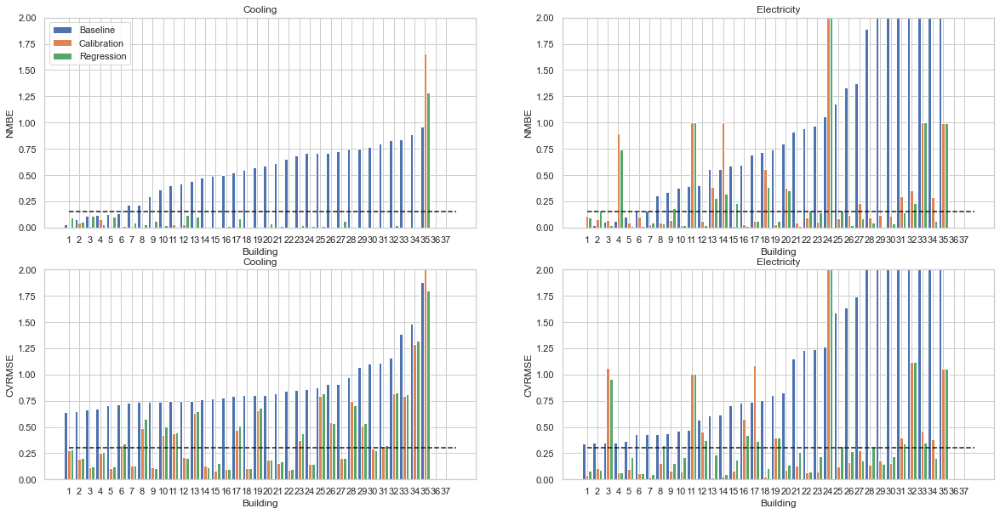

In [748]:
results_metrics = {'CVRMSE': {'Cooling': cvrmse_cooling, 'Electricity': cvrmse_electricity},
                   'NMBE': {'Cooling': nmbe_cooling, 'Electricity': nmbe_electricity}}

fig, ax = plt.subplots(2, 2, figsize=(20, 10))
x_ticks = np.arange(len(cvrmse_cooling.index))
bar_width = 0.3
for j, demand in enumerate(['Cooling', 'Electricity']):
    for i, metric in enumerate(['NMBE', 'CVRMSE']):
        results_metrics[metric][demand].rename(
            columns={'baseline': 'Baseline', 'calibration': 'Calibration', 'regression': 'Regression'},
            inplace=True)
        for k, model in enumerate(['Baseline', 'Calibration', 'Regression']):
            ax[i][j].bar(x_ticks + (k - 1) * bar_width,
                         results_metrics[metric][demand].sort_values('Baseline')[model].fillna(0), 
                         width=bar_width, label=model)
        ax[i][j].set_xticks(x_ticks)
        ax[i][j].set_xticklabels([n + 1 for n in range(len(cvrmse_cooling.index))])
        ax[i][j].set_xlabel('Building')
        ax[i][j].set_ylabel(metric)
        ax[i][j].set_title(demand)
        ax[i][j].set_ylim([0, 2])
    ax[0][j].hlines(0.15, 0, len(cvrmse_cooling.index), linestyle='--', color='k')
    ax[1][j].hlines(0.3, 0, len(cvrmse_cooling.index), linestyle='--', color='k')
ax[0][0].legend()

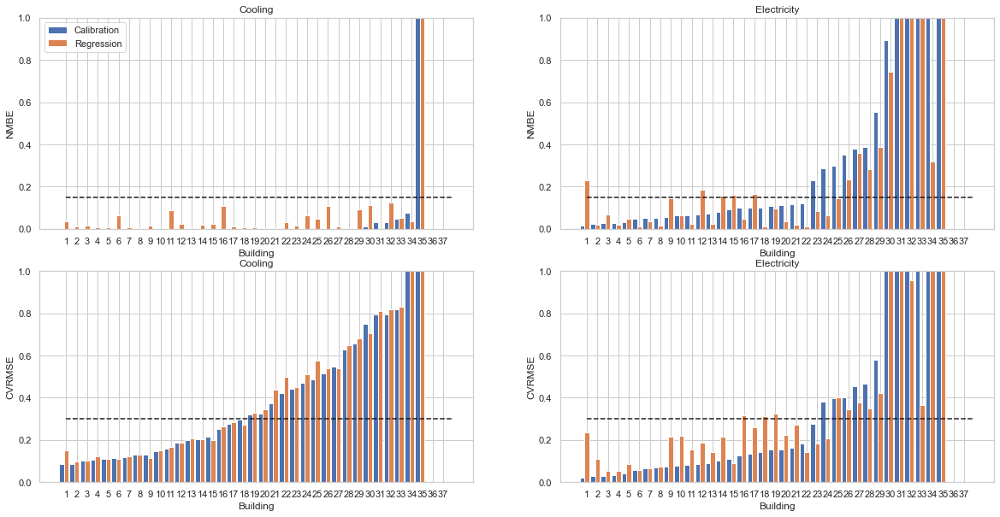

In [749]:
results_metrics = {'CVRMSE': {'Cooling': cvrmse_cooling, 'Electricity': cvrmse_electricity},
                   'NMBE': {'Cooling': nmbe_cooling, 'Electricity': nmbe_electricity}}

fig, ax = plt.subplots(2, 2, figsize=(20, 10))
x_ticks = np.arange(len(cvrmse_cooling.index))
bar_width = 0.45
for j, demand in enumerate(['Cooling', 'Electricity']):
    for i, metric in enumerate(['NMBE', 'CVRMSE']):
        results_metrics[metric][demand].rename(
            columns={'baseline': 'Baseline', 'calibration': 'Calibration', 'regression': 'Regression'},
            inplace=True)
        for k, model in enumerate(['Calibration', 'Regression']):
            ax[i][j].bar(x_ticks + (k - 1) * bar_width,
                         results_metrics[metric][demand].sort_values('Calibration')[model].fillna(0), 
                         width=bar_width, label=model)
        ax[i][j].set_xticks(x_ticks)
        ax[i][j].set_xticklabels([n + 1 for n in range(len(cvrmse_cooling.index))])
        ax[i][j].set_xlabel('Building')
        ax[i][j].set_ylabel(metric)
        ax[i][j].set_title(demand)
        ax[i][j].set_ylim([0, 1])
    ax[0][j].hlines(0.15, 0, len(cvrmse_cooling.index), linestyle='--', color='k')
    ax[1][j].hlines(0.3, 0, len(cvrmse_cooling.index), linestyle='--', color='k')
ax[0][0].legend()

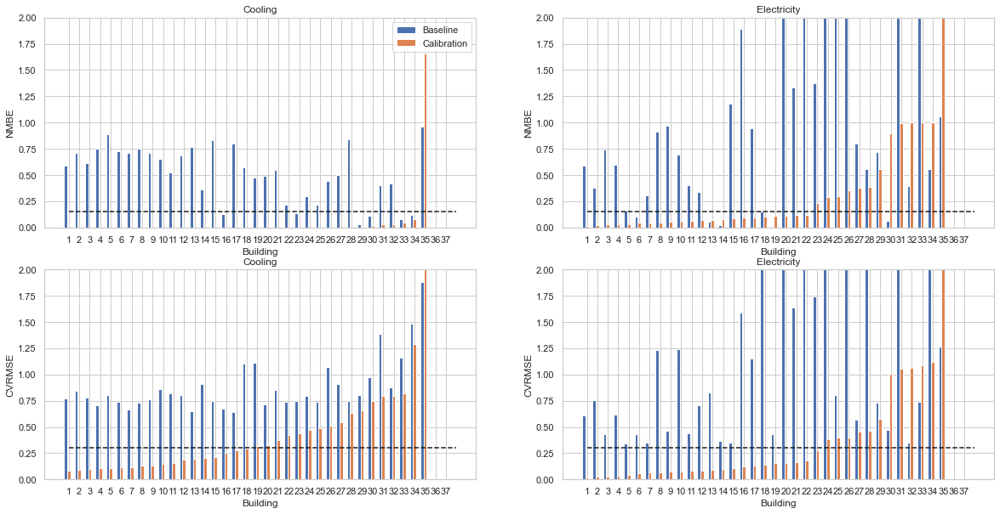

In [750]:
results_metrics = {'CVRMSE': {'Cooling': cvrmse_cooling, 'Electricity': cvrmse_electricity},
                   'NMBE': {'Cooling': nmbe_cooling, 'Electricity': nmbe_electricity}}

fig, ax = plt.subplots(2, 2, figsize=(20, 10))
x_ticks = np.arange(len(cvrmse_cooling.index))
bar_width = 0.3
for j, demand in enumerate(['Cooling', 'Electricity']):
    for i, metric in enumerate(['NMBE', 'CVRMSE']):
#         results_metrics[metric][demand].rename(
#             columns={'baseline': 'Baseline', 'calibration': 'Calibration', 'regression': 'Regression'},
#             inplace=True)
        for k, model in enumerate(['Baseline', 'Calibration'#, 'Regression'
                                  ]):
            ax[i][j].bar(x_ticks + (k - 1) * bar_width,
                         results_metrics[metric][demand].sort_values('Calibration' # 'Baseline'
                                                                    )[model].fillna(0), 
                         width=bar_width, label=model)
        ax[i][j].set_xticks(x_ticks)
        ax[i][j].set_xticklabels([n + 1 for n in range(len(cvrmse_cooling.index))])
        ax[i][j].set_xlabel('Building')
        ax[i][j].set_ylabel(metric)
        ax[i][j].set_title(demand)
        ax[i][j].set_ylim([0, 2])
    ax[0][j].hlines(0.15, 0, len(cvrmse_cooling.index), linestyle='--', color='k')
    ax[1][j].hlines(0.3, 0, len(cvrmse_cooling.index), linestyle='--', color='k')
ax[0][0].legend()

In [208]:
if not os.path.isdir(os.path.join(project_folder, 'baseline_calibration_regression_comparison')):
    os.mkdir(os.path.join(project_folder, 'baseline_calibration_regression_comparison'))
for metric in results_metrics.keys():
    for demand in results_metrics[metric].keys():
        results_metrics[metric][demand][['Baseline', 'Calibration', 'Regression']].to_csv(os.path.join(
            project_folder, 'baseline_calibration_regression_comparison',
            '_'.join(['comparison', metric, demand]) + '.csv'))

# 4. Scenarios

In [161]:
def get_singapore_public_holidays(year):
    import datetime
    from datetime import date
    from dateutil.easter import easter
    from hijri_converter import Hijri, Gregorian
    from lunardate import LunarDate
    from calendar import monthrange

    DEEPAVALI = {2000: date(2000, 10, 26), 2001: date(2001, 11, 14), 2002: date(2002, 11, 3),
                 2003: date(2003, 10, 23), 2004: date(2004, 11, 11), 2005: date(2005, 11, 1),
                 2006: date(2006, 10, 21), 2007: date(2007, 11, 8), 2008: date(2008, 10, 27),
                 2009: date(2009, 10, 17), 2010: date(2010, 11, 5), 2011: date(2011, 10, 26),
                 2012: date(2012, 11, 13), 2013: date(2013, 11, 3), 2014: date(2014, 10, 22),
                 2015: date(2015, 11, 10), 2016: date(2016, 10, 29), 2017: date(2017, 10, 18),
                 2018: date(2018, 11, 6), 2019: date(2019, 10, 27), 2020: date(2020, 11, 14),
                 2021: date(2021, 11, 4), 2022: date(2022, 10, 24), 2023: date(2023, 11, 13),
                 2024: date(2024, 10, 31), 2025: date(2025, 10, 20), 2026: date(2026, 11, 9),
                 2027: date(2027, 10, 28), 2028: date(2028, 11, 15), 2029: date(2029, 11, 5), 
                 2030: date(2030, 10, 25), 2031: date(2031, 11, 14), 2032: date(2032, 11, 3),
                 2033: date(2033, 10, 23), 2034: date(2034, 11, 11), 2035: date(2035, 10, 31),
                 2040: date(2040, 11, 4), 2045: date(2045, 11, 8),
                 2050: date(2050, 11, 15), 2055: date(2055, 10, 20), 2060: date(2060, 10, 24)}
    HARI_RAYA_PUASA = {2000: date(2000, 1, 8), 2001: date(2001, 12, 16), 2002: date(2002, 12, 6),
                       2003: date(2003, 11, 25), 2004: date(2004, 11, 14), 2005: date(2005, 11, 3),
                       2006: date(2006, 10, 24), 2007: date(2007, 10, 13), 2008: date(2008, 10, 1),
                       2009: date(2009, 9, 20), 2010: date(2010, 9, 10), 2011: date(2001, 8, 30),
                       2012: date(2012, 8, 19), 2013: date(2013, 8, 8), 2014: date(2014, 7, 28),
                       2015: date(2015, 7, 17), 2016: date(2016, 7, 6), 2017: date(2017, 6, 25),
                       2018: date(2018, 6, 15), 2019: date(2019, 6, 5), 2020: date(2020, 5, 24),
                       2021: date(2021, 5, 13), 2022: date(2022, 5, 3), 2023: date(2023, 4, 22),
                       2024: date(2024, 4, 10), 2025: date(2025, 3, 31), 2026: date(2026, 3, 20)}
    HARI_RAYA_HAJI = {2000: (2000, 3, 16), 2001: date(2001, 3, 6), 2002: date(2002, 2, 23),
                      2003: date(2003, 2, 12), 2004: date(2004, 2, 1), 2005: date(2005, 1, 21),
                      2006: date(2006, 1, 10), 2007: date(2007, 12, 27), 2008: date(2008, 12, 8),
                      2009: date(2009, 11, 27), 2010: date(2010, 11, 17), 2011: date(2011, 11, 6),
                      2012: date(2012, 10, 26), 2013: date(2013, 10, 15), 2014: date(2014, 10, 5),
                      2015: date(2015, 9, 24), 2016: date(2016, 9, 12), 2017: date(2017, 9, 1),
                      2018: date(2018, 8, 22), 2019: date(2019, 8, 11), 2020: date(2020, 7, 31), 
                      2021: date(2021, 7, 20), 2022: date(2022, 7, 9), 2023: date(2023, 6, 28), 
                      2024: date(2024, 6, 17), 2025: date(2025, 6, 6)}
        
    public_holidays = []
    
    #     New Year's Day
    new_years_day = datetime.date(year, 1, 1)
    #     Labour Day
    labour_day = datetime.date(year, 5, 1)
    #     National Day
    national_day = datetime.date(year, 8, 9)
    #     Christmas Day
    christmas_day = datetime.date(year, 12, 25)
    #     Good Friday
    good_friday = easter(year) - datetime.timedelta(days=2)        
    #     Chinese New Year
    chinese_new_year = LunarDate(year, 1, 1).toSolarDate()
    cny_holiday = chinese_new_year + datetime.timedelta(days=1)
    #     Vesak Day
    vesak_day = LunarDate(year, 4, 15).toSolarDate()
    #     Hari Raya Aidilfitri
    if year in HARI_RAYA_PUASA.keys():
        hari_raya_aidilfitri = HARI_RAYA_PUASA[year]
    else:
        hari_raya_aidilfitri = Hijri(year - 579, 10, 1).to_gregorian()
        hari_raya_aidilfitri = datetime.date(year, hari_raya_aidilfitri.month, hari_raya_aidilfitri.day)
    #     Hari Raya Aidiladha
    if year in HARI_RAYA_HAJI.keys():
        hari_raya_aidiladha = HARI_RAYA_HAJI[year]
    else:
        hari_raya_aidiladha = Hijri(year - 579, 12, 10).to_gregorian()
        hari_raya_aidiladha = datetime.date(year, hari_raya_aidiladha.month, hari_raya_aidiladha.day)
    #     Deepavali
    deepavali = DEEPAVALI[year]
    
    for holiday in [new_years_day, labour_day, national_day, christmas_day, good_friday, chinese_new_year,
                    cny_holiday, vesak_day, hari_raya_aidilfitri, hari_raya_aidiladha, deepavali]:
        if holiday.weekday() != 6:
            current_date = holiday
        else:
            current_date = holiday + datetime.timedelta(days=1)
        if current_date not in public_holidays:
            public_holidays.append(current_date)
        else:
            public_holidays.append(current_date + datetime.timedelta(days=1))
    
    public_holidays.sort()
    
    return public_holidays

## Create scenarios changing weather data

In [162]:
if not os.path.isdir(os.path.join(project_folder, 'scenarios')):
    os.mkdir(os.path.join(project_folder, 'scenarios'))

In [163]:
shutil.copytree(os.path.join(project_folder, 'regression', '2018'),
                os.path.join(project_folder, 'scenarios', 'baseline'))
if os.path.isdir(os.path.join(config.scenario, 'outputs', 'data', 'occupancy')):
    shutil.rmtree(os.path.join(config.scenario, 'outputs', 'data', 'occupancy'))

In [164]:
WEATHER_CASES = ['2020', '2040', '2060']

In [768]:
n_clusters = 4

# define scenario
import cea.config
config = cea.config.Configuration()
config.multiprocessing = True
config.project = os.path.join(project_folder, 'scenarios')
config.scenario_name = 'baseline'
weather_folder = os.path.join(config.scenario, 'inputs', 'weather')
weather_scenarios = os.path.join(weather_folder, 'future_scenarios')
# get input parameters
internal_loads_dbf = dbf_to_dataframe(
    os.path.join(config.scenario, 'inputs', 'building-properties', 'internal_loads.dbf')).set_index('Name')
indoor_comfort_dbf = dbf_to_dataframe(
    os.path.join(config.scenario, 'inputs', 'building-properties', 'indoor_comfort.dbf')).set_index('Name')

base_schedules = {}
for building in years_by_building.keys():
    shutil.copy(os.path.join(project_folder, 'calibration', years_by_building[building], 'outputs', 'data',
                             'occupancy', building + '.csv'),
                os.path.join(project_folder, 'scenarios', 'baseline', 'outputs', 'data',
                             'occupancy', building + '.csv'))
    base_schedules[building] = pd.read_csv(os.path.join(
        project_folder, 'scenarios', 'baseline', 'outputs', 'data', 'occupancy', building + '.csv'),
                                           index_col=0, parse_dates=True)

for weather_case in WEATHER_CASES:
    if not os.path.isdir(os.path.join(config.scenario, 'outputs', 'data', 'demand_' + weather_case)):
        print('Running weather case {}'.format(weather_case))
        shutil.copy(os.path.join(weather_scenarios, 'weather-' + weather_case + '.epw'),
                    os.path.join(weather_folder, 'weather.epw'))
        if not os.path.isdir(os.path.join(config.scenario, 'outputs', 'data', 'occupancy')):
            os.mkdir(os.path.join(config.scenario, 'outputs', 'data', 'occupancy'))
            # get year and holidays
            weather_file = epw_reader(os.path.join(config.scenario, 'inputs', 'weather', 'weather.epw'))
            year = weather_file.year[0]
            holidays = get_singapore_public_holidays(year)
            # get base schedules from previous calibration
            for building in list_buildings:
                b = building
                base_schedule = base_schedules[b]
                T_setpoint = indoor_comfort_dbf.loc[b, 'Tcs_set_C']
                T_setback = indoor_comfort_dbf.loc[b, 'Tcs_setb_C']
                max_occupancy = base_schedule.people_p.max()

                # create new schedule
                new_schedule = pd.DataFrame(data=None, columns=base_schedule.columns, index=pd.date_range(
                    str(year) + '-01-01 00:00', str(year) + '-12-31 23:59', freq='H'))
                new_schedule.index.name = 'DATE'
                if len(set(new_schedule.index.date)) > 365:
                    new_schedule.drop(pd.date_range(str(year) + '-02-29 00:00', str(year) + '-02-29 23:59',
                                                    freq='H'), inplace=True)
                ## define heating schedule
                new_schedule['Ths_set_C'] = 'OFF'
                new_schedule['Qhpro_W'] = 0.0

                ## define cooling schedules
                cooling_schedule = (base_schedule.Tcs_set_C.replace('OFF', T_setback).astype(
                    int) == T_setpoint).to_frame()
                cooling_schedule = pd.pivot_table(cooling_schedule, index=cooling_schedule.index.time,
                                                  columns=cooling_schedule.index.date, values='Tcs_set_C')
                weekday_schedule = (cooling_schedule[
                    [c for c in cooling_schedule.columns if c.weekday() < 5]].mean(axis=1) >= 0.9)
                saturday_schedule = (cooling_schedule[
                    [c for c in cooling_schedule.columns if c.weekday() == 5]].mean(axis=1) >= 0.9)
                sunday_schedule = (cooling_schedule[
                    [c for c in cooling_schedule.columns if c.weekday() == 6]].mean(axis=1) >= 0.9)
                for t in [datetime.time(h, 0) for h in range(24)]:
                    new_schedule.loc[(new_schedule.index.weekday < 5) &
                                     (new_schedule.index.time == t), 'Tcs_set_C'] = weekday_schedule[t]
                    new_schedule.loc[(new_schedule.index.weekday == 5)
                                     & (new_schedule.index.time == t), 'Tcs_set_C'] = saturday_schedule[t]
                    new_schedule.loc[(new_schedule.index.weekday == 6) &
                                     (new_schedule.index.time == t), 'Tcs_set_C'] = sunday_schedule[t]
                if T_setback > 35:
                    new_schedule.loc[new_schedule.Tcs_set_C == False, 'Tcs_set_C'] = 'OFF'
                else:
                    new_schedule.loc[new_schedule.Tcs_set_C == False, 'Tcs_set_C'] = T_setback
                new_schedule.loc[new_schedule.Tcs_set_C == True, 'Tcs_set_C'] = T_setpoint

                ## define occupant schedules from clustering results
                median_cluster = pd.read_csv(os.path.join(
                    os.getcwd(), 'occupant_schedules', 'clusters', 'k_' + str(n_clusters) + '_pre_and_post',
                    'median_clusters', building + '.csv'), index_col=0)
                median_cluster.loc[53] = median_cluster.loc[1]
                schedule_assignment = pd.read_csv(os.path.join(
                    os.getcwd(), 'occupant_schedules', 'clusters', 'k_' + str(n_clusters) + '_pre_and_post',
                    'schedules', building + '.csv'), index_col=0)
                if len(schedule_assignment[schedule_assignment['0_avg_2018'].isna()]) == 0:
                    avg_year = '_avg_2018'
                else:
                    avg_year = '_avg_2020'
                for week in median_cluster.index:
                    for date in set(new_schedule.loc[(new_schedule.index.week == week) & 
                                                     (new_schedule.index.weekday < 5)].index.date):
                        new_schedule.loc[new_schedule.index.date == date, 'people_p'] = np.ceil(
                            schedule_assignment[str(median_cluster.loc[week, 'weekday']) + avg_year].values * 
                            max_occupancy)
                    if len(new_schedule.loc[(new_schedule.index.week == week)
                                            & (new_schedule.index.weekday == 5)]) > 0:
                        new_schedule.loc[(new_schedule.index.week == week) & (new_schedule.index.weekday == 5),
                                         'people_p'] = np.array(list(np.ceil(
                            schedule_assignment[str(median_cluster.loc[week, 'saturday']) + avg_year].values *
                            max_occupancy)) * len(np.unique(new_schedule.loc[
                            (new_schedule.index.week == week) &
                            (new_schedule.index.weekday == 5)].index.date)))
                    if len(new_schedule.loc[(new_schedule.index.week == week)
                                            & (new_schedule.index.weekday == 6)]) > 0:
                        new_schedule.loc[(new_schedule.index.week == week) & (new_schedule.index.weekday == 6),
                                         'people_p'] = np.array(list(np.ceil(
                            schedule_assignment[str(median_cluster.loc[week, 'sunday']) + avg_year].values * 
                            max_occupancy)) * len(np.unique(
                            new_schedule.loc[(new_schedule.index.week == week) & 
                                             (new_schedule.index.weekday == 6)].index.date)))

                for holiday in holidays:
                    new_schedule.loc[new_schedule.index.date == holiday, 'people_p'] =  np.ceil(
                        schedule_assignment[str(median_cluster.loc[1, 'holiday']) + avg_year].values * 
                        max_occupancy)
                new_schedule.people_p = new_schedule.people_p.astype(int)
                # the buildings are showing some unrealistic nighttime occupancy, so I'm making that 0
                new_schedule.people_p -= new_schedule.people_p.min()

                ## define domestic hot water schedule from occupancy schedule
                for date in set(new_schedule.index.date):
                    if new_schedule.loc[new_schedule.index.date == date, 'people_p'].sum() > 0:
                        new_schedule.loc[new_schedule.index.date == date, 'Vw_lph'] = (
                            new_schedule.loc[new_schedule.index.date == date, 'people_p'] / 
                            new_schedule.loc[new_schedule.index.date == date, 'people_p'].sum()
                        ) * internal_loads_dbf.loc[b, 'Vw_ldp'] * new_schedule.loc[new_schedule.index.date == date,
                                                                                   'people_p'].max()
                    else:
                        new_schedule.loc[new_schedule.index.date == date, 'Vw_lph'] = 0
                new_schedule['Vww_lph'] = new_schedule['Vw_lph'] * internal_loads_dbf.loc[
                    b, 'Vww_ldp'] / internal_loads_dbf.loc[b, 'Vw_ldp']

                ## define building operation schedules from occupancy schedule
                new_schedule.Ve_lps = (new_schedule.people_p * indoor_comfort_dbf.loc[b, 'Ve_lsp']).values
                new_schedule.Qs_W = (new_schedule.people_p * internal_loads_dbf.loc[b, 'Qs_Wp']).values
                new_schedule.X_gh = (new_schedule.people_p * internal_loads_dbf.loc[b, 'X_ghp']).values
                ## define electricity schedules using regression model and occupancy schedule
                new_schedule['Ea_W'] = new_schedule['people_p'] * regression_results.loc[
                    building, 'appliances_kWh_per_person'] * 1000
                new_schedule['El_W'] = regression_results.loc[building, 'lighting_logistic_peak_kWh'] * (
                    1 - regression_results.loc[building, 'weekend_multiplier'] * 
                    ((new_schedule.index.weekday > 4) * 1.0)) * ((1 + np.exp(-regression_results.loc[
                    building, 'lighting_logistic_k'] * (new_schedule.index.hour.values - regression_results.loc[
                    building, 'lighting_logistic_start_time_h']))) ** -1 - (
                    1 + np.exp(-regression_results.loc[building, 'lighting_logistic_k'] * 
                               (new_schedule.index.hour.values - regression_results.loc[
                                   building, 'lighting_logistic_end_time_h']))) ** -1) * 1000
                new_schedule.loc[new_schedule.El_W < 0, 'El_W'] = 0
                new_schedule['Ev_W'] = regression_results.loc[building, 'base_load_kWh'] * 1000

                # define process cooling and all other schedules
                new_schedule[['Qcpro_W', 'Ed_W', 'Epro_W', 'Qcre_W']] = base_schedule[
                    ['Qcpro_W', 'Ed_W', 'Epro_W', 'Qcre_W']].values
                # export schedule
                print('{}: {} nan values found'.format(b, new_schedule.isna().sum().sum()))
                new_schedule.to_csv(os.path.join(config.scenario, 'outputs', 'data', 'occupancy', b + '.csv'))
        if not os.path.isdir(os.path.join(
            config.scenario, 'outputs', 'data', 'solar-radiation_' + weather_case)):
            # run radiation script
            config.radiation.buildings = years_by_building.keys()
            config.radiation.daysim_bin_directory = DAYSIM_BIN_DIRECTORY
            radiation_main(config)
        else:
            os.rename(os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation_' + weather_case),
                      os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation'))
        # run demand script
        config.demand.buildings = years_by_building.keys()
        demand_main(config)
        # remove weather file
        os.remove(os.path.join(weather_folder, 'weather.epw'))
        # backup results
        os.rename(os.path.join(config.scenario, 'outputs', 'data', 'occupancy'),
                  os.path.join(config.scenario, 'outputs', 'data', 'occupancy_' + weather_case))
        os.rename(os.path.join(config.scenario, 'outputs', 'data', 'demand'),
                  os.path.join(config.scenario, 'outputs', 'data', 'demand_' + weather_case))
        os.rename(os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation'),
                  os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation_' + weather_case))

Running weather case 2020
B1146: 0 nan values found
B1150: 0 nan values found
B1153: 0 nan values found
B1168: 0 nan values found
B1016: 0 nan values found
B1087: 0 nan values found
B1139: 0 nan values found
B1003: 0 nan values found
B1063: 0 nan values found
B1064: 0 nan values found
B1296: 0 nan values found
B1053: 0 nan values found
B1055: 0 nan values found
B1052: 0 nan values found
B1050: 0 nan values found
B1005: 0 nan values found
B1008: 0 nan values found
B1126: 0 nan values found
B1135: 0 nan values found
B1103: 0 nan values found
B1099: 0 nan values found
B1115: 0 nan values found
B1114: 0 nan values found
B1142: 0 nan values found
B1102: 0 nan values found
B1104: 0 nan values found
B1105: 0 nan values found
B1107: 0 nan values found
B1108: 0 nan values found
B1109: 0 nan values found
B1138: 0 nan values found
B1081: 0 nan values found
B1047: 0 nan values found
B1286: 0 nan values found
B1026: 0 nan values found
Running demand calculation for scenario /Users/martin/Documents/

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 35: B1063
Building No. 2 completed out of 35: B1008
Building No. 3 completed out of 35: B1026
Building No. 4 completed out of 35: B1003
Building No. 5 completed out of 35: B1050
Building No. 6 completed out of 35: B1087
Building No. 7 completed out of 35: B1053
Building No. 8 completed out of 35: B1081
Building No. 9 completed out of 35: B1047
Building No. 10 completed out of 35: B1016
Building No. 11 completed out of 35: B1052
Building No. 12 completed out of 35: B1005
Building No. 13 completed out of 35: B1099
Building No. 14 completed out of 35: B1055
Building No. 15 completed out of 35: B1102
Building No. 16 com

## 4.i. Create centralized scenarios

In [170]:
WFH_RANGE = np.arange(0.25, 1, 0.25)
n_clusters = 4

In [770]:
# get input parameters
internal_loads_dbf = dbf_to_dataframe(
    os.path.join(config.scenario, 'inputs', 'building-properties', 'internal_loads.dbf')).set_index('Name')
indoor_comfort_dbf = dbf_to_dataframe(
    os.path.join(config.scenario, 'inputs', 'building-properties', 'indoor_comfort.dbf')).set_index('Name')

for wfh in WFH_RANGE:
    # import config file
    import cea.config
    config = cea.config.Configuration()
    config.multiprocessing = True
    config.project = os.path.join(project_folder, 'scenarios')
    # define scenario
    scenario = 'WFH-' + str(np.round(wfh, 2))
    if not os.path.isdir(os.path.join(project_folder, 'scenarios', scenario)):
        os.mkdir(os.path.join(project_folder, 'scenarios', scenario))
        shutil.copytree(os.path.join(config.project, 'baseline', 'inputs'),
                        os.path.join(config.project, scenario, 'inputs'))
        os.mkdir(os.path.join(config.project, scenario, 'outputs'))
        os.mkdir(os.path.join(config.project, scenario, 'outputs', 'data'))
    config.scenario_name = scenario
    # run for each weather case
    for weather_case in WEATHER_CASES:
        print('Running WFH ratio {} and weather case {}'.format(np.round(wfh, 2), weather_case))
        if not os.path.isdir(os.path.join(config.scenario, 'outputs', 'data', 'demand_' + weather_case)):
            # get solar radiation
            if os.path.isdir(os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation')):
                shutil.rmtree(os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation'))
            shutil.copytree(
                os.path.join(config.project, 'baseline', 'outputs', 'data', 'solar-radiation_' + weather_case),
                os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation'))
            # get weather data
            shutil.copy(os.path.join(weather_scenarios, 'weather-' + weather_case + '.epw'),
                        os.path.join(config.scenario, 'inputs', 'weather', 'weather.epw'))
            # get occupancy schedules
            if os.path.isdir(os.path.join(config.scenario, 'outputs', 'data', 'occupancy')):
                shutil.rmtree(os.path.join(config.scenario, 'outputs', 'data', 'occupancy'))
            if not os.path.isdir(os.path.join(
                config.scenario, 'outputs', 'data', 'occupancy_' + weather_case)):
                shutil.copytree(os.path.join(
                    project_folder, 'scenarios', 'baseline', 'outputs', 'data', 'occupancy_' + weather_case),
                    os.path.join(config.scenario, 'outputs', 'data', 'occupancy'))
                # get year and holidays
                weather_file = epw_reader(os.path.join(config.scenario, 'inputs', 'weather', 'weather.epw'))
                year = weather_file.year[0]
                holidays = get_singapore_public_holidays(year)
                # get base schedules from baseline simulation
                for building in list_buildings:
                    b = building
                    base_schedule = pd.read_csv(os.path.join(config.scenario, 'outputs', 'data', 'occupancy',
                                                             b + '.csv'), index_col=0, parse_dates=True)
                    ## Assume if X% are working from home, (1 - X%) are working in the office/going to
                    ## school/etc.
                    base_schedule.people_p *= (1 - wfh)
                    base_schedule.people_p = base_schedule.people_p.astype(int)
                    ## define domestic hot water schedule from occupancy schedule
                    for date in set(base_schedule.index.date):
                        if base_schedule.loc[base_schedule.index.date == date, 'people_p'].sum() > 0:
                            base_schedule.loc[base_schedule.index.date == date, 'Vw_lph'] = (
                                base_schedule.loc[base_schedule.index.date == date, 'people_p'] / 
                                base_schedule.loc[base_schedule.index.date == date, 'people_p'].sum()
                            ) * internal_loads_dbf.loc[b, 'Vw_ldp'] * base_schedule.loc[
                                base_schedule.index.date == date, 'people_p'].max()
                        else:
                            base_schedule.loc[base_schedule.index.date == date, 'Vw_lph'] = 0
                    base_schedule['Vww_lph'] = base_schedule['Vw_lph'] * internal_loads_dbf.loc[
                        b, 'Vww_ldp'] / internal_loads_dbf.loc[b, 'Vw_ldp']
                    ## define building operation schedules from occupancy schedule
                    base_schedule.Ve_lps = (base_schedule.people_p * indoor_comfort_dbf.loc[
                        b, 'Ve_lsp']).values
                    base_schedule.Qs_W = (base_schedule.people_p * internal_loads_dbf.loc[b, 'Qs_Wp']).values
                    base_schedule.X_gh = (base_schedule.people_p * internal_loads_dbf.loc[b, 'X_ghp']).values
                    ## define electricity schedules using regression model and occupancy schedule
                    base_schedule['Ea_W'] = base_schedule['people_p'] * regression_results.loc[
                        building, 'appliances_kWh_per_person'] * 1000

                    # export schedule
                    print('{}: {} nan values found'.format(b, base_schedule.isna().sum().sum()))
                    base_schedule.to_csv(os.path.join(
                        config.scenario, 'outputs', 'data', 'occupancy', b + '.csv'))
            else:
                shutil.copytree(os.path.join(config.scenario, 'outputs', 'data', 'occupancy_' + weather_case),
                                os.path.join(config.scenario, 'outputs', 'data', 'occupancy'))
                
            # run demand script
            config.demand.buildings = years_by_building.keys()
            demand_main(config)
            # remove weather file and radiation folder
            os.remove(os.path.join(config.scenario, 'inputs', 'weather', 'weather.epw'))
            shutil.rmtree(os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation'))
            # backup results
            os.rename(os.path.join(config.scenario, 'outputs', 'data', 'occupancy'),
                      os.path.join(config.scenario, 'outputs', 'data', 'occupancy_' + weather_case))
            os.rename(os.path.join(config.scenario, 'outputs', 'data', 'demand'),
                      os.path.join(config.scenario, 'outputs', 'data', 'demand_' + weather_case))

Running WFH ratio 0.25 and weather case 2020
B1146: 0 nan values found
B1150: 0 nan values found
B1153: 0 nan values found
B1168: 0 nan values found
B1016: 0 nan values found
B1087: 0 nan values found
B1139: 0 nan values found
B1003: 0 nan values found
B1063: 0 nan values found
B1064: 0 nan values found
B1296: 0 nan values found
B1053: 0 nan values found
B1055: 0 nan values found
B1052: 0 nan values found
B1050: 0 nan values found
B1005: 0 nan values found
B1008: 0 nan values found
B1126: 0 nan values found
B1135: 0 nan values found
B1103: 0 nan values found
B1099: 0 nan values found
B1115: 0 nan values found
B1114: 0 nan values found
B1142: 0 nan values found
B1102: 0 nan values found
B1104: 0 nan values found
B1105: 0 nan values found
B1107: 0 nan values found
B1108: 0 nan values found
B1109: 0 nan values found
B1138: 0 nan values found
B1081: 0 nan values found
B1047: 0 nan values found
B1286: 0 nan values found
B1026: 0 nan values found
Running demand calculation for scenario /User

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 35: B1026
Building No. 2 completed out of 35: B1063
Building No. 3 completed out of 35: B1003
Building No. 4 completed out of 35: B1008
Building No. 5 completed out of 35: B1050
Building No. 6 completed out of 35: B1087
Building No. 7 completed out of 35: B1053
Building No. 8 completed out of 35: B1047
Building No. 9 completed out of 35: B1081
Building No. 10 completed out of 35: B1052
Building No. 11 completed out of 35: B1016
Building No. 12 completed out of 35: B1005
Building No. 13 completed out of 35: B1055
Building No. 14 completed out of 35: B1099
Building No. 15 completed out of 35: B1102
Building No. 16 com

Building No. 24 completed out of 35: B1126
Building No. 25 completed out of 35: B1108
Building No. 26 completed out of 35: B1142
Building No. 27 completed out of 35: B1138
Building No. 28 completed out of 35: B1114
Building No. 29 completed out of 35: B1146
Building No. 30 completed out of 35: B1153
Building No. 31 completed out of 35: B1286
Building No. 32 completed out of 35: B1064
Building No. 33 completed out of 35: B1150
Building No. 34 completed out of 35: B1296
Building No. 35 completed out of 35: B1168
done - time elapsed: 50.2 seconds
Running WFH ratio 0.5 and weather case 2060
B1146: 0 nan values found
B1150: 0 nan values found
B1153: 0 nan values found
B1168: 0 nan values found
B1016: 0 nan values found
B1087: 0 nan values found
B1139: 0 nan values found
B1003: 0 nan values found
B1063: 0 nan values found
B1064: 0 nan values found
B1296: 0 nan values found
B1053: 0 nan values found
B1055: 0 nan values found
B1052: 0 nan values found
B1050: 0 nan values found
B1005: 0 nan val

B1108: 0 nan values found
B1109: 0 nan values found
B1138: 0 nan values found
B1081: 0 nan values found
B1047: 0 nan values found
B1286: 0 nan values found
B1026: 0 nan values found
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/scenarios/WFH-0.75
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296', 'B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B128

## 4.ii. Create occupant-driven scenarios

In [172]:
minimum_hs = 0.05

In [774]:
for wfh in WFH_RANGE:
    # import config file
    import cea.config
    config = cea.config.Configuration()
    config.multiprocessing = True
    config.project = os.path.join(project_folder, 'scenarios')
    # define scenario
    scenario = 'WFH-' + str(np.round(wfh, 2)) + '-Ns'
    if not os.path.isdir(os.path.join(project_folder, 'scenarios', scenario)):
        os.mkdir(os.path.join(project_folder, 'scenarios', scenario))
        shutil.copytree(os.path.join(config.project, 'WFH-' + str(np.round(wfh, 2)), 'inputs'),
                        os.path.join(config.project, scenario, 'inputs'))
        os.mkdir(os.path.join(config.project, scenario, 'outputs'))
        os.mkdir(os.path.join(config.project, scenario, 'outputs', 'data'))
    config.scenario_name = scenario
    # adjust architecture file
    architecture_df = dbf_to_dataframe(os.path.join(
        config.scenario, 'inputs', 'building-properties', 'architecture.dbf')).set_index('Name')
    architecture_df.loc[[building for building in list_buildings],
                        [# 'Ns', 
                            'Hs_ag', 'Hs_bg', 'Es']] *= (1 - wfh)
    if len(architecture_df.loc[(0.0 < architecture_df.Hs_ag) & (architecture_df.Hs_ag < minimum_hs)]) > 0:
        architecture_df.loc[(0.0 < architecture_df.Hs_ag) & (architecture_df.Hs_ag < minimum_hs),
                            [# 'Ns',
                                'Hs_ag', 'Es']] = (architecture_df.loc[
            (0.0 < architecture_df.Hs_ag) & (architecture_df.Hs_ag < minimum_hs),
            [# 'Ns',
                'Hs_ag', 'Es']].transpose() + (minimum_hs - architecture_df.loc[
            (0.0 < architecture_df.Hs_ag) & (architecture_df.Hs_ag < minimum_hs), 'Hs_ag']).values).transpose()
    dataframe_to_dbf(architecture_df.reset_index(),
                     os.path.join(config.scenario, 'inputs', 'building-properties', 'architecture.dbf'))
    # run for each weather case
    for weather_case in WEATHER_CASES:
        print('Running WFH ratio {} with adjusted Ns and weather {}'.format(np.round(wfh, 2), weather_case))
        if not os.path.isdir(os.path.join(config.scenario, 'outputs', 'data', 'demand_' + weather_case)):
            # get solar radiation
            if os.path.isdir(os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation')):
                shutil.rmtree(os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation'))
            shutil.copytree(
                os.path.join(config.project, 'baseline', 'outputs', 'data', 'solar-radiation_' + weather_case),
                os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation'))
            # get occupancy schedules
            shutil.copytree(os.path.join(config.project, 'WFH-' + str(np.round(wfh, 2)), 'outputs', 'data',
                                         'occupancy_' + weather_case),
                            os.path.join(config.scenario, 'outputs', 'data', 'occupancy'))
            # get weather data
            shutil.copy(os.path.join(weather_scenarios, 'weather-' + weather_case + '.epw'),
                        os.path.join(config.scenario, 'inputs', 'weather', 'weather.epw'))
            # adjust architecture file
            for building in list_buildings:
                b = building
                base_schedule = pd.read_csv(os.path.join(config.scenario, 'outputs', 'data', 'occupancy',
                                                         b + '.csv'), index_col=0, parse_dates=True)
                ## adjust lighting schedule to account for WFH% smaller floor area
                base_schedule['El_W'] *= (1 - wfh)

                # export schedule
                print('{}: {} nan values found'.format(b, base_schedule.isna().sum().sum()))
                base_schedule.to_csv(os.path.join(config.scenario, 'outputs', 'data', 'occupancy', b + '.csv'))
                
            # run demand script
            config.demand.buildings = years_by_building.keys()
            demand_main(config)
            # remove weather file and radiation folder
            os.remove(os.path.join(config.scenario, 'inputs', 'weather', 'weather.epw'))
            shutil.rmtree(os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation'))
            # backup results
            os.rename(os.path.join(config.scenario, 'outputs', 'data', 'occupancy'),
                      os.path.join(config.scenario, 'outputs', 'data', 'occupancy_' + weather_case))
            os.rename(os.path.join(config.scenario, 'outputs', 'data', 'demand'),
                      os.path.join(config.scenario, 'outputs', 'data', 'demand_' + weather_case))

Running WFH ratio 0.25 with adjusted Ns and weather 2020
B1146: 0 nan values found
B1150: 0 nan values found
B1153: 0 nan values found
B1168: 0 nan values found
B1016: 0 nan values found
B1087: 0 nan values found
B1139: 0 nan values found
B1003: 0 nan values found
B1063: 0 nan values found
B1064: 0 nan values found
B1296: 0 nan values found
B1053: 0 nan values found
B1055: 0 nan values found
B1052: 0 nan values found
B1050: 0 nan values found
B1005: 0 nan values found
B1008: 0 nan values found
B1126: 0 nan values found
B1135: 0 nan values found
B1103: 0 nan values found
B1099: 0 nan values found
B1115: 0 nan values found
B1114: 0 nan values found
B1142: 0 nan values found
B1102: 0 nan values found
B1104: 0 nan values found
B1105: 0 nan values found
B1107: 0 nan values found
B1108: 0 nan values found
B1109: 0 nan values found
B1138: 0 nan values found
B1081: 0 nan values found
B1047: 0 nan values found
B1286: 0 nan values found
B1026: 0 nan values found
Running demand calculation for sc

done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B1283', 'B1284', 'B1285', 'B1288', 'B1298', 'B1299', 'B1326', 'B1327', 'B1328', 'B1329', 'B1330', 'B1331', 'B1340', 'B1351']
Using 7 CPU's
Building No. 1 completed out of 35: B1063
Building No. 2 completed out of 35: B1026
Building No. 3 completed out of 35: B1003
Building No. 4 completed out of 35: B1008
Building No. 5 completed out of 35: B1050
Building No. 6 completed out of 35: B1053
Building No. 7 completed out of 35: B1087
Building No. 8 completed out of 35: B1081
Building No. 9 completed out of 35: B1047
Building No. 10 completed out of 35: B1052
Building No. 11 completed out of 35: B1016
Building No. 12 completed out of 35: B1005
Building No. 13 completed out of 35: B1055
Building No. 14 completed out of 35: B1099
Building No. 15 completed out of 35: B1102
Building No. 16 com

Building No. 24 completed out of 35: B1108
Building No. 25 completed out of 35: B1126
Building No. 26 completed out of 35: B1114
Building No. 27 completed out of 35: B1138
Building No. 28 completed out of 35: B1142
Building No. 29 completed out of 35: B1153
Building No. 30 completed out of 35: B1146
Building No. 31 completed out of 35: B1286
Building No. 32 completed out of 35: B1064
Building No. 33 completed out of 35: B1168
Building No. 34 completed out of 35: B1150
Building No. 35 completed out of 35: B1296
done - time elapsed: 66.2 seconds
Running WFH ratio 0.5 with adjusted Ns and weather 2060
B1146: 0 nan values found
B1150: 0 nan values found
B1153: 0 nan values found
B1168: 0 nan values found
B1016: 0 nan values found
B1087: 0 nan values found
B1139: 0 nan values found
B1003: 0 nan values found
B1063: 0 nan values found
B1064: 0 nan values found
B1296: 0 nan values found
B1053: 0 nan values found
B1055: 0 nan values found
B1052: 0 nan values found
B1050: 0 nan values found
B100

B1108: 0 nan values found
B1109: 0 nan values found
B1138: 0 nan values found
B1081: 0 nan values found
B1047: 0 nan values found
B1286: 0 nan values found
B1026: 0 nan values found
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/scenarios/WFH-0.75-Ns
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296', 'B1064']
read input files
done
Warning! The following list of buildings have less than 100 m2 of gross floor area, CEA might fail: ['B1023', 'B1065', 'B1067', 'B1069', 'B1073', 'B1078', 'B1079', 'B1080', 'B1266', 'B1273', 'B1282', 'B

## 4.iii. Create elastic scenarios

In [775]:
# get input parameters
internal_loads_dbf = dbf_to_dataframe(os.path.join(
    config.project, 'baseline', 'inputs', 'building-properties', 'internal_loads.dbf')).set_index('Name')
indoor_comfort_dbf = dbf_to_dataframe(os.path.join(
    config.project, 'baseline', 'inputs', 'building-properties', 'indoor_comfort.dbf')).set_index('Name')
typology_dbf = dbf_to_dataframe(os.path.join(
    config.project, 'baseline', 'inputs', 'building-properties', 'typology.dbf')).set_index('Name')

for wfh in WFH_RANGE:
    # import config file
    import cea.config
    config = cea.config.Configuration()
    config.multiprocessing = True
    config.project = os.path.join(project_folder, 'scenarios')
    # define scenario
    scenario = 'WFH-' + str(np.round(wfh, 2)) + '-closed_buildings'
    if not os.path.isdir(os.path.join(project_folder, 'scenarios', scenario)):
        os.mkdir(os.path.join(project_folder, 'scenarios', scenario))
        shutil.copytree(os.path.join(config.project, 'baseline', 'inputs'),
                        os.path.join(config.project, scenario, 'inputs'))
        os.mkdir(os.path.join(config.project, scenario, 'outputs'))
        os.mkdir(os.path.join(config.project, scenario, 'outputs', 'data'))
    config.scenario_name = scenario
    
    ## decide which buildings to keep open or closed based on 2020 demand results
    architecture_df = dbf_to_dataframe(os.path.join(
        config.project, 'baseline', 'inputs', 'building-properties', 'architecture.dbf')).set_index('Name')
    # rank buildings by cooling EUI
    total_demand_df = pd.read_csv(os.path.join(
        config.project, 'baseline', 'outputs', 'data', 'demand_2020', 'Total_demand.csv'), index_col=0)
    total_demand_df = total_demand_df[total_demand_df.Qcs_sys_MWhyr > 0]
    typology_demand = typology_dbf.merge(total_demand_df,
                                         left_index=True, right_index=True).sort_values('1ST_USE')
    typology_demand['Qcs_sys_kWhm2'] = typology_demand['Qcs_sys_MWhyr'] / typology_demand['Af_m2'] * 1000
    # get the share of each building that is left empty (0-100%)
    empty_shares = pd.Series(index=[b for b in list_buildings], data=0.0)
    for use_type in typology_demand['1ST_USE'].unique():
        if len(typology_demand.loc[typology_demand['1ST_USE'] == use_type]) != 1:
            # if there is more than one building of that typology, close the highest cooling EUI first
            area_to_clear = typology_demand.loc[typology_demand['1ST_USE'] == use_type, 'Af_m2'].sum() * wfh
            for building in typology_demand.loc[typology_demand['1ST_USE'] == use_type].sort_values(
                'Qcs_sys_kWhm2', ascending=False).index:
                if typology_demand.loc[building, 'Af_m2'] < area_to_clear:
                    empty_shares[building] = 1.0
                    area_to_clear -= typology_demand.loc[building, 'Af_m2']
                elif area_to_clear > 0:
                    empty_shares[building] = area_to_clear / typology_demand.loc[building, 'Af_m2']
                    area_to_clear = 0
                else:
                    empty_shares[building] = 0.0
        else:
            empty_shares[typology_demand.loc[typology_demand['1ST_USE'] == use_type].index[0]] = wfh
    # Adjust conditioned floor area according to empty GFA share
    architecture_df.loc[empty_shares.index, ['Hs_ag', 'Hs_bg', 'Es']] = (
        architecture_df.loc[empty_shares.index, ['Hs_ag', 'Hs_bg', 'Es']].transpose() * 
        (1 - empty_shares).transpose()).transpose()
    if len(architecture_df.loc[(0.0 < architecture_df.Hs_ag) & (architecture_df.Hs_ag < minimum_hs)]) > 0:
        architecture_df.loc[(0.0 < architecture_df.Hs_ag) & (architecture_df.Hs_ag < minimum_hs),
                            ['Hs_ag', 'Es']] = (architecture_df.loc[
            (0.0 < architecture_df.Hs_ag) & (architecture_df.Hs_ag < minimum_hs),
            ['Hs_ag', 'Es']].transpose() + (minimum_hs - architecture_df.loc[
            (0.0 < architecture_df.Hs_ag) & (architecture_df.Hs_ag < minimum_hs), 'Hs_ag']).values).transpose()
    # Export updated architectural properties
    dataframe_to_dbf(architecture_df.reset_index(),
                     os.path.join(config.scenario, 'inputs', 'building-properties', 'architecture.dbf'))

    # run demand simulation for each weather case
    for weather_case in WEATHER_CASES:
        print('Running WFH ratio {} and weather case {}'.format(np.round(wfh, 2), weather_case))
        if not os.path.isdir(os.path.join(config.scenario, 'outputs', 'data', 'demand_' + weather_case)):
            # get solar radiation
            if os.path.isdir(os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation')):
                shutil.rmtree(os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation'))
            shutil.copytree(
                os.path.join(config.project, 'baseline', 'outputs', 'data', 'solar-radiation_' + weather_case),
                os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation'))
            # get weather data
            shutil.copy(os.path.join(
                config.scenario, 'inputs', 'weather', 'future_scenarios', 'weather-' + weather_case + '.epw'),
                        os.path.join(config.scenario, 'inputs', 'weather', 'weather.epw'))
            # get occupancy schedules
            if os.path.isdir(os.path.join(config.scenario, 'outputs', 'data', 'occupancy')):
                shutil.rmtree(os.path.join(config.scenario, 'outputs', 'data', 'occupancy'))
            if os.path.isdir(os.path.join(config.scenario, 'outputs', 'data', 'occupancy_' + weather_case)):
                shutil.copytree(os.path.join(config.scenario, 'outputs', 'data', 'occupancy_' + weather_case),
                                os.path.join(config.scenario, 'outputs', 'data', 'occupancy'))
            else:
                os.mkdir(os.path.join(config.project, scenario, 'outputs', 'data', 'occupancy'))
                # get base schedules from previous simulation
                for building in list_buildings:
                    b = building
                    # get baseline schedule
                    base_schedule = pd.read_csv(os.path.join(config.project, 'baseline', 'outputs', 'data',
                                                             'occupancy_' + weather_case, b + '.csv'),
                                                index_col=0, parse_dates=True)
                    # adjust the number of occupants based on empty_shares
                    base_schedule.people_p *= (1 - empty_shares[b])
                    base_schedule.people_p = base_schedule.people_p.astype(int)
                    ## define domestic hot water schedule from occupancy schedule
                    for date in set(base_schedule.index.date):
                        if base_schedule.loc[base_schedule.index.date == date, 'people_p'].sum() > 0:
                            base_schedule.loc[base_schedule.index.date == date, 'Vw_lph'] = (
                                base_schedule.loc[base_schedule.index.date == date, 'people_p'] / 
                                base_schedule.loc[base_schedule.index.date == date, 'people_p'].sum()
                            ) * internal_loads_dbf.loc[b, 'Vw_ldp'] * base_schedule.loc[
                                base_schedule.index.date == date, 'people_p'].max()
                        else:
                            base_schedule.loc[base_schedule.index.date == date, 'Vw_lph'] = 0
                    base_schedule['Vww_lph'] = base_schedule['Vw_lph'] * internal_loads_dbf.loc[
                        b, 'Vww_ldp'] / internal_loads_dbf.loc[b, 'Vw_ldp']
                    ## define building operation schedules from occupancy schedule
                    base_schedule.Ve_lps = (base_schedule.people_p * indoor_comfort_dbf.loc[
                        b, 'Ve_lsp']).values
                    base_schedule.Qs_W = (base_schedule.people_p * internal_loads_dbf.loc[b, 'Qs_Wp']).values
                    base_schedule.X_gh = (base_schedule.people_p * internal_loads_dbf.loc[b, 'X_ghp']).values
                    ## define electricity schedules using regression model and occupancy schedule
                    base_schedule['Ea_W'] = base_schedule['people_p'] * regression_results.loc[
                        building, 'appliances_kWh_per_person'] * 1000
                    ## adjust lighting schedule to account for smaller floor area
                    base_schedule['El_W'] *= (1 - empty_shares[b])
                    # export schedule
                    print('{}: {} nan values found'.format(b, base_schedule.isna().sum().sum()))
                    base_schedule.to_csv(os.path.join(
                        config.scenario, 'outputs', 'data', 'occupancy', b + '.csv'))
            # run demand script
            config.demand.buildings = years_by_building.keys()
            demand_main(config)
            # remove weather file and radiation folder
            os.remove(os.path.join(config.scenario, 'inputs', 'weather', 'weather.epw'))
            shutil.rmtree(os.path.join(config.scenario, 'outputs', 'data', 'solar-radiation'))
            # backup results
            os.rename(os.path.join(config.scenario, 'outputs', 'data', 'occupancy'),
                      os.path.join(config.scenario, 'outputs', 'data', 'occupancy_' + weather_case))
            os.rename(os.path.join(config.scenario, 'outputs', 'data', 'demand'),
                      os.path.join(config.scenario, 'outputs', 'data', 'demand_' + weather_case))

Running WFH ratio 0.25 and weather case 2020
B1146: 0 nan values found
B1150: 0 nan values found
B1153: 0 nan values found
B1168: 0 nan values found
B1016: 0 nan values found
B1087: 0 nan values found
B1139: 0 nan values found
B1003: 0 nan values found
B1063: 0 nan values found
B1064: 0 nan values found
B1296: 0 nan values found
B1053: 0 nan values found
B1055: 0 nan values found
B1052: 0 nan values found
B1050: 0 nan values found
B1005: 0 nan values found
B1008: 0 nan values found
B1126: 0 nan values found
B1135: 0 nan values found
B1103: 0 nan values found
B1099: 0 nan values found
B1115: 0 nan values found
B1114: 0 nan values found
B1142: 0 nan values found
B1102: 0 nan values found
B1104: 0 nan values found
B1105: 0 nan values found
B1107: 0 nan values found
B1108: 0 nan values found
B1109: 0 nan values found
B1138: 0 nan values found
B1081: 0 nan values found
B1047: 0 nan values found
B1286: 0 nan values found
B1026: 0 nan values found
Running demand calculation for scenario /User

B1099: 0 nan values found
B1115: 0 nan values found
B1114: 0 nan values found
B1142: 0 nan values found
B1102: 0 nan values found
B1104: 0 nan values found
B1105: 0 nan values found
B1107: 0 nan values found
B1108: 0 nan values found
B1109: 0 nan values found
B1138: 0 nan values found
B1081: 0 nan values found
B1047: 0 nan values found
B1286: 0 nan values found
B1026: 0 nan values found
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/scenarios/WFH-0.25-closed_buildings
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B1286', 'B1296', 'B1064']
re

B1103: 0 nan values found
B1099: 0 nan values found
B1115: 0 nan values found
B1114: 0 nan values found
B1142: 0 nan values found
B1102: 0 nan values found
B1104: 0 nan values found
B1105: 0 nan values found
B1107: 0 nan values found
B1108: 0 nan values found
B1109: 0 nan values found
B1138: 0 nan values found
B1081: 0 nan values found
B1047: 0 nan values found
B1286: 0 nan values found
B1026: 0 nan values found
Running demand calculation for scenario /Users/martin/Documents/CEA/Wifi_Occupancy_paper/scenarios/WFH-0.5-closed_buildings
Running demand calculation with dynamic infiltration=False
Running demand calculation with multiprocessing=True
Running demand calculation for the following buildings=['B1003', 'B1005', 'B1008', 'B1016', 'B1026', 'B1047', 'B1050', 'B1052', 'B1053', 'B1055', 'B1063', 'B1081', 'B1087', 'B1099', 'B1102', 'B1103', 'B1104', 'B1105', 'B1107', 'B1108', 'B1109', 'B1114', 'B1115', 'B1126', 'B1135', 'B1138', 'B1139', 'B1142', 'B1146', 'B1150', 'B1153', 'B1168', 'B12

Building No. 35 completed out of 35: B1296
done - time elapsed: 39.2 seconds
Running WFH ratio 0.75 and weather case 2020
B1146: 0 nan values found
B1150: 0 nan values found
B1153: 0 nan values found
B1168: 0 nan values found
B1016: 0 nan values found
B1087: 0 nan values found
B1139: 0 nan values found
B1003: 0 nan values found
B1063: 0 nan values found
B1064: 0 nan values found
B1296: 0 nan values found
B1053: 0 nan values found
B1055: 0 nan values found
B1052: 0 nan values found
B1050: 0 nan values found
B1005: 0 nan values found
B1008: 0 nan values found
B1126: 0 nan values found
B1135: 0 nan values found
B1103: 0 nan values found
B1099: 0 nan values found
B1115: 0 nan values found
B1114: 0 nan values found
B1142: 0 nan values found
B1102: 0 nan values found
B1104: 0 nan values found
B1105: 0 nan values found
B1107: 0 nan values found
B1108: 0 nan values found
B1109: 0 nan values found
B1138: 0 nan values found
B1081: 0 nan values found
B1047: 0 nan values found
B1286: 0 nan values 

Building No. 16 completed out of 35: B1103
Building No. 17 completed out of 35: B1108
Building No. 18 completed out of 35: B1105
building B1139 does not have an air-conditioned area
building B1146 does not have an air-conditioned area
Building No. 19 completed out of 35: B1109
Building No. 20 completed out of 35: B1115
Building No. 21 completed out of 35: B1081
Building No. 22 completed out of 35: B1047
building B1114 does not have an air-conditioned area
building B1153 does not have an air-conditioned area
building B1286 does not have an air-conditioned area
Building No. 23 completed out of 35: B1146
Building No. 24 completed out of 35: B1139
building B1150 does not have an air-conditioned area
building B1142 does not have an air-conditioned area
Building No. 25 completed out of 35: B1114
building B1064 does not have an air-conditioned area
Building No. 26 completed out of 35: B1286
Building No. 27 completed out of 35: B1153
building B1296 does not have an air-conditioned area
buildin

# 5. Part load and effects on cooling systems

In [182]:
import cea.config
from cea.inputlocator import InputLocator
from cea.technologies.chiller_vapor_compression import VaporCompressionChiller
from cea.technologies.chiller_vapor_compression import calc_VCC

config = cea.config.Configuration()
config.project = os.path.join(project_folder, 'scenarios')
config.scenario_name = 'baseline'
locator = InputLocator(config.scenario)

In [183]:
# operating temperatures of cooling systems
t_sup_c_ahu = pd.read_excel(locator.get_database_air_conditioning_systems(),
                            sheet_name='COOLING', index_col='code').loc[
    'HVAC_COOLING_AS3', 'Tc_sup_air_ahu_C']  # (C) supply temperature of central ahu
t_coil_c_ahu = pd.read_excel(locator.get_database_air_conditioning_systems(),
                             sheet_name='COOLING', index_col='code').loc[
    'HVAC_COOLING_AS3', 'Tscs0_ahu_C']  # (C) coil temperature of central ahu
t_sup_c_ahu, t_coil_c_ahu

(13.0, 6.5)

In [185]:
# assumptions
safety_factor = 1.15 # https://comnet.org/index.php/382-chillers
vcc_scale = 'BUILDING'
# design capacity for each building
design_capacity = pd.read_csv(os.path.join(config.project, 'baseline', 'outputs', 'data', 'demand_2020',
                                           'Total_demand.csv'), index_col=0)['QC_sys0_kW'] * safety_factor

In [ ]:
# simulate VCC performance by scenario
for scenario in ['baseline', 'WFH-0.25', 'WFH-0.5', 'WFH-0.75',  'WFH-0.25-Ns', 'WFH-0.5-Ns', 'WFH-0.75-Ns',
                 'WFH-0.25-closed_buildings', 'WFH-0.5-closed_buildings', 'WFH-0.75-closed_buildings']:
    config.scenario_name = scenario
    locator = InputLocator(config.scenario)
    for year in ['2020', '2040', '2060']:
        if not os.path.isdir(os.path.join(config.scenario, 'outputs', 'data', 'systems_' + year)):
            os.mkdir(os.path.join(config.scenario, 'outputs', 'data', 'systems_' + year))
        buildings = [f.split('.')[0] for f in os.listdir(locator.get_demand_results_folder() + '_' + year)
                     if 'Total_demand' not in f]
        VCC = VaporCompressionChiller(locator=locator, scale=vcc_scale)
        for building in buildings:
            building_demand = pd.read_csv(
                os.path.join(locator.get_demand_results_folder() + '_' + year, building + '.csv'),
                # locator.get_demand_results_file(building),
                index_col=0)
            system_results = pd.DataFrame(data=0.0, index=building_demand.index,
                                          columns=['wdot_W', 'q_cw_W', 'q_chw_W'])
            building_demand.index.name = 'DATE'
            VCC_operation = np.vectorize(calc_VCC)(peak_cooling_load=design_capacity[building],
                                                   q_chw_load_Wh=building_demand.QC_sys_kWh.values,
                                                   T_chw_sup_K=t_coil_c_ahu + 273,
                                                   T_chw_re_K=t_sup_c_ahu + 273,
                                                   T_cw_in_K=building_demand.T_ext_C.values + 273,
                                                   VCC_chiller=VCC)
            for column in ['wdot_W', 'q_cw_W', 'q_chw_W']:
                system_results[column] = [VCC_operation[i][column] for i in range(len(VCC_operation))]
            system_results.to_csv(os.path.join(os.path.join(
                config.scenario, 'outputs', 'data', 'systems_' + year, building + '.csv')))

# 6. Plots for paper

In [195]:
if not os.path.isdir(os.path.join(os.getcwd(), 'plots')):
    os.mkdir(os.path.join(os.getcwd(), 'plots'))

In [225]:
cvrmse_cooling = pd.read_csv(os.path.join(project_folder, 'baseline_calibration_regression_comparison',
                                          'comparison_CVRMSE_Cooling.csv'), index_col=0).dropna()
nmbe_cooling = pd.read_csv(os.path.join(project_folder, 'baseline_calibration_regression_comparison',
                                        'comparison_NMBE_Cooling.csv'), index_col=0).dropna()
cvrmse_electricity = pd.read_csv(os.path.join(project_folder, 'baseline_calibration_regression_comparison',
                                              'comparison_CVRMSE_Electricity.csv'), index_col=0).dropna()
nmbe_electricity = pd.read_csv(os.path.join(project_folder, 'baseline_calibration_regression_comparison',
                                            'comparison_NMBE_Electricity.csv'), index_col=0).dropna()

In [226]:
results_metrics = {'CVRMSE': {'Cooling': cvrmse_cooling, 'Electricity': cvrmse_electricity},
                   'NMBE': {'Cooling': nmbe_cooling, 'Electricity': nmbe_electricity}}

for metric in results_metrics.keys():
    for demand in results_metrics[metric].keys():
        results_metrics[metric][demand] = results_metrics[metric][demand].astype(float)

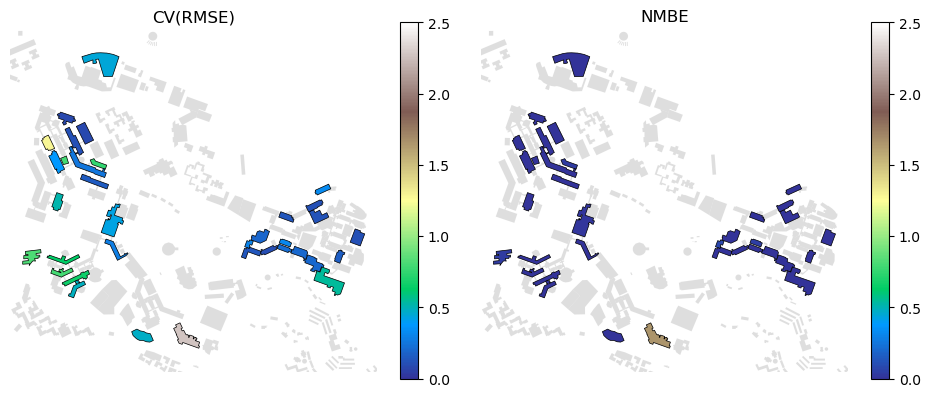

In [228]:
fig, ax = plt.subplots(1, 2, figsize=(9.6, 4))
# get shapefile and calibration results
zone_gdf.plot(ax=ax[0], color='0.75', alpha=0.5)
calibration_results = zone_gdf.merge(results_metrics['CVRMSE']['Cooling'].reset_index(), left_on='Name',
                                     right_on=results_metrics['CVRMSE']['Cooling'].reset_index().columns[0])
# set scale
calib_min = np.floor(calibration_results['Calibration'].min())
calib_max = 2.5

# create plot
calibration_results.plot(ax=ax[0], column='Calibration', legend=True, cmap='terrain', edgecolor='black',
                         linewidth=0.5, vmin=calib_min, vmax=calib_max)
zone_gdf.plot(ax=ax[1], color='0.75', alpha=0.5)
zone_gdf.merge(results_metrics['NMBE']['Cooling'].reset_index(), left_on='Name',
               right_on=results_metrics['CVRMSE']['Cooling'].reset_index().columns[0]).plot(
    ax=ax[1], column='Calibration', legend=True, cmap='terrain', edgecolor='black', linewidth=0.5,
    vmin=calib_min, vmax=calib_max)
ax[0].set_xlim([calibration_results.geometry.total_bounds[0] - 50,
                calibration_results.geometry.total_bounds[2] + 50])
ax[0].set_ylim([calibration_results.geometry.total_bounds[1] - 92,
                calibration_results.geometry.total_bounds[3] + 92])
ax[1].set_xlim([calibration_results.geometry.total_bounds[0] - 50,
                calibration_results.geometry.total_bounds[2] + 50])
ax[1].set_ylim([calibration_results.geometry.total_bounds[1] - 92,
                calibration_results.geometry.total_bounds[3] + 92])
ax[0].set_title('CV(RMSE)')
ax[1].set_title('NMBE')
ax[0].set_axis_off()
ax[1].set_axis_off()
fig.tight_layout()
fig.savefig(os.path.join(os.getcwd(), 'plots', 'Calibration_map.pdf'))

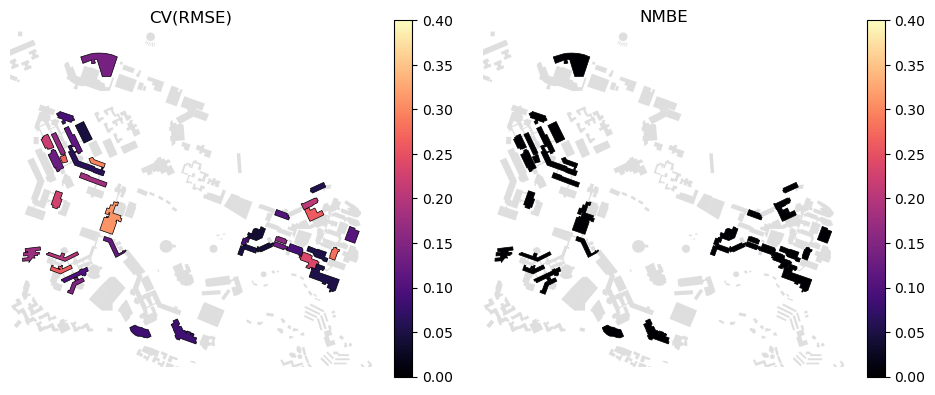

In [229]:
fig, ax = plt.subplots(1, 2, figsize=(9.6, 4))
reg_min = np.floor(regression_results['CV(RMSE)_10_mean'].min())
reg_max = np.ceil(regression_results['CV(RMSE)_10_mean'].max() * 10) / 10

zone_gdf.plot(ax=ax[0], color='0.75', alpha=0.5)
zone_gdf.plot(ax=ax[1], color='0.75', alpha=0.5)
zone_gdf.merge(regression_results.reset_index(), left_on='Name', right_on='index').plot(
    ax=ax[0], column='CV(RMSE)_10_mean', legend=True, cmap='magma', edgecolor='black', linewidth=0.5,
    vmin=reg_min, vmax=reg_max)
zone_gdf.merge(regression_results.reset_index(), left_on='Name', right_on='index').plot(
    ax=ax[1], column='NMBE_10_mean', legend=True, cmap='magma', edgecolor='black', linewidth=0.5,
    vmin=reg_min, vmax=reg_max)
ax[0].set_xlim([calibration_results.geometry.total_bounds[0] - 50,
                calibration_results.geometry.total_bounds[2] + 50])
ax[0].set_ylim([calibration_results.geometry.total_bounds[1] - 92,
                calibration_results.geometry.total_bounds[3] + 92])
ax[1].set_xlim([calibration_results.geometry.total_bounds[0] - 50,
                calibration_results.geometry.total_bounds[2] + 50])
ax[1].set_ylim([calibration_results.geometry.total_bounds[1] - 92,
                calibration_results.geometry.total_bounds[3] + 92])
ax[0].set_title('CV(RMSE)')
ax[1].set_title('NMBE')
ax[0].set_axis_off()
ax[1].set_axis_off()
fig.tight_layout()
fig.savefig(os.path.join(os.getcwd(), 'plots', 'regression_map.pdf'))

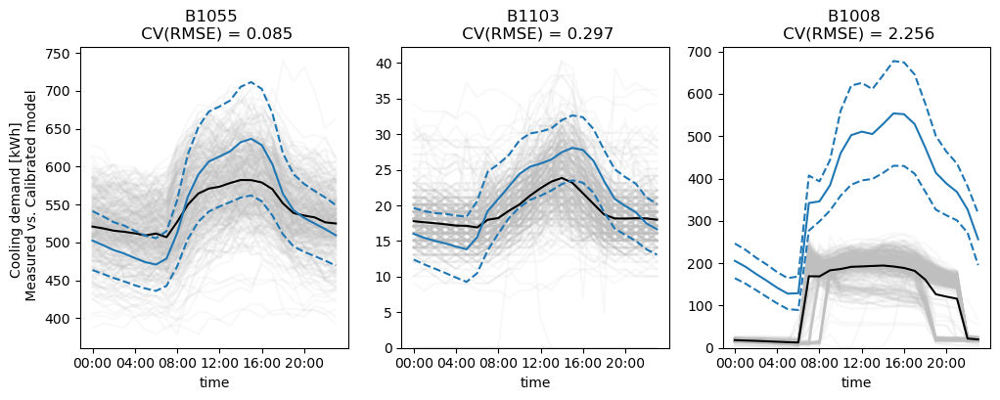

In [242]:
cvrmse_min.sort_values('Qcs_sys_kWh')
fig, ax = plt.subplots(1, 3, figsize=(12, 4))
# plot_buildings = ['B1047', 'B1052', 'B1008']
plot_buildings = [cvrmse_min['Qcs_sys_kWh'].idxmin(),
                  cvrmse_min.loc[cvrmse_min['Qcs_sys_kWh'] == cvrmse_min['Qcs_sys_kWh'].median()].index[0],
                  cvrmse_min['Qcs_sys_kWh'].idxmax()]
for i, building in enumerate(plot_buildings):
    measured_cooling_dict[building].to_frame().pivot_table(
        index=measured_cooling_dict[building].index.time,
        columns=measured_cooling_dict[building].index.date).plot(ax=ax[i], color='0.75',
                                                                 alpha=0.1, legend=False)
    measured_cooling_dict[building].to_frame().pivot_table(
        index=measured_cooling_dict[building].index.time,
        columns=measured_cooling_dict[building].index.date).mean(axis=1).plot(ax=ax[i], color='k')
    combination = cvrmse_min.loc[building, 'Qcs_winning']
    demand_results = pd.read_csv(os.path.join(
        project_folder, 'calibration', years_by_building[building], 'outputs','data', 'demand',
        building + '.csv'), index_col=0, parse_dates=True)
    bl = cvrmse_min.loc[building, 'Qcs_base_load']
    demand_results['Qcs_sys_kWh'] += bl
    demand_results = demand_results.pivot_table(index=demand_results.index.time,
                                                columns=demand_results.index.date,
                                                values='Qcs_sys_kWh')
    demand_results.mean(axis=1).plot(ax=ax[i], color='tab:blue')
    (demand_results.mean(axis=1) - demand_results.std(axis=1)).plot(ax=ax[i],
                                                                    color='tab:blue', linestyle='dashed')
    (demand_results.mean(axis=1) + demand_results.std(axis=1)).plot(ax=ax[i],
                                                                    color='tab:blue', linestyle='dashed')
    if ax[i].get_ylim()[0] < 0:
        ax[i].set_ylim([0, ax[i].get_ylim()[1]])
    ax[i].set_xticks([datetime.time(i, 0) for i in range(0, 24, 4)])
    ax[i].set_title('{} \n CV(RMSE) = {}'.format(building,
                                                 np.round(cvrmse_min.loc[building, 'Qcs_sys_kWh'], 3)))
ax[0].set_ylabel('Cooling demand [kWh] \n Measured vs. Calibrated model')
fig.savefig(os.path.join(os.getcwd(), 'plots', 'measured_vs_calibration.pdf'))

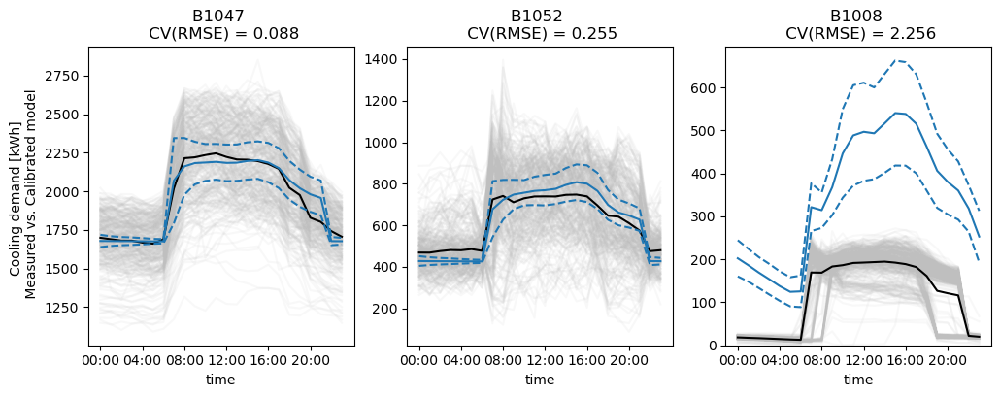

In [256]:
cvrmse_min.sort_values('Qcs_sys_kWh')
fig, ax = plt.subplots(1, 3, figsize=(12, 4))
plot_buildings = ['B1047', 'B1052', 'B1008']
for i, building in enumerate(plot_buildings):
    measured_cooling_dict[building].to_frame().pivot_table(
        index=measured_cooling_dict[building].index.time,
        columns=measured_cooling_dict[building].index.date).plot(ax=ax[i], color='0.75',
                                                                 alpha=0.1, legend=False)
    measured_cooling_dict[building].to_frame().pivot_table(
        index=measured_cooling_dict[building].index.time,
        columns=measured_cooling_dict[building].index.date).mean(axis=1).plot(ax=ax[i], color='k')
    combination = cvrmse_min.loc[building, 'Qcs_winning']
    demand_results = pd.read_csv(os.path.join(
        r'/Users/mromero/Documents/CEA/Wifi_Occupancy_paper', 'calibration', years_by_building[building],
        'outputs','data', 'demand_calib', combination, building + '.csv'), index_col=0, parse_dates=True)
    bl = cvrmse_min.loc[building, 'Qcs_base_load']
    demand_results['Qcs_sys_kWh'] += bl
    demand_results = demand_results.pivot_table(index=demand_results.index.time,
                                                columns=demand_results.index.date,
                                                values='Qcs_sys_kWh')
    demand_results.mean(axis=1).plot(ax=ax[i], color='tab:blue')
    (demand_results.mean(axis=1) - demand_results.std(axis=1)).plot(ax=ax[i],
                                                                    color='tab:blue', linestyle='dashed')
    (demand_results.mean(axis=1) + demand_results.std(axis=1)).plot(ax=ax[i],
                                                                    color='tab:blue', linestyle='dashed')
    if ax[i].get_ylim()[0] < 0:
        ax[i].set_ylim([0, ax[i].get_ylim()[1]])
    ax[i].set_xticks([datetime.time(i, 0) for i in range(0, 24, 4)])
    ax[i].set_title('{} \n CV(RMSE) = {}'.format(building,
                                                 np.round(cvrmse_min.loc[building, 'Qcs_sys_kWh'], 3)))
ax[0].set_ylabel('Cooling demand [kWh] \n Measured vs. Calibrated model')
fig.savefig(os.path.join(os.getcwd(), 'plots', 'measured_vs_calibration.pdf'))

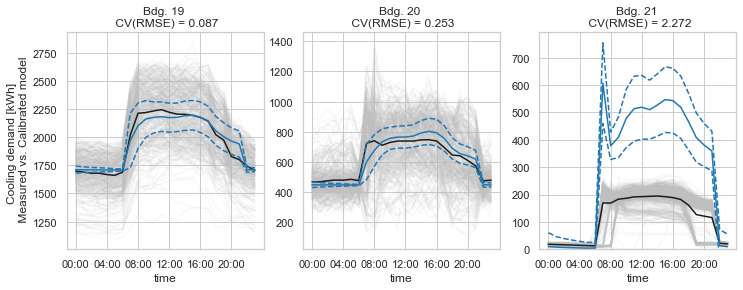

In [782]:
# cvrmse_min.sort_values('Qcs_sys_kWh')
# fig, ax = plt.subplots(1, 3, figsize=(12, 4))
# for i, building in enumerate(['B1047', 'B1052', 'B1008']):
#     measured_cooling_dict[building].to_frame().pivot_table(
#         index=measured_cooling_dict[building].index.time,
#         columns=measured_cooling_dict[building].index.date).plot(ax=ax[i], color='0.75',
#                                                                  alpha=0.1, legend=False)
#     measured_cooling_dict[building].to_frame().pivot_table(
#         index=measured_cooling_dict[building].index.time,
#         columns=measured_cooling_dict[building].index.date).mean(axis=1).plot(ax=ax[i], color='k')
#     combination = cvrmse_min.loc[building, 'Qcs_winning']
#     demand_results = pd.read_csv(os.path.join(
#         project_folder, 'calibration', years_by_building[building], 'outputs','data', 'demand_calib',
#         combination, building + '.csv'), index_col=0, parse_dates=True)
#     bl = cvrmse_min.loc[building, 'Qcs_base_load']
#     demand_results['Qcs_sys_kWh'] += bl
#     demand_results = demand_results.pivot_table(index=demand_results.index.time,
#                                                 columns=demand_results.index.date,
#                                                 values='Qcs_sys_kWh')
#     demand_results.mean(axis=1).plot(ax=ax[i], color='tab:blue')
#     (demand_results.mean(axis=1) - demand_results.std(axis=1)).plot(ax=ax[i],
#                                                                     color='tab:blue', linestyle='dashed')
#     (demand_results.mean(axis=1) + demand_results.std(axis=1)).plot(ax=ax[i],
#                                                                     color='tab:blue', linestyle='dashed')
#     if ax[i].get_ylim()[0] < 0:
#         ax[i].set_ylim([0, ax[i].get_ylim()[1]])
#     ax[i].set_xticks([datetime.time(i, 0) for i in range(0, 24, 4)])
#     ax[i].set_title('{} \n CV(RMSE) = {}'.format(building, np.round(cvrmse_min.loc[building, 'Qcs_sys_kWh'], 3)))
# ax[0].set_ylabel('Cooling demand [kWh] \n Measured vs. Calibrated model')
# fig.savefig(os.path.join(os.getcwd(), 'plots', 'measured_vs_calibration.pdf'))

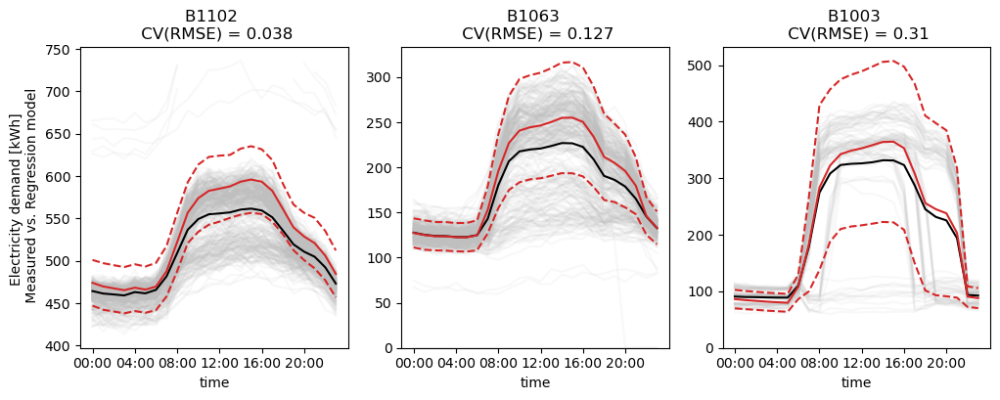

In [271]:
fig, ax = plt.subplots(1, 3, figsize=(12, 4))
plot_buildings = [regression_results['CV(RMSE)_10_mean'].idxmin(),
                  regression_results.loc[regression_results['CV(RMSE)_10_mean'] == regression_results[
                      'CV(RMSE)_10_mean'].median()].index[0],
                  regression_results['CV(RMSE)_10_mean'].idxmax()]
for i, building in enumerate(plot_buildings):
    measured_elec_dict[building].to_frame().pivot_table(
        index=measured_elec_dict[building].index.time,
        columns=measured_elec_dict[building].index.date).plot(ax=ax[i], color='0.75',
                                                                 alpha=0.1, legend=False)
    measured_elec_dict[building].to_frame().pivot_table(
        index=measured_elec_dict[building].index.time,
        columns=measured_elec_dict[building].index.date).mean(axis=1).plot(ax=ax[i], color='k')
    demand_results = pd.read_csv(os.path.join(
        project_folder, 'regression', years_by_building[building], 'outputs','data', 'demand',
        building + '.csv'), index_col=0, parse_dates=True)
    demand_results = demand_results.pivot_table(index=demand_results.index.time,
                                                columns=demand_results.index.date,
                                                values='E_sys_kWh')
    demand_results.mean(axis=1).plot(ax=ax[i], color='tab:red')
    (demand_results.mean(axis=1) - demand_results.std(axis=1)).plot(ax=ax[i],
                                                                    color='tab:red', linestyle='dashed')
    (demand_results.mean(axis=1) + demand_results.std(axis=1)).plot(ax=ax[i],
                                                                    color='tab:red', linestyle='dashed')
    if ax[i].get_ylim()[0] < 0:
        ax[i].set_ylim([0, ax[i].get_ylim()[1]])
    ax[i].set_xticks([datetime.time(i, 0) for i in range(0, 24, 4)])
    ax[i].set_title('{} \n CV(RMSE) = {}'.format(
        building, np.round(regression_results.loc[building, 'CV(RMSE)_10_mean'], 3)))
ax[0].set_ylabel('Electricity demand [kWh] \n Measured vs. Regression model')
fig.savefig(os.path.join(os.getcwd(), 'plots', 'measured_vs_regression.pdf'))

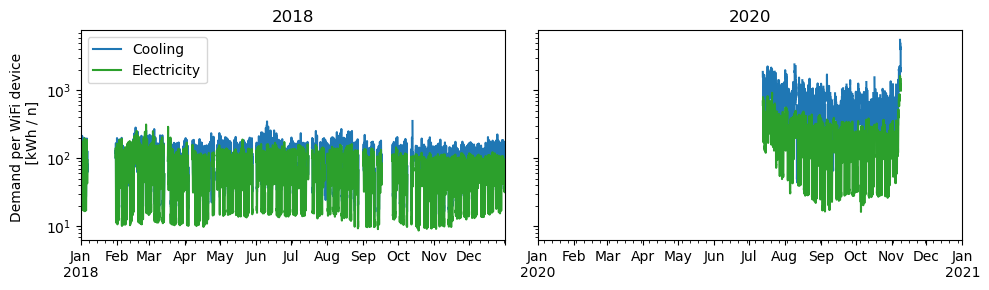

In [244]:
buildings_with_all_years = [b for b in building_data_dict.keys() if (
    2020 in building_data_dict[b].index.year.unique()) & (2018 in building_data_dict[b].index.year.unique())]
if 'B1134' in buildings_with_all_years:
    buildings_with_all_years.remove('B1134')

fig, ax = plt.subplots(1, 2, figsize=(10, 3), sharey=True)
for i in range(2):
    (cooling_data.loc[cooling_data.index.year == int(2018 + i * 2), buildings_with_all_years] / 
      wifi_data.loc[cooling_data.index.year == int(2018 + i * 2), buildings_with_all_years]).dropna().sum(
        axis=1).resample('H').mean().plot(ax=ax[i], label='Cooling', color='tab:blue')
    (electricity_data.loc[electricity_data.index.year == int(2018 + i * 2), buildings_with_all_years] / 
     wifi_data.loc[cooling_data.index.year == int(2018 + i * 2), buildings_with_all_years]).dropna().sum(
        axis=1).resample('H').mean().plot(ax=ax[i], label='Electricity', color='tab:green')
    ax[i].set_title(str(int(2018 + i * 2)))
    ax[i].set_ylabel('Demand per WiFi device \n [kWh / n]')
    ax[i].set_xlabel('')
ax[0].legend(['Cooling', 'Electricity'], loc='upper left')
ax[1].set_xlim([pd.Timestamp('2020-01-01 00:00'), pd.Timestamp('2021-01-01 00:00')])
ax[0].set_yscale('log')
fig.tight_layout()
plt.show()
plt.close()
fig.savefig(os.path.join(os.getcwd(), 'plots', 'Demand_per_device.pdf'))

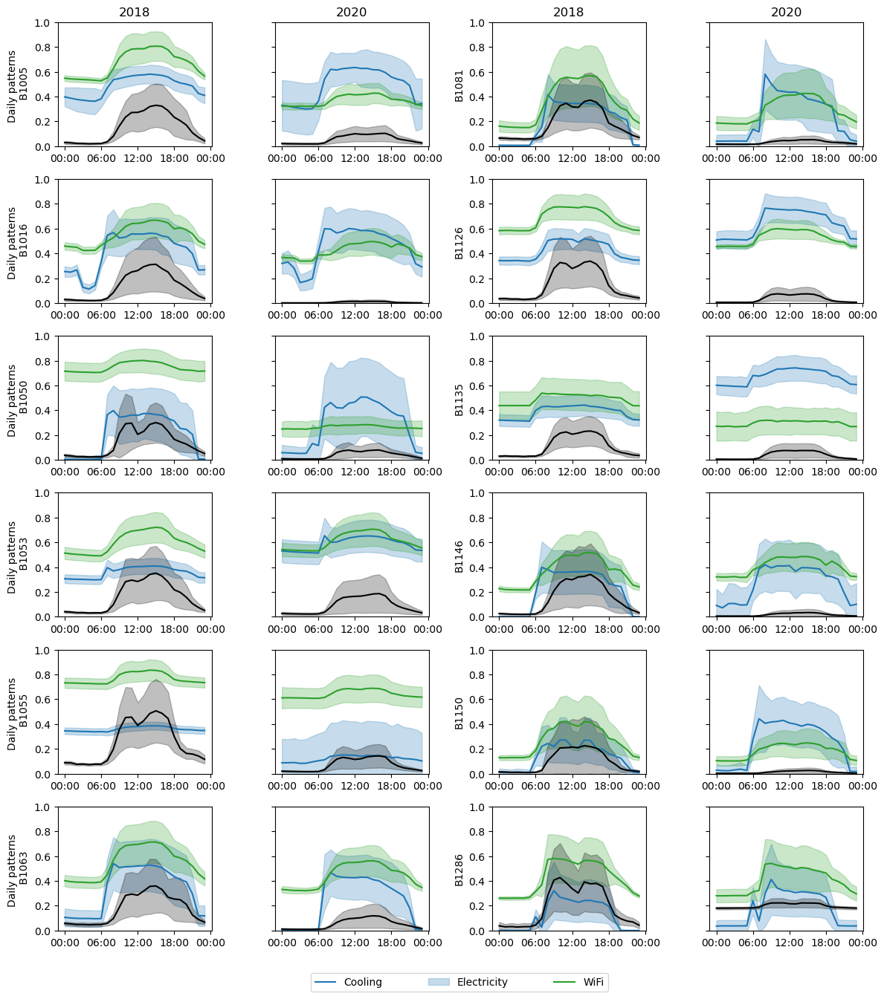

In [245]:
colors = ['tab:blue', 'tab:green', 'k']
width = 12
supercolumns = 2
years = [2018, 2020]

n_rows = int(len(buildings_with_all_years) / supercolumns)
n_cols = len(years) * supercolumns

fig, ax = plt.subplots(n_rows, n_cols, figsize=(width, (width / n_cols) * (3 / 4 * n_rows)))
for m, building in enumerate(buildings_with_all_years):
    for n, y in enumerate(years):
        if m < n_rows:
            i = m
            j = n
        else:
            i = m - n_rows
            j = n + supercolumns
        for k, d in enumerate(['cooling_kWh', 'electricity_kWh', 'people']):
            normalized_data = (building_data_dict[building].loc[building_data_dict[building].index.year == y] /
                               building_data_dict[building][d].max())
            mean = normalized_data.pivot_table(index=normalized_data.index.time,
                                               columns=normalized_data.index.date, values=d).mean(axis=1)
            std = normalized_data.pivot_table(index=normalized_data.index.time,
                                              columns=normalized_data.index.date, values=d).std(axis=1)
            mean.plot(ax=ax[i][j], color=colors[k])
            ax[i][j].fill_between(mean.index, mean - std, mean + std, color=colors[k], alpha=0.25)
            ax[i][j].set_xlabel('')
            ax[i][j].set_xticks([i * 60 * 60 for i in range(0, 25, 6)])
            ax[i][j].set_ylim([0, 1])
        if j == 0:
            ax[i][j].set_ylabel(f'Daily patterns \n {building}')
        elif j == 2:
            ax[i][j].set_ylabel(building)
        else:
            ax[i][j].axes.yaxis.set_ticklabels([])
            ax[i][j].set_ylabel('')
        if (i == n_rows - 1) & (j == 1):
            ax[i][j].legend(['Cooling', 'Electricity', 'WiFi'],
                            loc='upper left', bbox_to_anchor=(0.2, -0.5, 2, 0.2), mode="expand", ncol=3)
ax[0][0].set_title(2018)
ax[0][1].set_title(2020)
ax[0][2].set_title(2018)
ax[0][3].set_title(2020)
fig.tight_layout()
plt.show()
plt.close()
fig.savefig(os.path.join(os.getcwd(), 'plots', 'Daily_all_pivot.pdf'))

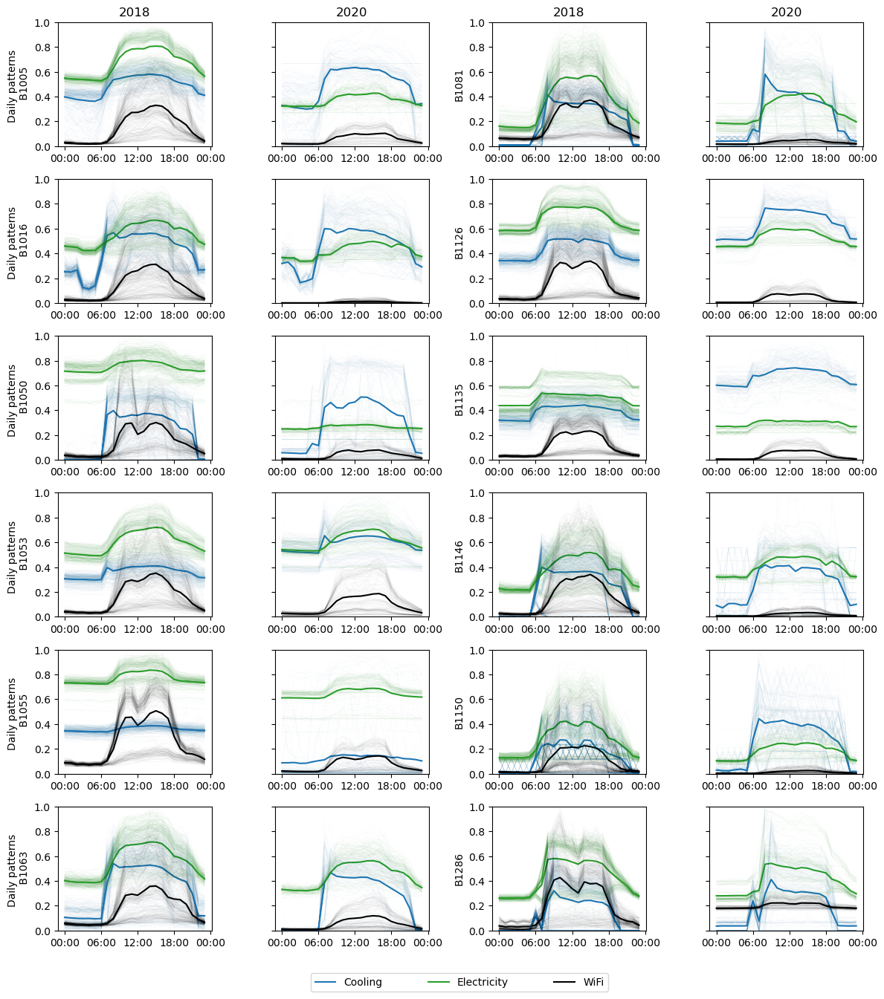

In [246]:
colors = ['tab:blue', 'tab:green', 'k']
width = 12
supercolumns = 2
years = [2018, 2020]

n_rows = int(len(buildings_with_all_years) / supercolumns)
n_cols = len(years) * supercolumns

fig, ax = plt.subplots(n_rows, n_cols, figsize=(width, (width / n_cols) * (3 / 4 * n_rows)))
for m, building in enumerate(buildings_with_all_years):
    for n, y in enumerate(years):
        if m < n_rows:
            i = m
            j = n
        else:
            i = m - n_rows
            j = n + supercolumns
        for k, d in enumerate(['cooling_kWh', 'electricity_kWh', 'people']):
            normalized_data = (building_data_dict[building].loc[building_data_dict[building].index.year == y] /
                               building_data_dict[building][d].max())
            mean = normalized_data.pivot_table(index=normalized_data.index.time,
                                               columns=normalized_data.index.date, values=d).mean(axis=1)
            mean.plot(ax=ax[i][j], color=colors[k])
        for k, d in enumerate(['cooling_kWh', 'electricity_kWh', 'people']):
            normalized_data = (building_data_dict[building].loc[building_data_dict[building].index.year == y] /
                               building_data_dict[building][d].max())
            normalized_data.pivot_table(index=normalized_data.index.time,
                                               columns=normalized_data.index.date, values=d).plot(
                ax=ax[i][j], linewidth=0.5, alpha=0.025, color=colors[k], legend=False)
            ax[i][j].set_xlabel('')
            ax[i][j].set_xticks([i * 60 * 60 for i in range(0, 25, 6)])
            ax[i][j].set_ylim([0, 1])
        if j == 0:
            ax[i][j].set_ylabel(f'Daily patterns \n {building}')
        elif j == 2:
            ax[i][j].set_ylabel(building)
        else:
            ax[i][j].axes.yaxis.set_ticklabels([])
            ax[i][j].set_ylabel('')
        if (i == n_rows - 1) & (j == 1):
            ax[i][j].legend(['Cooling', 'Electricity', 'WiFi'],
                            loc='upper left', bbox_to_anchor=(0.2, -0.5, 2, 0.2), mode="expand", ncol=3)
ax[0][0].set_title(2018)
ax[0][1].set_title(2020)
ax[0][2].set_title(2018)
ax[0][3].set_title(2020)
fig.tight_layout()
plt.show()
plt.close()
fig.savefig(os.path.join(os.getcwd(), 'plots', 'Daily_all_lines.pdf'))

## Create EUI plots

In [251]:
import cea.config
config = cea.config.Configuration()
config.project = os.path.join(project_folder, 'scenarios')
config.scenario_name = 'baseline'
config.scenario

'/Users/mromero/Documents/GitHub/wifi-occupancy-scenarios/CEA_model/scenarios/baseline'

In [249]:
cases = ['baseline',
         'WFH-0.25', 'WFH-0.25-Ns', 'WFH-0.25-closed_buildings',
         'WFH-0.5', 'WFH-0.5-Ns', 'WFH-0.5-closed_buildings',
         'WFH-0.75', 'WFH-0.75-Ns', 'WFH-0.75-closed_buildings']

In [272]:
years = [d.split('_')[1] for d in os.listdir(os.path.join(config.scenario, 'outputs', 'data'))
         if 'demand_' in d]
years.sort()
cea_names = [f.split('.')[0] for f in os.listdir(os.path.join( config.scenario, 'outputs', 'data', 'demand_' + years[0])) if 'Total' not in f]
eui_by_case = pd.DataFrame(index=range(len(cea_names) * len(cases) * len(years)),
                           columns=['Case', 'WFH', 'GFA', 'Closed buildings', 'Year', 'Building', 'Af_m2',
                                    'GFA_m2', 'people0', 'Qcs_sys_kWhm2', 'Eal_kWhm2', 'Qcs_sys_kWhp',
                                    'Eal_kWhp', 'Ecs_sys_kWhm2', 'Ecs_sys_kWhp'], data=None)
i = 0
for case in cases:
    for year in years:
        demand_df = pd.read_csv(os.path.join(config.project, case, 'outputs', 'data', 'demand_' + year,
                                             'Total_demand.csv'), index_col=0)
        for cea_name in cea_names:
            systems_df = pd.read_csv(os.path.join(config.project, case, 'outputs', 'data',
                                                  'systems_' + year, cea_name + '.csv'), index_col=0)
            building_demand = pd.read_csv(os.path.join(config.project, case, 'outputs', 'data',
                                                       'demand_' + year, cea_name + '.csv'), index_col=0)
            eui_by_case.loc[i, 'Case'] = case
            eui_by_case.loc[i, 'Building'] = cea_name
            eui_by_case.loc[i, 'Year'] = year
            if case == 'baseline':
                eui_by_case.loc[i, ['WFH', 'GFA', 'Closed buildings']] = 0
            elif 'Ns' in case:
                eui_by_case.loc[i, ['WFH', 'GFA', 'Closed buildings']] = [float(case.split('-')[1]),
                                                                          1 - float(case.split('-')[1]), 0]
            elif 'closed' in case:
                eui_by_case.loc[i, ['WFH', 'Closed buildings']] = [float(case.split('-')[1]), 
                                                                   1 - float(case.split('-')[1])]
                eui_by_case.loc[i, 'GFA'] = np.round(dbf_to_dataframe(os.path.join(
                    config.project, 'baseline', 'inputs', 'building-properties',
                    'architecture.dbf')).set_index('Name').loc[cea_name, 'Hs_ag'] / dbf_to_dataframe(
                    os.path.join(config.project, case, 'inputs', 'building-properties',
                                 'architecture.dbf')).set_index('Name').loc[cea_name, 'Hs_ag'], 2)
            else:
                eui_by_case.loc[i, ['WFH', 'GFA', 'Closed buildings']] = [float(case.split('-')[1]), 1, 0]
            eui_by_case.loc[i, ['Af_m2', 'Aocc_m2', # 'GFA_m2',
                                'people0']] = demand_df.loc[cea_name, ['Af_m2', 'Aocc_m2', # 'GFA_m2',
                                                                       'people0']]
            eui_by_case.loc[i, 'Qcs_sys_kWhm2'] = 1000 * (demand_df['Qcs_sys_MWhyr'] / demand_df['Aocc_m2']
                                                          # 'GFA_m2']
                                                          # 'Af_m2']
                                                         )[cea_name]
            eui_by_case.loc[i, 'Eal_kWhm2'] = 1000 * (demand_df['Eal_MWhyr'] / demand_df['Aocc_m2']
                                                          # 'GFA_m2']
                                                          # 'Af_m2']
                                                     )[cea_name]
            eui_by_case.loc[
                i, 'Qcs_sys_kWhp'] = 1000 * (demand_df['Qcs_sys_MWhyr'] / demand_df['people0'])[cea_name]
            eui_by_case.loc[i, 'Eal_kWhp'] = 1000 * (demand_df['Eal_MWhyr'] / demand_df['people0'])[cea_name]
            # NOTE! The units in the systems files are wrong: all W should be kW
            eui_by_case.loc[i,
                            'Ecs_sys_kWhm2'] = (building_demand['Qcs_sys_kWh'] * systems_df[
                'wdot_W'] / building_demand['QC_sys_kWh']).sum() / demand_df.loc[cea_name, 'Aocc_m2']
            eui_by_case.loc[i,
                            'Ecs_sys_kWhp'] = (building_demand['Qcs_sys_kWh'] * systems_df[
                'wdot_W'] / building_demand['QC_sys_kWh']).sum() / demand_df.loc[cea_name, 'people0']
            eui_by_case.loc[i,
                            'EC_sys_kWhm2'] = systems_df.sum()['wdot_W'] / demand_df.loc[cea_name, 'Aocc_m2']
            eui_by_case.loc[i,
                            'EC_sys_kWhp'] = systems_df.sum()['wdot_W'] / demand_df.loc[cea_name, 'people0']
            i += 1

In [273]:
eui_by_case.loc[(eui_by_case.Building == 'B1003') &
                (eui_by_case.WFH == 0.25), 
                ['Case', 'WFH', 'GFA', 'Closed buildings', 'Year', 'Building', 'Af_m2', 'people0',
                 'Qcs_sys_kWhm2', 'Ecs_sys_kWhm2']]

,Case,WFH,GFA,Closed buildings,Year,Building,Af_m2,people0,Qcs_sys_kWhm2,Ecs_sys_kWhm2
125,WFH-0.25,0.25,1,0,2020,B1003,26036.0,1749.0,43.723729,18.419725
160,WFH-0.25,0.25,1,0,2040,B1003,26036.0,1749.0,57.914618,24.162725
195,WFH-0.25,0.25,1,0,2060,B1003,26036.0,1749.0,70.875864,29.433177
230,WFH-0.25-Ns,0.25,0.75,0,2020,B1003,19527.0,1749.0,37.108696,16.301035
265,WFH-0.25-Ns,0.25,0.75,0,2040,B1003,19527.0,1749.0,48.551506,21.354774
300,WFH-0.25-Ns,0.25,0.75,0,2060,B1003,19527.0,1749.0,58.972692,26.067176
335,WFH-0.25-closed_buildings,0.25,1.0,0.75,2020,B1003,26036.0,2333.0,49.483676,19.795143
370,WFH-0.25-closed_buildings,0.25,1.0,0.75,2040,B1003,26036.0,2333.0,64.093524,25.382089
405,WFH-0.25-closed_buildings,0.25,1.0,0.75,2060,B1003,26036.0,2333.0,77.396797,30.587571


In [274]:
for col in ['WFH', 'GFA', 'Closed buildings', 'Af_m2', 
            'Qcs_sys_kWhm2', 'Eal_kWhm2', 'Qcs_sys_kWhp', 'Eal_kWhp', 'Ecs_sys_kWhm2', 'Ecs_sys_kWhp',
            'Qcs_sys_kWh', 'QC_sys_kWh', 'Ecs_sys_kWh', 'EC_sys_kWh', 'Aocc_m2']:
    if col in eui_by_case.columns:
        eui_by_case[col] = eui_by_case[col].astype(float)
for col in ['Year', 'people0']:
    eui_by_case[col] = eui_by_case[col].astype(int)
eui_by_case.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1050 entries, 0 to 1049
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Case              1050 non-null   object 
 1   WFH               1050 non-null   float64
 2   GFA               1050 non-null   float64
 3   Closed buildings  1050 non-null   float64
 4   Year              1050 non-null   int64  
 5   Building          1050 non-null   object 
 6   Af_m2             1050 non-null   float64
 7   GFA_m2            0 non-null      object 
 8   people0           1050 non-null   int64  
 9   Qcs_sys_kWhm2     894 non-null    float64
 10  Eal_kWhm2         1050 non-null   float64
 11  Qcs_sys_kWhp      894 non-null    float64
 12  Eal_kWhp          894 non-null    float64
 13  Ecs_sys_kWhm2     1050 non-null   float64
 14  Ecs_sys_kWhp      894 non-null    float64
 15  Aocc_m2           1050 non-null   float64
 16  EC_sys_kWhm2      1050 non-null   float64


In [275]:
demand_by_case = pd.DataFrame(index=range(len(cea_names) * len(cases) * len(years)),
                              columns=['Case', 'WFH', 'GFA', 'Closed buildings', 'Year', 'Building', 'Af_m2',
                                       'GFA_m2', 'people0', 'Qcs_sys_kWh', 'Eal_kWh', 'Ecs_sys_kWh'],
                              data=None)
i = 0
for case in cases:
    for year in years:
        demand_df = pd.read_csv(os.path.join(config.project, case, 'outputs', 'data', 'demand_' + year,
                                             'Total_demand.csv'), index_col=0)
        for cea_name in cea_names:
            systems_df = pd.read_csv(os.path.join(config.project, case, 'outputs', 'data',
                                                  'systems_' + year, cea_name + '.csv'), index_col=0)
            building_demand = pd.read_csv(os.path.join(config.project, case, 'outputs', 'data',
                                                       'demand_' + year, cea_name + '.csv'), index_col=0)
            demand_by_case.loc[i, 'Case'] = case
            demand_by_case.loc[i, 'Building'] = cea_name # building
            demand_by_case.loc[i, 'Year'] = year
            if case == 'baseline':
                demand_by_case.loc[i, ['WFH', 'GFA', 'Closed buildings']] = 0
            elif 'Ns' in case:
                demand_by_case.loc[i, ['WFH', 'GFA', 'Closed buildings']] = [float(case.split('-')[1]),
                                                                             1 - float(case.split('-')[1]), 0]
            elif 'closed' in case:
                demand_by_case.loc[i, ['WFH', 'Closed buildings']] = [float(case.split('-')[1]), 
                                                                      1 - float(case.split('-')[1])]
                demand_by_case.loc[i, 'GFA'] = np.round(dbf_to_dataframe(os.path.join(
                    config.project, 'baseline', 'inputs', 'building-properties',
                    'architecture.dbf')).set_index('Name').loc[cea_name, 'Hs_ag'] / dbf_to_dataframe(
                    os.path.join(config.project, case, 'inputs', 'building-properties',
                                 'architecture.dbf')).set_index('Name').loc[cea_name, 'Hs_ag'], 2)
            else:
                demand_by_case.loc[i, ['WFH', 'GFA', 'Closed buildings']] = [float(case.split('-')[1]), 1, 0]
            demand_by_case.loc[i, ['Af_m2', 'Aocc_m2', 'people0']] = demand_df.loc[
                cea_name, ['Af_m2', 'Aocc_m2', 'people0']]
            demand_by_case.loc[i, 'Qcs_sys_kWh'] = demand_df.loc[cea_name, 'Qcs_sys_MWhyr'] * 1000
            demand_by_case.loc[i, 'QC_sys_kWh'] = demand_df.loc[cea_name, 'QC_sys_MWhyr'] * 1000
            demand_by_case.loc[i, 'Eal_kWh'] = demand_df.loc[cea_name, 'Eal_MWhyr'] * 1000
            # NOTE! The units in the systems files are wrong: all W should be kW
            demand_by_case.loc[i, 'Ecs_sys_kWh'] = (building_demand['Qcs_sys_kWh'] * systems_df[
                'wdot_W'] / building_demand['QC_sys_kWh']).sum()
            demand_by_case.loc[i, 'EC_sys_kWh'] = systems_df.sum()['wdot_W']
            
            i += 1

total_demand_by_scenario = pd.DataFrame(
    columns=['Case', 'WFH', 'Closed buildings', 'Year', 'Aocc_m2',
             'Qcs_sys_kWh', 'QC_sys_kWh', 'Ecs_sys_kWh', 'EC_sys_kWh'], index = range(30))
i = 0
for case in demand_by_case.Case.unique():
    for year in demand_by_case.Year.unique():
        total_demand_by_scenario.loc[i, 'Case'] = case
        total_demand_by_scenario.loc[i, 'Year'] = year
        total_demand_by_scenario.loc[i, ['WFH', 'Closed buildings']] = demand_by_case.loc[
            (demand_by_case.Year == year) & (demand_by_case.Case == case), ['WFH', 'Closed buildings']].mean()
        total_demand_by_scenario.loc[
            i, ['Aocc_m2','Qcs_sys_kWh', 'QC_sys_kWh', 'Ecs_sys_kWh', 'EC_sys_kWh']] = demand_by_case.loc[
            (demand_by_case.Year == year) & (demand_by_case.Case == case), 
            ['Aocc_m2','Qcs_sys_kWh', 'QC_sys_kWh', 'Ecs_sys_kWh', 'EC_sys_kWh']].sum()
        i += 1

In [276]:
total_demand_by_scenario['Building_operation'] = None
for i in total_demand_by_scenario.index:
    if 'closed_buildings' in total_demand_by_scenario.loc[i, 'Case']:
        total_demand_by_scenario.loc[i, 'Building_operation'] = 'Selective \n closure'
    elif 'Ns' in total_demand_by_scenario.loc[i, 'Case']:
        total_demand_by_scenario.loc[i, 'Building_operation'] = 'Occupant- \n driven'
    else:
        total_demand_by_scenario.loc[i, 'Building_operation'] = 'No change'

In [277]:
demand_type = 'Qcs_sys_kWh'
print(demand_type)
for case in ['', '-Ns', '-closed_buildings']:
    for wfh in ['WFH-0.25', 'WFH-0.5', 'WFH-0.75']:
        for year in ['2020', '2040', '2060']:
            baseline_value = total_demand_by_scenario.loc[
                (total_demand_by_scenario.Case == 'baseline') &
                (total_demand_by_scenario.Year == year), demand_type].values[0]
            case_value = total_demand_by_scenario.loc[
                (total_demand_by_scenario.Case == wfh + case) &
                (total_demand_by_scenario.Year == year), demand_type].values[0]
            print(f'{case}, {wfh}, {year}: {case_value / baseline_value}')

Qcs_sys_kWh
, WFH-0.25, 2020: 0.9397760052566881
, WFH-0.25, 2040: 0.9475662346639826
, WFH-0.25, 2060: 0.9533033754161435
, WFH-0.5, 2020: 0.8824463231048785
, WFH-0.5, 2040: 0.8978309919620453
, WFH-0.5, 2060: 0.9093012448746861
, WFH-0.75, 2020: 0.827804634758729
, WFH-0.75, 2040: 0.851026533617772
, WFH-0.75, 2060: 0.8684985252702576
-Ns, WFH-0.25, 2020: 0.7872056378452998
-Ns, WFH-0.25, 2040: 0.7874551282394763
-Ns, WFH-0.25, 2060: 0.7878831873733172
-Ns, WFH-0.5, 2020: 0.5647501147847817
-Ns, WFH-0.5, 2040: 0.5650105212751785
-Ns, WFH-0.5, 2060: 0.5657585312890675
-Ns, WFH-0.75, 2020: 0.3192777173484153
-Ns, WFH-0.75, 2040: 0.3201544326358795
-Ns, WFH-0.75, 2060: 0.3215557198356179
-closed_buildings, WFH-0.25, 2020: 0.517926376258866
-closed_buildings, WFH-0.25, 2040: 0.5516686961802781
-closed_buildings, WFH-0.25, 2060: 0.5754528184032848
-closed_buildings, WFH-0.5, 2020: 0.2594537486760272
-closed_buildings, WFH-0.5, 2040: 0.29233081543580774
-closed_buildings, WFH-0.5, 2060: 0

In [277]:
demand_type = 'Ecs_sys_kWh'
print(demand_type)
for case in ['', '-Ns', '-closed_buildings']:
    for wfh in ['WFH-0.25', 'WFH-0.5', 'WFH-0.75']:
        for year in ['2020', '2040', '2060']:
            baseline_value = total_demand_by_scenario.loc[
                (total_demand_by_scenario.Case == 'baseline') &
                (total_demand_by_scenario.Year == year), demand_type].values[0]
            case_value = total_demand_by_scenario.loc[
                (total_demand_by_scenario.Case == wfh + case) &
                (total_demand_by_scenario.Year == year), demand_type].values[0]
            print(f'{case}, {wfh}, {year}: {case_value / baseline_value}')

Ecs_sys_kWh
, WFH-0.25, 2020: 0.9622532202947107
, WFH-0.25, 2040: 0.9706773616610919
, WFH-0.25, 2060: 0.9759183746659008
, WFH-0.5, 2020: 0.9223968052081538
, WFH-0.5, 2040: 0.9396954556171256
, WFH-0.5, 2060: 0.9508956404010791
, WFH-0.75, 2020: 0.8797369564702335
, WFH-0.75, 2040: 0.9064048698866634
, WFH-0.75, 2060: 0.9241264417914142
-Ns, WFH-0.25, 2020: 0.862852960455115
-Ns, WFH-0.25, 2040: 0.868720429670615
-Ns, WFH-0.25, 2060: 0.8733307327632771
-Ns, WFH-0.5, 2020: 0.681462602908132
-Ns, WFH-0.5, 2040: 0.6917063194743599
-Ns, WFH-0.5, 2060: 0.7008959743011979
-Ns, WFH-0.75, 2020: 0.42633597905911763
-Ns, WFH-0.75, 2040: 0.4381590805574535
-Ns, WFH-0.75, 2060: 0.4493824135600743
-closed_buildings, WFH-0.25, 2020: 0.5354787556935097
-closed_buildings, WFH-0.25, 2040: 0.5637554241875068
-closed_buildings, WFH-0.25, 2060: 0.58389685673687
-closed_buildings, WFH-0.5, 2020: 0.26520991315147824
-closed_buildings, WFH-0.5, 2040: 0.295503617976955
-closed_buildings, WFH-0.5, 2060: 0.3

In [274]:
for case in ['Ns', 'closed_buildings']:
    for wfh in ['0.25', '0.5', '0.75']:
        for year in ['2020', '2040', '2060']:
            baseline_value = total_demand_by_scenario.loc[
                (total_demand_by_scenario.Case == 'WFH-' + wfh) &
                (total_demand_by_scenario.Year == year), 'Qcs_sys_kWh'].values[0]
            case_value = total_demand_by_scenario.loc[
                (total_demand_by_scenario.Case == '-'.join(['WFH', wfh, case])) &
                (total_demand_by_scenario.Year == year), 'Qcs_sys_kWh'].values[0]
            print(f'{case}, {wfh}, {year}: {case_value / baseline_value}')

Ns, 0.25, 2020: 0.8376524123216834
Ns, 0.25, 2040: 0.8310291137787498
Ns, 0.25, 2060: 0.8264768673764363
Ns, 0.5, 2020: 0.6399823989267858
Ns, 0.5, 2040: 0.6293061014082967
Ns, 0.5, 2060: 0.6221904286153668
Ns, 0.75, 2020: 0.38569211132947046
Ns, 0.75, 2040: 0.376197944469347
Ns, 0.75, 2060: 0.37024325370680033
closed_buildings, 0.25, 2020: 0.5511168335452454
closed_buildings, 0.25, 2040: 0.5821953927852926
closed_buildings, 0.25, 2060: 0.6036408065292789
closed_buildings, 0.5, 2020: 0.29401646523172287
closed_buildings, 0.5, 2040: 0.32559670812540376
closed_buildings, 0.5, 2060: 0.34841659010831655
closed_buildings, 0.75, 2020: 0.1217016656062761
closed_buildings, 0.75, 2040: 0.1400647392034082
closed_buildings, 0.75, 2060: 0.153027128245002


In [282]:
total_demand_by_scenario['Year'] = total_demand_by_scenario['Year'].astype(int)
total_demand_by_scenario[['Qcs_sys_%', 'QC_sys_%',
                          'Ecs_sys_%', 'EC_sys_%']] = total_demand_by_scenario[
    ['Qcs_sys_kWh', 'QC_sys_kWh', 'Ecs_sys_kWh', 'EC_sys_kWh']] / total_demand_by_scenario.loc[
    (total_demand_by_scenario.Case == 'baseline') & (total_demand_by_scenario.Year == 2020),
    ['Qcs_sys_kWh', 'QC_sys_kWh', 'Ecs_sys_kWh', 'EC_sys_kWh']].values

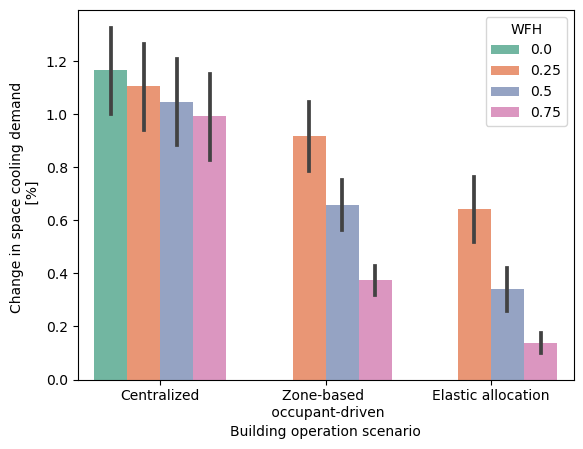

In [285]:
sns.barplot(x='Building_operation', y='Qcs_sys_%', hue='WFH', data=total_demand_by_scenario.replace(
    {'No change': 'Centralized', 'Occupant- \n driven': 'Zone-based \n occupant-driven',
     'Selective \n closure': 'Elastic allocation'}),
            palette="Set2")
plt.ylabel('Change in space cooling demand \n [%]')
plt.xlabel('Building operation scenario')
plt.savefig(os.path.join(os.getcwd(), 'plots', 'qcs_%_rename.pdf'))

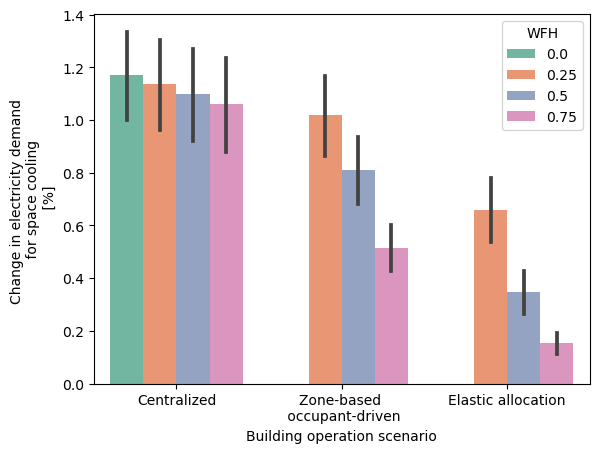

In [286]:
sns.barplot(x='Building_operation', y='Ecs_sys_%', hue='WFH', data=total_demand_by_scenario.replace(
    {'No change': 'Centralized', 'Occupant- \n driven': 'Zone-based \n occupant-driven',
     'Selective \n closure': 'Elastic allocation'}), palette="Set2")
plt.ylabel('Change in electricity demand \n for space cooling \n [%]')
plt.xlabel('Building operation scenario')
plt.savefig(os.path.join(os.getcwd(), 'plots', 'ecs_%_rename.pdf'))

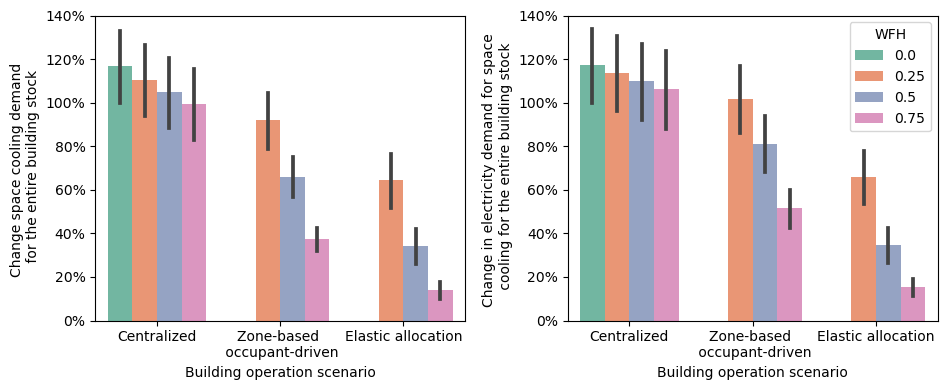

In [288]:
import matplotlib.ticker as mtick
fig, ax = plt.subplots(1, 2, figsize=(9.6, 4)) # , sharey=True)
sns.barplot(x='Building_operation', y='Qcs_sys_%', hue='WFH', data=total_demand_by_scenario.replace(
    {'No change': 'Centralized', 'Occupant- \n driven': 'Zone-based \n occupant-driven',
     'Selective \n closure': 'Elastic allocation'}), ax=ax[0], palette="Set2")
ax[0].set_ylabel('Change space cooling demand \n for the entire building stock')
ax[0].set_xlabel('Building operation scenario')
ax[0].set_ylim([0, 1.4])
ax[0].yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
ax[0].get_legend().remove()
sns.barplot(x='Building_operation', y='Ecs_sys_%', hue='WFH', data=total_demand_by_scenario.replace(
    {'No change': 'Centralized', 'Occupant- \n driven': 'Zone-based \n occupant-driven',
     'Selective \n closure': 'Elastic allocation'}), ax=ax[1], palette="Set2")
ax[1].set_ylabel('Change in electricity demand for space \n cooling for the entire building stock')
ax[1].set_xlabel('Building operation scenario')
ax[1].set_ylim([0, 1.4])
ax[1].yaxis.set_major_formatter(mtick.PercentFormatter(1.0))
fig.tight_layout()
fig.savefig(os.path.join(os.getcwd(), 'plots', 'change_campus_qcs_ecs_rename.pdf'))

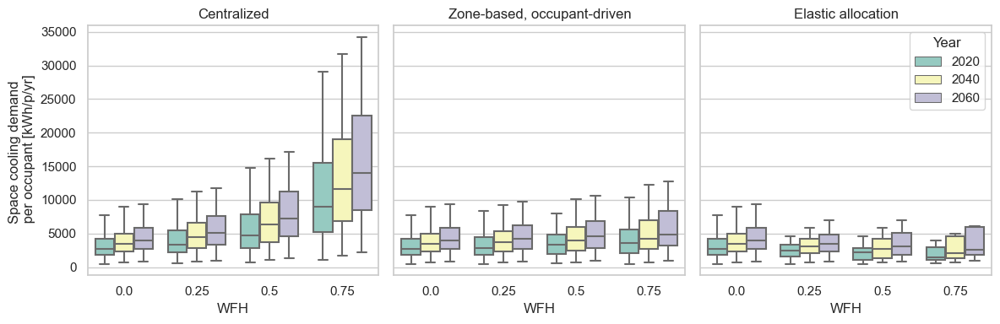

In [292]:
eui_by_case.sort_values('Year', inplace=True)
import seaborn as sns
year_cases = [range(2020, 2061, 20)]
building_cases = ['', '-Ns', '-closed_buildings']
fig, ax = plt.subplots(len(year_cases), len(building_cases), figsize=(12, 4), sharey=True)
for i, case in enumerate(building_cases):
    sns.set_theme(style="whitegrid")
    sns.boxplot(x='WFH', y="Qcs_sys_kWhp", hue="Year",
                data=eui_by_case[(eui_by_case.Qcs_sys_kWhp > 0) & (eui_by_case.Year.isin(year_cases[0])) &
                                 (eui_by_case.Case.isin(
                                     ['baseline'] + ['WFH-' + str(i) + case for i in WFH_RANGE]))].sort_values(
                    'Case').sort_values('Year'), palette="Set3", showfliers = False, ax=ax[i])
    if i == 0:
        ax[i].set_title('Centralized')
        ax[i].set_ylabel('Space cooling demand \n per occupant [kWh/p/yr]')
        ax[i].get_legend().remove()
    elif i == 1:
        ax[i].set_title('Zone-based, occupant-driven')
        ax[i].get_legend().remove()
        ax[i].set_ylabel('')
    else:
        ax[i].set_title('Elastic allocation')
        ax[i].set_ylabel('')
fig.tight_layout()
plt.show()
plt.close()
fig.savefig(os.path.join(os.getcwd(), 'plots', 'qcs_kwh_p_rename.pdf'))

In [290]:
eui_by_case.drop('GFA_m2', axis=1, inplace=True)
eui_by_case.fillna(0, inplace=True)
eui_by_case.sort_values('Year', inplace=True)

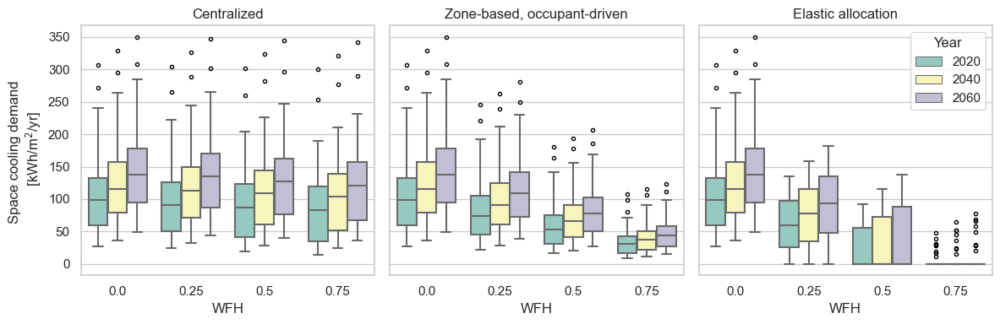

In [291]:
import seaborn as sns
year_cases = [range(2020, 2061, 20)]
building_cases = ['', '-Ns', '-closed_buildings']
fig, ax = plt.subplots(len(year_cases), len(building_cases), figsize=(12, 4), sharey=True)
for i, case in enumerate(building_cases):
    sns.set_theme(style="whitegrid")
    sns.boxplot(x='WFH', y="Qcs_sys_kWhm2", hue="Year",
                data=eui_by_case[(eui_by_case.Year.isin(year_cases[0])) & (eui_by_case.Case.isin(
                    ['baseline'] + ['WFH-' + str(i) + case for i in WFH_RANGE]))].sort_values(
                    'Case').sort_values('Year'), palette="Set3", # showfliers = False,
                flierprops=dict(marker='o', markerfacecolor='None', markersize=3,  markeredgecolor='black'),
                ax=ax[i])
    if i == 0:
        ax[i].set_title('Centralized')
        ax[i].set_ylabel('Space cooling demand \n [kWh/m$^2$/yr]')
        ax[i].get_legend().remove()
    elif i == 1:
        ax[i].set_title('Zone-based, occupant-driven')
        ax[i].get_legend().remove()
        ax[i].set_ylabel('')
    else:
        ax[i].set_title('Elastic allocation')
        ax[i].set_ylabel('')
fig.tight_layout()
fig.savefig(os.path.join(os.getcwd(), 'plots', 'qcs_kwh_m2_rename.pdf'))

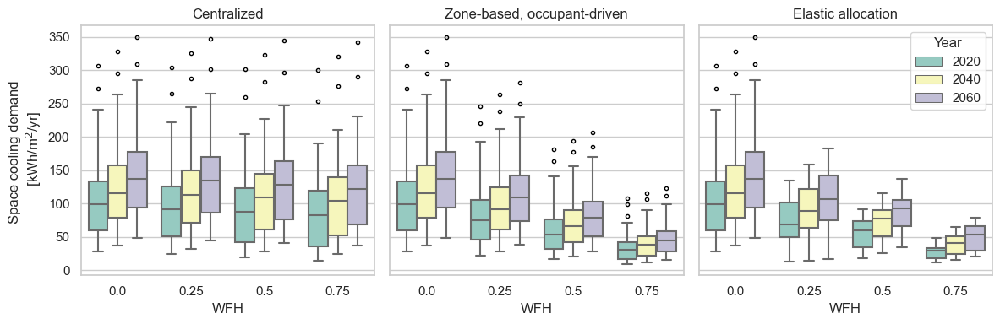

In [294]:
import seaborn as sns
year_cases = [range(2020, 2061, 20)]
building_cases = ['', '-Ns', '-closed_buildings']
fig, ax = plt.subplots(len(year_cases), len(building_cases), figsize=(12, 4), sharey=True)
for i, case in enumerate(building_cases):
    sns.set_theme(style="whitegrid")
    sns.boxplot(x='WFH', y="Qcs_sys_kWhm2", hue="Year",
                data=eui_by_case[(eui_by_case.Year.isin(year_cases[0])) & (eui_by_case.Case.isin(
                    ['baseline'] + ['WFH-' + str(i) + case for i in WFH_RANGE])) & 
                                 (eui_by_case.Qcs_sys_kWhm2 > 0)].sort_values('Case').sort_values('Year'),
                palette="Set3",
                flierprops=dict(marker='o', markerfacecolor='None', markersize=3,  markeredgecolor='black'),
                ax=ax[i])
    if i == 0:
        ax[i].set_title('Centralized')
        ax[i].set_ylabel('Space cooling demand \n [kWh/m$^2$/yr]')
        ax[i].get_legend().remove()
    elif i == 1:
        ax[i].set_title('Zone-based, occupant-driven')
        ax[i].get_legend().remove()
        ax[i].set_ylabel('')
    else:
        ax[i].set_title('Elastic allocation')
        ax[i].set_ylabel('')
fig.tight_layout()
plt.show()
plt.close()
fig.savefig(os.path.join(os.getcwd(), 'plots', 'qcs_kwh_m2_no_zeros.pdf'))

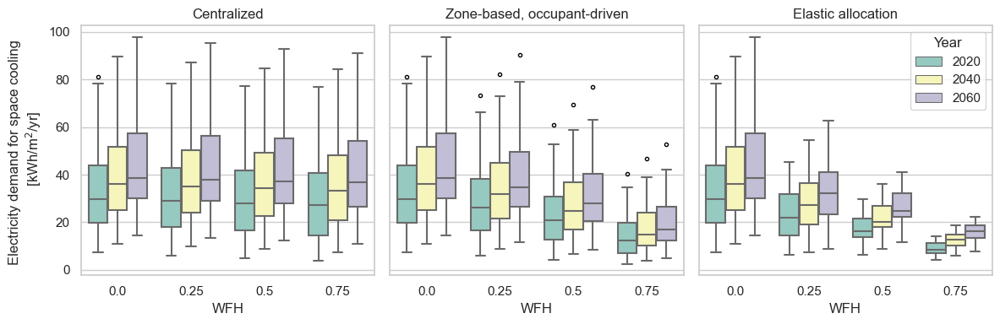

In [295]:
import seaborn as sns
year_cases = [[str(y) for y in range(2020, 2061, 20)]]
year_cases = [range(2020, 2061, 20)]
building_cases = ['', '-Ns', '-closed_buildings']
fig, ax = plt.subplots(len(year_cases), len(building_cases), figsize=(12, 4), sharey=True)
for i, case in enumerate(building_cases):
    sns.set_theme(style="whitegrid")
    sns.boxplot(x='WFH', y="Ecs_sys_kWhm2", hue="Year",
                data=eui_by_case[(eui_by_case.Year.isin(year_cases[0])) & (eui_by_case.Case.isin(
                    ['baseline'] + ['WFH-' + str(i) + case for i in WFH_RANGE])) & 
                                 (eui_by_case.Qcs_sys_kWhm2 > 0)].sort_values('Case').sort_values('Year'),
                palette="Set3", # showfliers = False,
                flierprops=dict(marker='o', markerfacecolor='None', markersize=3,  markeredgecolor='black'),
                ax=ax[i])
    if i == 0:
        ax[i].set_title('Centralized')
        ax[i].set_ylabel('Electricity demand for space cooling \n [kWh/m$^2$/yr]')
        ax[i].get_legend().remove()
    elif i == 1:
        ax[i].set_title('Zone-based, occupant-driven')
        ax[i].get_legend().remove()
        ax[i].set_ylabel('')
    else:
        ax[i].set_title('Elastic allocation')
        ax[i].set_ylabel('')
fig.tight_layout()
fig.savefig(os.path.join(os.getcwd(), 'plots', 'ecs_kwh_m2_no_zeros_rename.pdf'))

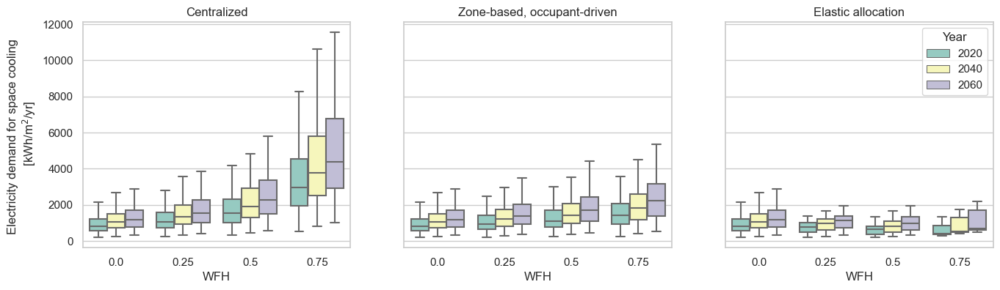

In [304]:
import seaborn as sns
year_cases = [[y for y in range(2020, 2061, 20)]]
building_cases = ['', '-Ns', '-closed_buildings']
fig, ax = plt.subplots(len(year_cases), len(building_cases), figsize=(16, 4), sharey=True)
for i, case in enumerate(building_cases):
    sns.set_theme(style="whitegrid")
    sns.boxplot(x='WFH', y="Ecs_sys_kWhp", hue="Year",
                data=eui_by_case[(eui_by_case.Year.isin(year_cases[0])) & (eui_by_case.Case.isin(
                    ['baseline'] + ['WFH-' + str(i) + case for i in WFH_RANGE])) & 
                                 (eui_by_case.Qcs_sys_kWhm2 > 0)].sort_values('Case').sort_values('Year'),
                palette="Set3", showfliers = False,
                flierprops=dict(marker='o', markerfacecolor='None', markersize=3,  markeredgecolor='black'),
                ax=ax[i])
    if i == 0:
        ax[i].set_title('Centralized')
        ax[i].set_ylabel('Electricity demand for space cooling \n [kWh/m$^2$/yr]')
        ax[i].get_legend().remove()
    elif i == 1:
        ax[i].set_title('Zone-based, occupant-driven')
        ax[i].get_legend().remove()
        ax[i].set_ylabel('')
    else:
        ax[i].set_title('Elastic allocation')
        ax[i].set_ylabel('')
fig.savefig(os.path.join(os.getcwd(), 'plots', 'ecs_kwh_p_no_zeros.pdf'))

In [306]:
cases = ['baseline'] + ['-'.join(['WFH', wfh]) for wfh in ['0.25', '0.5', '0.75']] + [
    '-'.join(['WFH', wfh, case]) for case in ['Ns', 'closed_buildings'] for wfh in ['0.25', '0.5', '0.75']]
years = [d.split('_')[1] for d in os.listdir(os.path.join(config.scenario, 'outputs', 'data'))
         if 'demand_' in d]
years.sort()
cea_names = [f.split('.')[0] for f in os.listdir(os.path.join(
                config.scenario, 'outputs', 'data', 'demand_' + years[0])) if 'Total' not in f]
cop_by_case = pd.DataFrame(index=range(len(cea_names) * len(cases) * len(years) * 8760),
                           columns=['Case', 'WFH', 'GFA', 'Closed buildings', 'Year', 'Building', 'DateTime',
                                    'COP', 'Demand met'], data=None)
i = 0
for case in cases:
    for year in years:
        for cea_name in cea_names:
            systems_df = pd.read_csv(os.path.join(config.project, case, 'outputs', 'data',
                                                  'systems_' + year, cea_name + '.csv'), index_col=0)
            cop_by_case.loc[i:i+8759, 'Case'] = case
            cop_by_case.loc[i:i+8759, 'Building'] = cea_name
            cop_by_case.loc[i:i+8759, 'Year'] = year
            if case == 'baseline':
                cop_by_case.loc[i:i+8759, ['WFH', 'Closed buildings']] = 0
                cop_by_case.loc[i:i+8759, 'GFA'] = 1
            elif 'Ns' in case:
                cop_by_case.loc[i:i+8759, ['WFH', 'GFA', 'Closed buildings']] = [
                    float(case.split('-')[1]), 1 - float(case.split('-')[1]), 0]
            elif 'closed' in case:
                cop_by_case.loc[i:i+8759, ['WFH', 'Closed buildings']] = [
                    float(case.split('-')[1]), 1 - float(case.split('-')[1])]
                cop_by_case.loc[i, 'GFA'] = np.round(dbf_to_dataframe(os.path.join(
                    config.project, 'baseline', 'inputs', 'building-properties',
                    'architecture.dbf')).set_index('Name').loc[cea_name, 'Hs_ag'] / dbf_to_dataframe(
                    os.path.join(config.project, case, 'inputs', 'building-properties',
                                 'architecture.dbf')).set_index('Name').loc[cea_name, 'Hs_ag'], 2)
            else:
                cop_by_case.loc[i:i+8759, ['WFH', 'GFA', 'Closed buildings']] = [
                    float(case.split('-')[1]), 1, 0]
            cop_by_case.loc[i:i+8759, 'COP'] = (systems_df['q_chw_W'] / systems_df['wdot_W']).values
            cop_by_case.loc[i:i+8759,
                            'Demand met'] = (systems_df['q_chw_W'] <= design_capacity[cea_name]).values
            cop_by_case.loc[i:i+8759,
                            'Unmet load'] = (systems_df['q_chw_W'] > design_capacity[cea_name]).values * (
                systems_df['q_chw_W'] - design_capacity[cea_name]).values
            i += 8760
cop_by_case['WFH_Year'] = [str(cop_by_case.loc[i, 'WFH']) + '\n' + str(cop_by_case.loc[i, 'Year'])
                           for i in cop_by_case.index]
cop_by_case = cop_by_case.loc[cop_by_case['COP'].dropna().index]

In [307]:
cop_by_case['Year'] = cop_by_case['Year'].astype(int)

In [308]:
buildings = list(eui_by_case.Building.unique())
n = len(cases) * len([int(y) for y in years]) * len(buildings)
t0 = time.time()

eui_by_case['Unmet hours'] = 0
i = 0
for case in cases:
    for year in [int(y) for y in years]:
        for building in buildings:
            eui_by_case.loc[(eui_by_case.Case == case) & (eui_by_case.Year == year) &
                            (eui_by_case.Building == building), 'Unmet hours'] = abs(
                cop_by_case.loc[(cop_by_case.Case == case) & (cop_by_case.Year == year) &
                                (cop_by_case.Building == building), 'Demand met'] - 1).sum()
            i += 1
            if i % 50 == 0:
                print(f'Case {i} of {n} done: {time.time() - t0} s')

Case 50 of 1050 done: 40.18386912345886 s
Case 100 of 1050 done: 80.69846510887146 s
Case 150 of 1050 done: 121.19313311576843 s
Case 200 of 1050 done: 161.32277011871338 s
Case 250 of 1050 done: 201.35762405395508 s
Case 300 of 1050 done: 241.5259141921997 s
Case 350 of 1050 done: 281.94316005706787 s
Case 400 of 1050 done: 322.4869329929352 s
Case 450 of 1050 done: 362.9458041191101 s
Case 500 of 1050 done: 402.96806716918945 s
Case 550 of 1050 done: 443.0977680683136 s
Case 600 of 1050 done: 483.29811835289 s
Case 650 of 1050 done: 522.9968011379242 s
Case 700 of 1050 done: 563.0912473201752 s
Case 750 of 1050 done: 603.1850562095642 s
Case 800 of 1050 done: 642.9913611412048 s
Case 850 of 1050 done: 682.8186092376709 s
Case 900 of 1050 done: 722.7672111988068 s
Case 950 of 1050 done: 762.6584300994873 s
Case 1000 of 1050 done: 803.1822521686554 s
Case 1050 of 1050 done: 843.3001642227173 s


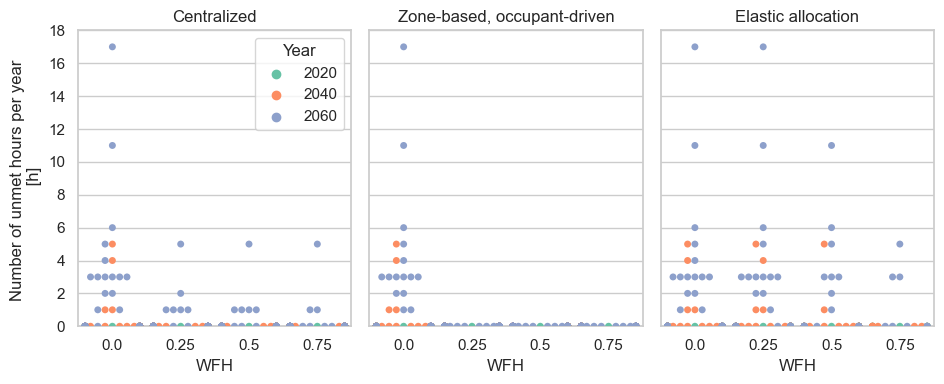

In [311]:
year_cases = [range(2020, 2061, 20)]
building_cases = ['', '-Ns', '-closed_buildings']
fig, ax = plt.subplots(len(year_cases), len(building_cases), figsize=(9.6, 4), sharey=True)
for i, case in enumerate(building_cases):
    sns.set_theme(style="whitegrid")
    sns.swarmplot(x='WFH', y="Unmet hours", hue="Year",
                data=eui_by_case[(eui_by_case.Year.isin(year_cases[0])) & (eui_by_case.Case.isin(
                    ['baseline'] + ['WFH-' + str(i) + case for i in WFH_RANGE])) & 
                                 (eui_by_case.Qcs_sys_kWhm2 > 0)].sort_values('Case').sort_values('Year'),
                palette="Set2", ax=ax[i])
    if i == 0:
        ax[i].set_title('Centralized')
        ax[i].set_ylabel('Number of unmet hours per year \n [h]')
    elif i == 1:
        ax[i].set_title('Zone-based, occupant-driven')
        ax[i].get_legend().remove()
        ax[i].set_ylabel('')
    else:
        ax[i].set_title('Elastic allocation')
        ax[i].set_ylabel('')
        ax[i].get_legend().remove()
ax[0].set_ylim([0, 18])
fig.tight_layout()
fig.savefig(os.path.join(os.getcwd(), 'plots', 'unmet_hours_rename.pdf'))